01_task_NW_load_data.ipynb

02_task_NW_strategies.ipynb

03_task_NW_EDA.ipynb <<<<< we're here

04_task_NW_backtest.ipynb

------

Exploring the spread and potential for building a strategy

------

Since we only have one day of data, we're stuck analyzing and testing on the same dataset

# init

In [2]:
import numpy as np
import datetime
import pandas as pd
from numba import njit, prange
import pickle
import matplotlib.pyplot as plt

# load

In [3]:
with open('/content/drive/MyDrive/Colab Notebooks/data/test01/snapshots_D.pkl', 'rb') as file:
    snapshots_D = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/snapshots_receive_ms_D.pkl', 'rb') as file:
    snapshots_receive_ms_D = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/snapshots_server_ms_D.pkl', 'rb') as file:
    snapshots_server_ms_D = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/trades_D.pkl', 'rb') as file:
    trades_D = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/trades_receive_ms_D.pkl', 'rb') as file:
    trades_receive_ms_D = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/trades_server_ms_D.pkl', 'rb') as file:
    trades_server_ms_D = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/snapshots_B.pkl', 'rb') as file:
    snapshots_B = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/snapshots_receive_ms_B.pkl', 'rb') as file:
    snapshots_receive_ms_B = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/snapshots_server_ms_B.pkl', 'rb') as file:
    snapshots_server_ms_B = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/trades_B.pkl', 'rb') as file:
    trades_B = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/trades_receive_ms_B.pkl', 'rb') as file:
    trades_receive_ms_B = pickle.load(file)

with open('/content/drive/MyDrive/Colab Notebooks/data/test01/trades_server_ms_B.pkl', 'rb') as file:
    trades_server_ms_B = pickle.load(file)

# NUBMERS

In [4]:
print(f'len of snapshots_D: {len(snapshots_D):_}')
print(f'len of snapshots_B: {len(snapshots_B):_}')
print(f'len of trades_D: {len(trades_D):_}')
print(f'len of trades_B: {len(trades_B):_}')

len of snapshots_D: 9_978_022
len of snapshots_B: 6_042_577
len of trades_D: 56_468
len of trades_B: 111_237


In [5]:
print(f'ratio in Deribit: {len(trades_D)/len(snapshots_D)*100:.2f}%')
print(f'ratio in Bitmex: {len(trades_B)/len(snapshots_B)*100:.2f}%')

ratio in Deribit: 0.57%
ratio in Bitmex: 1.84%


# TIMES

In [6]:
freq_snapshots_D = (snapshots_receive_ms_D[-1] - snapshots_receive_ms_D[0])/len(snapshots_receive_ms_D)
freq_snapshots_B = (snapshots_receive_ms_B[-1] - snapshots_receive_ms_B[0])/len(snapshots_receive_ms_B)
freq_trades_D = (trades_receive_ms_D[-1] - trades_receive_ms_D[0])/len(trades_receive_ms_D)
freq_trades_B = (trades_receive_ms_B[-1] - trades_receive_ms_B[0])/len(trades_receive_ms_B)
print(f'Avg freq of snapshots_D: {freq_snapshots_D:.2f} us')
print(f'Avg freq of snapshots_B: {freq_snapshots_B:.2f} us')
print(f'Avg freq of trades_D: {freq_trades_D:.2f} us -> {(freq_trades_D/1000):.2f} ms -> {(freq_trades_D/1_000_000):.2f} s')
print(f'Avg freq of trades_B: {freq_trades_B:.2f} us -> {(freq_trades_B/1000):.2f} ms -> {(freq_trades_B/1_000_000):.2f} s')

Avg freq of snapshots_D: 8659.03 us
Avg freq of snapshots_B: 14298.50 us
Avg freq of trades_D: 1529869.26 us -> 1529.87 ms -> 1.53 s
Avg freq of trades_B: 776708.10 us -> 776.71 ms -> 0.78 s


In [7]:
freq_snapshots_D_diff = np.diff(snapshots_receive_ms_D)
freq_snapshots_B_diff = np.diff(snapshots_receive_ms_B)
freq_trades_D_diff = np.diff(trades_receive_ms_D)
freq_trades_B_diff = np.diff(trades_receive_ms_B)

In [8]:
print(f'Max distance in sec between two points in snapshots_D: {np.max(freq_snapshots_D_diff)/1_000_000:.2f}')
print(f'Max distance in sec between two points in snapshots_B: {np.max(freq_snapshots_B_diff)/1_000_000:.2f}')
print(f'Max distance in sec between two points in trades_D: {np.max(freq_trades_D_diff)/1_000_000:.2f}')
print(f'Max distance in sec between two points in trades_D: {np.max(freq_trades_B_diff)/1_000_000:.2f}')

Max distance in sec between two points in snapshots_D: 5.80
Max distance in sec between two points in snapshots_B: 6.40
Max distance in sec between two points in trades_D: 260.52
Max distance in sec between two points in trades_D: 185.55


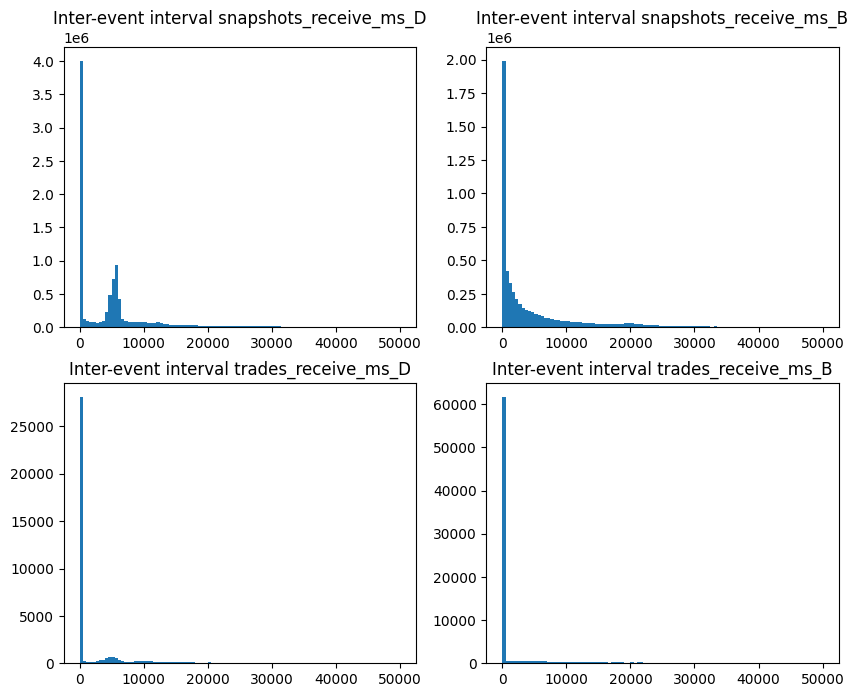

In [9]:
plt.figure(figsize=(10,8))
plt.subplot(2, 2, 1)
plt.hist(freq_snapshots_D_diff, bins=100, range=(0,50_000))
plt.title('Inter-event interval snapshots_receive_ms_D')
plt.subplot(2, 2, 2)
plt.hist(freq_snapshots_B_diff, bins=100, range=(0,50_000))
plt.title('Inter-event interval snapshots_receive_ms_B')
plt.subplot(2, 2, 3)
plt.hist(freq_trades_D_diff, bins=100, range=(0,50_000))
plt.title('Inter-event interval trades_receive_ms_D')
plt.subplot(2, 2, 4)
plt.hist(freq_trades_B_diff, bins=100, range=(0,50_000))
plt.title('Inter-event interval trades_receive_ms_B')
plt.show()

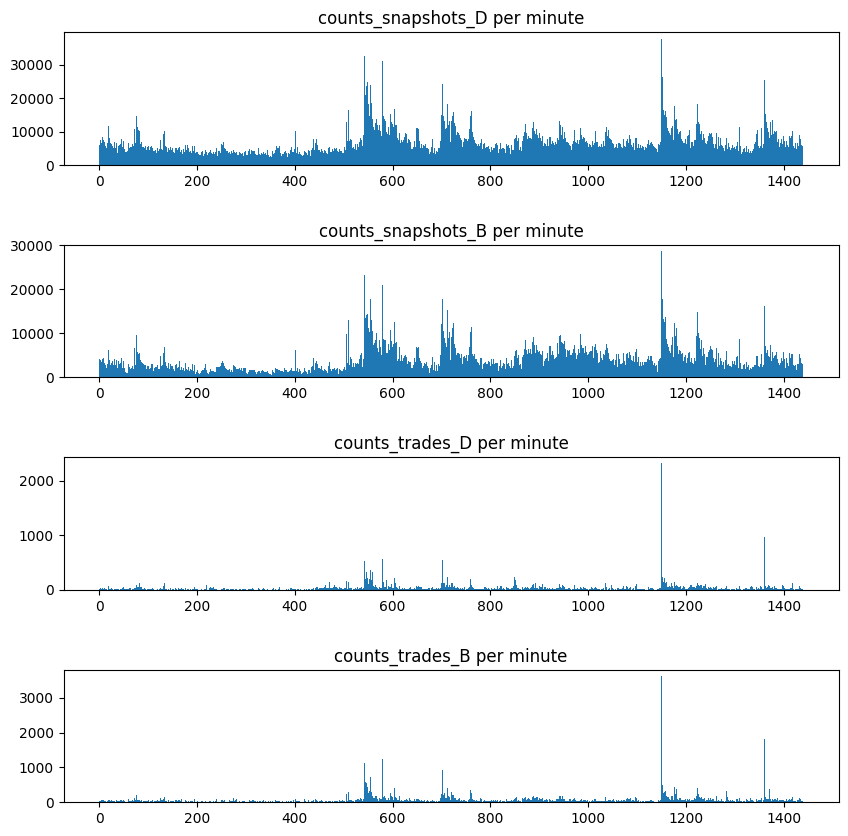

In [10]:
times_snapshots_D = pd.to_datetime(snapshots_receive_ms_D, unit='us', origin='unix')
minutes_snapshots_D = times_snapshots_D.hour * 60 + times_snapshots_D.minute
counts_snapshots_D, edges_snapshots_D = np.histogram(minutes_snapshots_D, bins=1440, range=(0, 1440))

times_snapshots_B = pd.to_datetime(snapshots_receive_ms_B, unit='us', origin='unix')
minutes_snapshots_B = times_snapshots_B.hour * 60 + times_snapshots_B.minute
counts_snapshots_B, edges_snapshots_B = np.histogram(minutes_snapshots_B, bins=1440, range=(0, 1440))

times_trades_D = pd.to_datetime(trades_receive_ms_D, unit='us', origin='unix')
minutes_trades_D = times_trades_D.hour * 60 + times_trades_D.minute
counts_trades_D, edges_trades_D = np.histogram(minutes_trades_D, bins=1440, range=(0, 1440))

times_trades_B = pd.to_datetime(trades_receive_ms_B, unit='us', origin='unix')
minutes_trades_B = times_trades_B.hour * 60 + times_trades_B.minute
counts_trades_B, edges_trades_B = np.histogram(minutes_trades_B, bins=1440, range=(0, 1440))

plt.figure(figsize=(10,10))
plt.subplot(4, 1, 1)
plt.bar(np.arange(1440), counts_snapshots_D, width=1.0)
plt.title('counts_snapshots_D per minute')
plt.subplot(4, 1, 2)
plt.bar(np.arange(1440), counts_snapshots_B, width=1.0)
plt.title('counts_snapshots_B per minute')
plt.subplot(4, 1, 3)
plt.bar(np.arange(1440), counts_trades_D, width=1.0)
plt.title('counts_trades_D per minute')
plt.subplot(4, 1, 4)
plt.bar(np.arange(1440), counts_trades_B, width=1.0)
plt.title('counts_trades_B per minute')
plt.subplots_adjust(hspace=0.6)
plt.show()

The following patterns are clearly visible in the charts:

**Order book snapshots from both exchanges**

For both D and B, we have a continuous stream of data - each minute contains anywhere from hundreds to tens of thousands of points.

The distribution across minutes is fairly even, with no "empty" gaps. This gives us a stable, high-frequency view of how the order book evolves over time.

**Trade events from both exchanges**

In most minutes, the number of trades is close to zero or just a few.

Only in a few specific moments (visible as sharp spikes in the charts - for example, around minute 600 and 1200) do we see bursts of activity.

Between those bursts, there are long gaps - sometimes lasting minutes or even hours - where trades are missing or too few to use statistically.

**Conclusion for the temporal arbitrage task**

Temporal arbitrage relies on subtle changes in the order book structure and slow, cumulative shifts in supply and demand. For that, we need high-resolution time data to see how bid/ask levels are evolving.

Trade data, on the other hand, is too sparse and concentrated in rare bursts. It doesn't give us a continuous market picture and may just add noise. It might help boost a model later, but for now, I'll ignore trade data.

So, for building a temporal arbitrage algorithm, it makes sense to skip trades_B and trades_D, and focus only on the snapshots — they provide the time density and stability needed to detect micro-arbitrage signals.

# CREATE DATASET

We also downloaded spot Binance data for the same day.
Going forward, the data will be shifted to avoid any look-ahead bias.

In fact, this shift slightly worsens the situation - because in real trading, such data can be accessed live via WebSocket.

## temp datates

In [11]:
#create 4 datasets
depth = 10
cols_snap = []
for side in ['ask', 'bid']:
    for feat in ['price', 'volume']:
        for lvl in range(depth):
            cols_snap.append(f'{side}_{feat}_{lvl}')

N_D, _, _, _ = snapshots_D.shape
flat_D = snapshots_D.reshape(N_D, -1).astype(np.float32)
df_snap_D = pd.DataFrame(flat_D, columns=cols_snap)
df_snap_D['receive_ms'] = snapshots_receive_ms_D
df_snap_D['server_ms'] = snapshots_server_ms_D
df_snap_D.set_index('receive_ms', inplace=True)

df_trades_D = pd.DataFrame(
    trades_D,
    columns=['side', 'price', 'volume']
)
df_trades_D = df_trades_D.astype({'price':'float32','volume':'float32'})
df_trades_D['side'] = df_trades_D['side'].map(lambda x: 1 if x == 1 else -1)
df_trades_D['is_buy']  = (df_trades_D['side'] > 0).astype('uint8')
df_trades_D['is_sell'] = (df_trades_D['side'] < 0).astype('uint8')
df_trades_D['buy_volume']  = df_trades_D['is_buy']  * df_trades_D['volume']
df_trades_D['sell_volume'] = df_trades_D['is_sell'] * df_trades_D['volume']
df_trades_D['receive_ms'] = trades_receive_ms_D
df_trades_D['server_ms'] = trades_server_ms_D
df_trades_D.set_index('receive_ms', inplace=True)

N_B, _, _, _ = snapshots_B.shape
flat_B = snapshots_B.reshape(N_B, -1).astype(np.float32)
df_snap_B = pd.DataFrame(flat_B, columns=cols_snap)
df_snap_B['receive_ms'] = snapshots_receive_ms_B
df_snap_B['server_ms'] = snapshots_server_ms_B
df_snap_B.set_index('receive_ms', inplace=True)

df_trades_B = pd.DataFrame(
    trades_B,
    columns=['side', 'price', 'volume']
)
df_trades_B = df_trades_B.astype({'price':'float32','volume':'float32'})
df_trades_B['side'] = df_trades_B['side'].map(lambda x: 1 if x == 1 else -1)
df_trades_B['is_buy']  = (df_trades_B['side'] > 0).astype('uint8')
df_trades_B['is_sell'] = (df_trades_B['side'] < 0).astype('uint8')
df_trades_B['buy_volume']  = df_trades_B['is_buy']  * df_trades_B['volume']
df_trades_B['sell_volume'] = df_trades_B['is_sell'] * df_trades_B['volume']
df_trades_B['receive_ms'] = trades_receive_ms_B
df_trades_B['server_ms'] = trades_server_ms_B
df_trades_B.set_index('receive_ms', inplace=True)

#prefixes
df_snap_D = df_snap_D.add_prefix("D_ob_")
df_trades_D = df_trades_D.add_prefix("D_tr_")

df_snap_B = df_snap_B.add_prefix("B_ob_")
df_trades_B = df_trades_B.add_prefix("B_tr_")

df_all = pd.concat([df_snap_D, df_trades_D, df_snap_B, df_trades_B])
df_all = df_all.sort_index().astype(np.float32)

#index
df_all['rms'] = df_all.index
df_all.index = pd.to_datetime(df_all.index, unit='us')


#calculate add/rem volume in first level
delta_ask = df_all['D_ob_ask_volume_0'] - df_all['D_ob_ask_volume_0'].shift(1)
delta_bid = df_all['D_ob_bid_volume_0'] - df_all['D_ob_bid_volume_0'].shift(1)

D_ask_v_add = delta_ask.clip(lower=0)
D_ask_v_rem = (-delta_ask.clip(upper=0))

D_bid_v_add = delta_bid.clip(lower=0)
D_bid_v_rem = (-delta_bid.clip(upper=0))

df_all['D_ob_ask_add_volume_0'] = D_ask_v_add.rolling('50ms').sum()
df_all['D_ob_ask_rem_volume_0'] = D_ask_v_rem.rolling('50ms').sum()
df_all['D_ob_bid_add_volume_0'] = D_bid_v_add.rolling('50ms').sum()
df_all['D_ob_bid_rem_volume_0'] = D_bid_v_rem.rolling('50ms').sum()


delta_ask = df_all['B_ob_ask_volume_0'] - df_all['B_ob_ask_volume_0'].shift(1)
delta_bid = df_all['B_ob_bid_volume_0'] - df_all['B_ob_bid_volume_0'].shift(1)

B_ask_v_add = delta_ask.clip(lower=0)
B_ask_v_rem = (-delta_ask.clip(upper=0))

B_bid_v_add = delta_bid.clip(lower=0)
B_bid_v_rem = (-delta_bid.clip(upper=0))

df_all['B_ob_ask_add_volume_0'] = B_ask_v_add.rolling('50ms').sum()
df_all['B_ob_ask_rem_volume_0'] = B_ask_v_rem.rolling('50ms').sum()
df_all['B_ob_bid_add_volume_0'] = B_bid_v_add.rolling('50ms').sum()
df_all['B_ob_bid_rem_volume_0'] = B_bid_v_rem.rolling('50ms').sum()

## spot

In [12]:
spot = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/test01/BTCUSDT_2023-01-30.csv')
spot['open_time'] = pd.to_datetime(spot['open_time'])
spot = spot.set_index('open_time', drop=True)
spot = spot[:86400].copy()

## 50ms

In [13]:
steps_per_second = 20
ts_window = f'{1000/steps_per_second}ms'

spot0 = spot.resample(ts_window).asfreq()
spot0 = spot0.shift(steps_per_second-1)

df0 = df_all.resample(ts_window).mean()

b_count = df_all['B_tr_price'].resample(ts_window).count().rename('B_tr_count')
d_count = df_all['D_tr_price'].resample(ts_window).count().rename('D_tr_count')

df0 = (
    df0
    .join([b_count, d_count])
    .fillna({'B_tr_count': 0, 'D_tr_count': 0})
)

df0['B_tr_buy_count'] = (df0['B_tr_is_buy']*df0['B_tr_count']).abs()
df0['B_tr_sell_count'] = (df0['B_tr_is_sell']*df0['B_tr_count']).abs()
df0['D_tr_buy_count'] = (df0['D_tr_is_buy']*df0['D_tr_count']).abs()
df0['D_tr_sell_count'] = (df0['D_tr_is_sell']*df0['D_tr_count']).abs()

new_index = pd.date_range(start=pd.Timestamp('2023-01-30 00:00:00'), end=pd.Timestamp('2023-01-30 23:59:59.950000'), freq='50ms')

df0 = df0.reindex(new_index)
spot0 = spot0.reindex(new_index)

spot0 = spot0.ffill()

cols_B_ob = df0.filter(like='B_ob_').columns
cols_D_ob = df0.filter(like='D_ob_').columns

df0[cols_B_ob] = df0[cols_B_ob].ffill()
df0[cols_D_ob] = df0[cols_D_ob].ffill()

df00 = pd.concat([df0, spot0], axis=1)
df00.shape

(1728000, 124)

# Delta midprices

In [14]:
df = df00.copy()

In [15]:
df['S_ohlc4'] = (df['open'] + df['high'] + df['low'] + df['close'])/4
df['B_midprice'] = ((df['B_ob_ask_price_0'] + df['B_ob_bid_price_0'])/2).values
df['D_midprice'] = ((df['D_ob_ask_price_0'] + df['D_ob_bid_price_0'])/2).values
df['D_B_spread'] = df['D_midprice'] - df['B_midprice']
df['D_B_spread_P'] = (df['D_midprice'] - df['B_midprice'])/df['S_ohlc4']*100

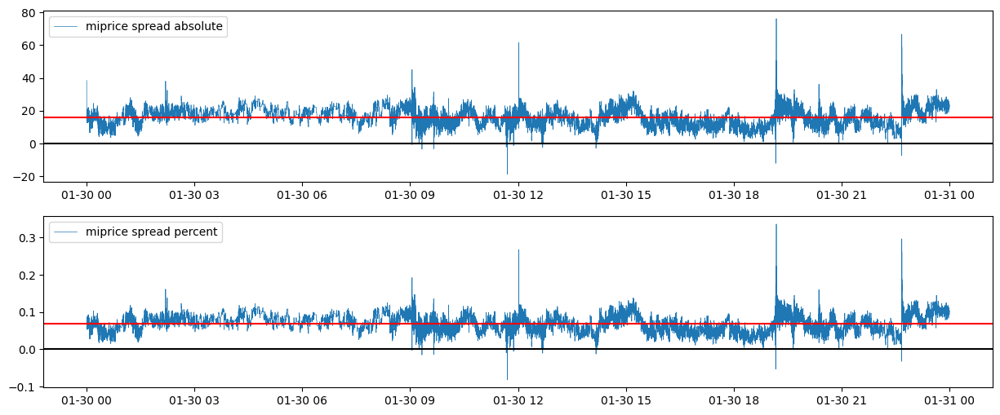

In [16]:
plt.figure(figsize=(15,6))
plt.subplot(2, 1, 1)
plt.plot(df['D_B_spread'], linewidth=0.5, label='miprice spread absolute')
plt.axhline(df['D_B_spread'].mean(), color='r')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.subplot(2, 1, 2)
plt.plot(df['D_B_spread_P'], linewidth=0.5, label='miprice spread percent')
plt.axhline(df['D_B_spread_P'].mean(), color='r')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.show()

# Midle of midprice spread

But calculating the average is a "cheating" approach, since we can’t know it in advance

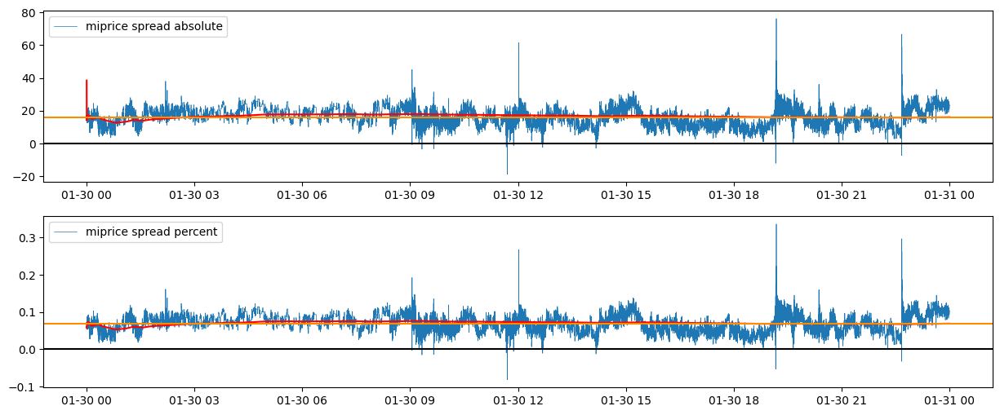

In [ ]:
plt.figure(figsize=(15,6))
plt.subplot(2, 1, 1)
plt.plot(df['D_B_spread'], linewidth=0.5, label='miprice spread absolute')
plt.plot(df['D_B_spread'].rolling(len(df), min_periods=1).mean(), color='r')
plt.axhline(df['D_B_spread'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.subplot(2, 1, 2)
plt.plot(df['D_B_spread_P'], linewidth=0.5, label='miprice spread percent')
plt.plot(df['D_B_spread_P'].rolling(len(df), min_periods=1).mean(), color='r')
plt.axhline(df['D_B_spread_P'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.show()

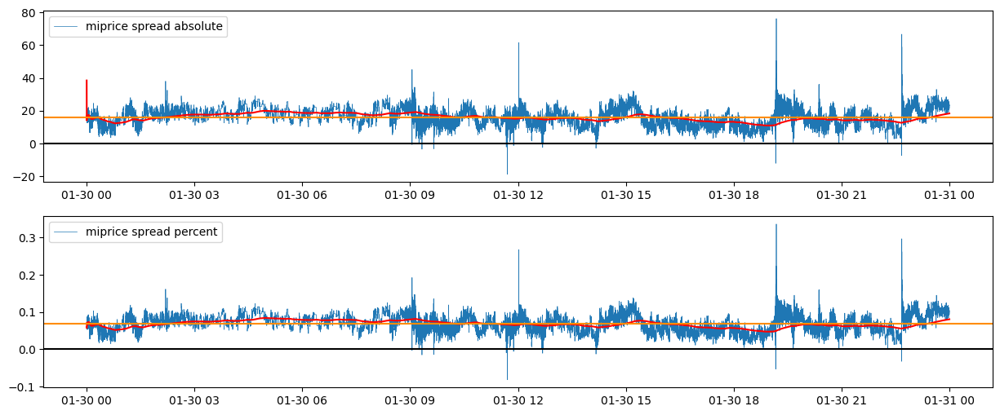

In [ ]:
plt.figure(figsize=(15,6))
plt.subplot(2, 1, 1)
plt.plot(df['D_B_spread'], linewidth=0.5, label='miprice spread absolute')
plt.plot(df['D_B_spread'].ewm(span=200_000, adjust=True).mean(), color='r')
plt.axhline(df['D_B_spread'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.subplot(2, 1, 2)
plt.plot(df['D_B_spread_P'], linewidth=0.5, label='miprice spread percent')
plt.plot(df['D_B_spread_P'].ewm(span=200_000, adjust=True).mean(), color='r')
plt.axhline(df['D_B_spread_P'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.show()

Starting from span=200,000, the behavior can be considered reasonable

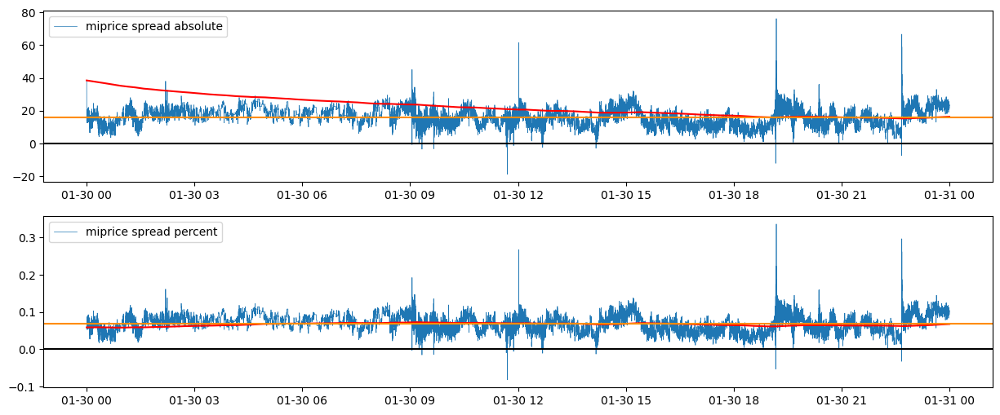

In [ ]:
plt.figure(figsize=(15,6))
plt.subplot(2, 1, 1)
plt.plot(df['D_B_spread'], linewidth=0.5, label='miprice spread absolute')
plt.plot(df['D_B_spread'].ewm(span=1_000_000, adjust=False).mean(), color='r')
plt.axhline(df['D_B_spread'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.subplot(2, 1, 2)
plt.plot(df['D_B_spread_P'], linewidth=0.5, label='miprice spread percent')
plt.plot(df['D_B_spread_P'].ewm(span=1_000_000, adjust=False).mean(), color='r')
plt.axhline(df['D_B_spread_P'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.show()

With adjust=False (i.e., using only the recursive formula without normalizing the weighted data), we can see that at span=1,000,000 - roughly half a day:

1) It matches the true average more closely.

2) It shows a strong dependency on the starting values.

In [ ]:
def kalman_filter(z, Q, R, x0=None, P0=None):
    n = len(z)
    xhat = np.zeros(n)
    #init
    if x0 is not None:
        xhat[0] = x0
    else:
        xhat[0] = z[0] if not np.isnan(z[0]) else 0.0
    P = R if P0 is None else P0

    for t in range(1, n):
        #predit
        xhat_minus = xhat[t-1]
        P_minus = P + Q

        #is nan
        if np.isnan(z[t]):
            xhat[t] = xhat_minus
            P = P_minus
            continue

        #correction
        K = P_minus / (P_minus + R)
        xhat[t] = xhat_minus + K * (z[t] - xhat_minus)
        P = (1 - K) * P_minus

    return xhat

In [ ]:
spread = df['D_B_spread'].values
spread_pct = df['D_B_spread_P'].values

Q = 20 * 1e-9
R = 20 * 1e+4
kf_abs = kalman_filter(spread, Q, R)
kf_pct = kalman_filter(spread_pct, Q, R)

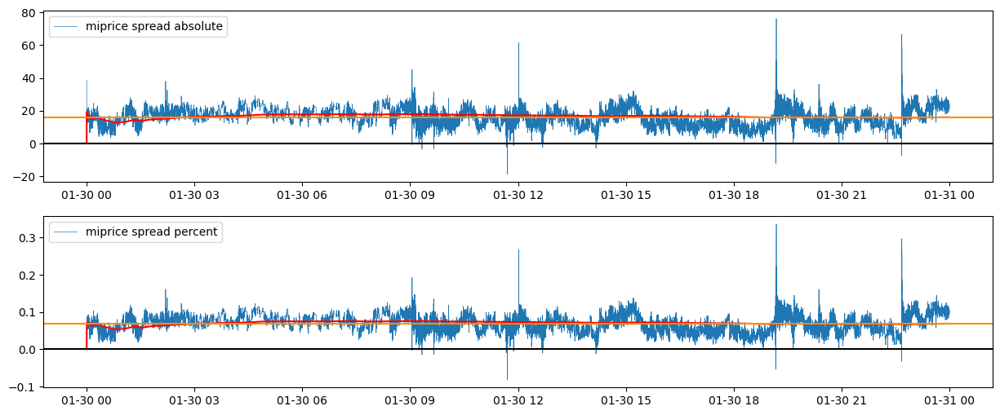

In [ ]:
plt.figure(figsize=(15,6))
plt.subplot(2, 1, 1)
plt.plot(df['D_B_spread'], linewidth=0.5, label='miprice spread absolute')
plt.plot(pd.Series(kf_abs, index=df.index), color='r')
plt.axhline(df['D_B_spread'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.subplot(2, 1, 2)
plt.plot(df['D_B_spread_P'], linewidth=0.5, label='miprice spread percent')
plt.plot(pd.Series(kf_pct, index=df.index), color='r')
plt.axhline(df['D_B_spread_P'].mean(), color='darkorange')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.show()

The Kalman filter gives more reasonable results and is less affected by initial values.

However, to estimate the spread average more accurately, it's better to have several days of data. That would allow for a more reliable estimation of the process variance and noise variance (Q and R).

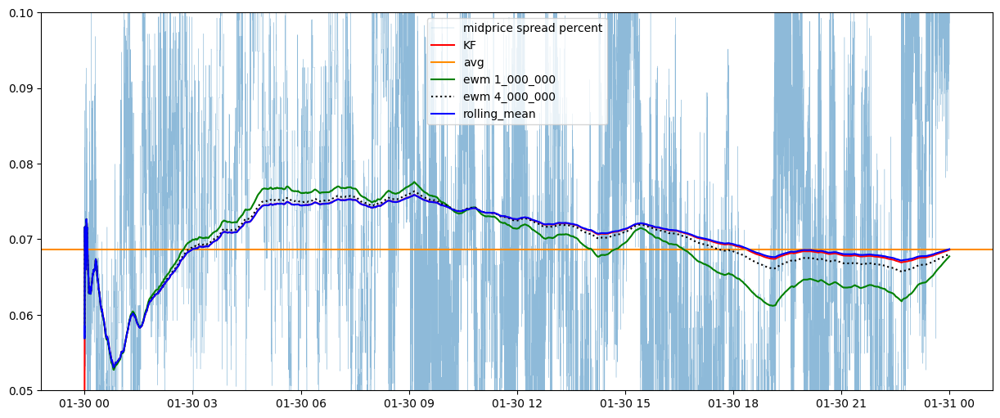

In [ ]:
plt.figure(figsize=(15,6))
plt.plot(df['D_B_spread_P'], linewidth=0.25, alpha=0.5, label='midprice spread percent')
plt.plot(pd.Series(kf_pct, index=df.index), color='r', label='KF')
plt.axhline(df['D_B_spread_P'].mean(), color='darkorange', label='avg')
plt.plot(df['D_B_spread_P'].ewm(span=1_000_000, adjust=True).mean(), color='green', label='ewm 1_000_000')
plt.plot(df['D_B_spread_P'].ewm(span=4_000_000, adjust=True).mean(), color='black', linestyle='dotted', label='ewm 4_000_000')
plt.plot(df['D_B_spread_P'].rolling(len(df), min_periods=1).mean(), color='blue', label='rolling_mean')
plt.axhline(0, color='k')
plt.legend(loc='best')
plt.ylim(0.05, 0.10)
plt.show()

We can see that both the simple moving average and the Kalman Filter stay closer to the true average, even as the EWM smoothing span increases.

However, the simple moving average reacts more slowly to changes, which can lead to more false entries.
Using the Kalman Filter without testing it on a larger dataset is risky.

So, for the algorithm, we'll stick with EWM. But for data analysis, any of these moving averages can be used

# View with fee

In [ ]:
fee_D = 0.010/100
fee_B = 0.005/100

fee_D_ = 0.050/100
fee_B_ = 0.0175/100

In [ ]:
df['D_B_spread_P_KF'] = kf_pct
df['D_B_residuals_P_KF'] = df['D_B_spread_P'] - df['D_B_spread_P_KF']

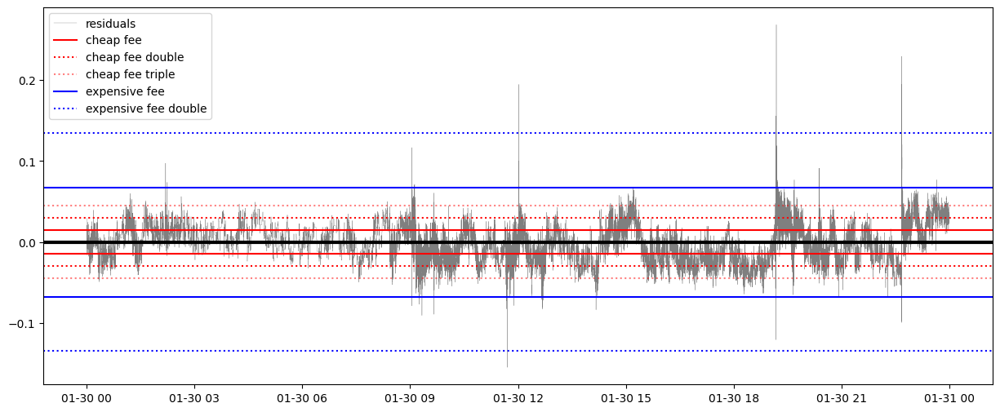

In [ ]:
plt.figure(figsize=(15,6))
plt.plot(df['D_B_residuals_P_KF'], color='black', linewidth=0.25, alpha=0.5, label='residuals')

plt.axhline((fee_D + fee_B)*100, color='r', label='cheap fee')
plt.axhline(-(fee_D + fee_B)*100, color='r')
plt.axhline(2*(fee_D + fee_B)*100, color='r', linestyle='dotted', label='cheap fee double')
plt.axhline(-2*(fee_D + fee_B)*100, color='r', linestyle='dotted')
plt.axhline(3*(fee_D + fee_B)*100, color='r', linestyle='dotted', alpha=0.5, label='cheap fee triple')
plt.axhline(-3*(fee_D + fee_B)*100, color='r', linestyle='dotted', alpha=0.5,)

plt.axhline((fee_D_ + fee_B_)*100, color='blue', label='expensive fee')
plt.axhline(-(fee_D_ + fee_B_)*100, color='blue')
plt.axhline(2*(fee_D_ + fee_B_)*100, color='blue', linestyle='dotted', label='expensive fee double')
plt.axhline(-2*(fee_D_ + fee_B_)*100, color='blue', linestyle='dotted')

plt.axhline(0, linewidth=3, color='k')
plt.legend(loc='best')
plt.show()

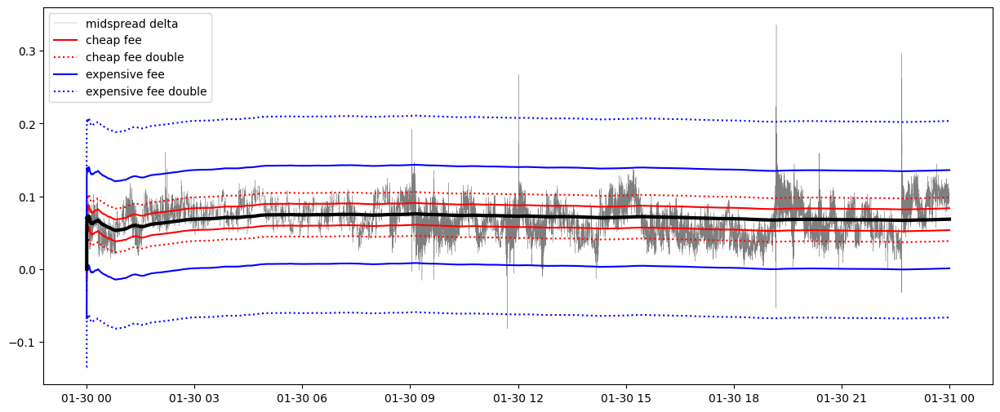

In [ ]:
plt.figure(figsize=(15,6))
plt.plot(df['D_B_spread_P'], color='black', linewidth=0.25, alpha=0.5, label='midspread delta')

plt.plot(df['D_B_spread_P_KF'] + (fee_D + fee_B)*100, color='r', label='cheap fee')
plt.plot(df['D_B_spread_P_KF'] - (fee_D + fee_B)*100, color='r')
plt.plot(df['D_B_spread_P_KF'] + 2*(fee_D + fee_B)*100, color='r', linestyle='dotted', label='cheap fee double')
plt.plot(df['D_B_spread_P_KF'] - 2*(fee_D + fee_B)*100, color='r', linestyle='dotted')

plt.plot(df['D_B_spread_P_KF'] + (fee_D_ + fee_B_)*100, color='blue', label='expensive fee')
plt.plot(df['D_B_spread_P_KF'] - (fee_D_ + fee_B_)*100, color='blue')
plt.plot(df['D_B_spread_P_KF'] + 2*(fee_D_ + fee_B_)*100, color='blue', linestyle='dotted', label='expensive fee double')
plt.plot(df['D_B_spread_P_KF'] - 2*(fee_D_ + fee_B_)*100, color='blue', linestyle='dotted')

plt.plot(df['D_B_spread_P_KF'], linewidth=3, color='k')
plt.legend(loc='best')
plt.show()

# FUNCS

In [ ]:
def plot_graph(dft, ccc, ttt):
    print(ccc)
    plt.figure(figsize=(15,5))
    plt.subplot(1, 2, 1)
    bins = np.linspace(dft[ccc].min(), dft[ccc].max(), 21)
    grp = dft.groupby(pd.cut(dft[ccc], bins), observed=False)[ttt]
    stats = grp.agg(['mean','count','std'])
    stats['stderr'] = stats['std'] / np.sqrt(stats['count'])

    mid = (bins[:-1] + bins[1:]) / 2
    plt.errorbar(mid, stats['mean'], yerr=stats['stderr'], fmt='-o')
    plt.axhline(0, color='k', lw=0.5)
    plt.xlabel(ccc)
    plt.ylabel(f'mean {ttt} ± stderr')

    plt.subplot(1, 2, 2)
    plt.hexbin(dft[ccc], dft[ttt], gridsize=50, bins='log')
    plt.colorbar(label='log(count)')
    plt.axhline(0, color='gray', lw=1)
    plt.axvline(0, color='gray', lw=1)
    plt.xlabel(ccc)
    plt.ylabel(ttt)
    plt.show()

# Create features

In [ ]:
features_cols = []

df['S_ohlc4'] = (df['open'] + df['high'] + df['low'] + df['close'])/4
df['B_midprice'] = ((df['B_ob_ask_price_0'] + df['B_ob_bid_price_0'])/2).values
df['D_midprice'] = ((df['D_ob_ask_price_0'] + df['D_ob_bid_price_0'])/2).values
df['D_B_spread'] = df['D_midprice'] - df['B_midprice']
df['D_B_spread_P'] = (df['D_midprice'] - df['B_midprice'])/df['S_ohlc4']*100

df['D_B_spread_P_EWM'] = df['D_B_spread_P'].ewm(span=1_000_000).mean()
df['D_B_spread_P_EWM_std'] = df['D_B_spread_P'].ewm(span=1_000_000).std()
df['D_B_spread_P_EWM_Z'] = (df['D_B_spread_P'] - df['D_B_spread_P_EWM'])/df['D_B_spread_P_EWM_std']
df['D_B_spread_P_EWM_delta'] = df['D_B_spread_P'] - df['D_B_spread_P_EWM']

df['D_spread'] = (df['D_ob_ask_price_0'] - df['D_ob_bid_price_0'])/df['D_ob_bid_price_0']*100
df['B_spread'] = (df['B_ob_ask_price_0'] - df['B_ob_bid_price_0'])/df['B_ob_bid_price_0']*100

df['B_S_spread'] = (df['B_midprice'] - df['S_ohlc4'])/df['S_ohlc4']*100
df['D_S_spread'] = (df['D_midprice'] - df['S_ohlc4'])/df['S_ohlc4']*100

features_cols += ['D_B_spread_P_EWM_Z','D_B_spread_P_EWM_delta','D_spread','B_spread','B_S_spread','D_S_spread']

df = df.copy()

In [ ]:
df['D_B_spread_P_KF_delta'] = df['D_B_spread_P'] - df['D_B_spread_P_KF']
features_cols += ['D_B_spread_P_KF_delta']

In [ ]:
df['D_B_spread_P_EWM_vel'] = df['D_B_spread_P_EWM'].diff(20)
df['D_B_spread_P_EWM_acc'] = df['D_B_spread_P_EWM_vel'].diff(20)
features_cols += ['D_B_spread_P_EWM_vel','D_B_spread_P_EWM_acc']

In [ ]:
df['D_B_spread_P_KF_vel'] = df['D_B_spread_P_KF'].diff(20)
df['D_B_spread_P_KF_acc'] = df['D_B_spread_P_KF_vel'].diff(20)
features_cols += ['D_B_spread_P_KF_vel','D_B_spread_P_KF_acc']

In [ ]:
for level in [1, 2, 3, 5, 10]:
    for exch in ['D','B']:
        vol_cols_ask = [f'{exch}_ob_ask_volume_{i}' for i in range(level)]
        vol_cols_bid = [f'{exch}_ob_bid_volume_{i}' for i in range(level)]
        v_ask = df[vol_cols_ask].sum(axis=1)
        v_bid = df[vol_cols_bid].sum(axis=1)
        df[f'{exch}_ob_imb_volume_{level}'] = (v_ask - v_bid) / (v_ask + v_bid)
        features_cols += [f'{exch}_ob_imb_volume_{level}']

        if level > 1:
            density_ask = abs(df[f'{exch}_ob_ask_price_{level-1}'] - df[f'{exch}_ob_ask_price_0'])/level
            density_bid = abs(df[f'{exch}_ob_bid_price_{level-1}'] - df[f'{exch}_ob_bid_price_0'])/level

            df[f'{exch}_ob_imb_density_{level}'] = (density_ask - density_bid) / (density_ask + density_bid)
            features_cols += [f'{exch}_ob_imb_density_{level}']
df = df.copy()

In [ ]:
df['D_micro'] = (df['D_ob_bid_price_0']*df['D_ob_ask_volume_0'] + df['D_ob_ask_price_0']*df['D_ob_bid_volume_0']) / (df['D_ob_ask_volume_0'] + df['D_ob_bid_volume_0'])
df['B_micro'] = (df['B_ob_bid_price_0']*df['B_ob_ask_volume_0'] + df['B_ob_ask_price_0']*df['B_ob_bid_volume_0']) / (df['B_ob_ask_volume_0'] + df['B_ob_bid_volume_0'])
df['D_B_micro'] = df['D_micro'] - df['B_micro']
features_cols += ['D_B_micro']

In [ ]:
df['spot_agression'] = (df['taker_buy_base_asset_volume']/df['volume'] - 0.5)*2
features_cols += ['spot_agression']

In [ ]:
window_rs = 20*1
rolling_features_cols = []
for col in features_cols:
    df[f'{col}_rs'] = df[col].rolling(window_rs).mean()
    rolling_features_cols += [f'{col}_rs']
df = df.copy()

In [ ]:
features_cols += ['D_ob_ask_add_volume_0','D_ob_ask_rem_volume_0','D_ob_bid_add_volume_0','D_ob_bid_rem_volume_0']
features_cols += ['B_ob_ask_add_volume_0','B_ob_ask_rem_volume_0','B_ob_bid_add_volume_0','B_ob_bid_rem_volume_0']

In [ ]:
len(features_cols), len(rolling_features_cols)

(39, 31)

# TARGET: spread in N minutes

In [ ]:
L = len(df)
D2B_pnl = np.full(L, np.nan, dtype=float)
B2D_pnl = np.full(L, np.nan, dtype=float)

D_bid = df['D_ob_bid_price_0'].values
D_ask = df['D_ob_ask_price_0'].values
B_bid = df['B_ob_bid_price_0'].values
B_ask = df['B_ob_ask_price_0'].values

N = 20*60*30

for i in range(L - N):
    # 1) D buy / B sell
    D_entry = D_ask[i]
    B_entry = B_bid[i]
    D_exit  = D_bid[i + N]
    B_exit  = B_ask[i + N]

    pnl_D2B = (D_exit - D_entry) \
                - (B_exit - B_entry) \
                - (D_entry + D_exit) * fee_D \
                - (B_entry + B_exit) * fee_B
    D2B_pnl[i] = pnl_D2B

    # 2) B buy / D sell
    D_entry2 = D_bid[i]
    B_entry2 = B_ask[i]
    D_exit2  = D_ask[i + N]
    B_exit2  = B_bid[i + N]

    pnl_B2D = -(D_exit2 - D_entry2) \
                + (B_exit2 - B_entry2) \
                - (D_entry2 + D_exit2) * fee_D \
                - (B_entry2 + B_exit2) * fee_B
    B2D_pnl[i] = pnl_B2D

In [ ]:
df['D2B_pnl'] = D2B_pnl
df['B2D_pnl'] = B2D_pnl
print(df['D2B_pnl'].mean(), df['B2D_pnl'].mean())

-7.857875835375173 -8.247719433503542


In [ ]:
df[features_cols].corrwith(df['B2D_pnl']).abs().sort_values(ascending=False).head(10)

,0
D_B_micro,0.615972
D_B_spread_P_EWM_Z,0.605077
D_B_spread_P_KF_delta,0.601132
D_B_spread_P_EWM_delta,0.600457
D_S_spread,0.300037
D_ob_imb_density_10,0.291992
B_S_spread,0.262812
D_ob_imb_density_5,0.259375
D_ob_imb_density_3,0.221532
D_ob_imb_volume_1,0.199418


In [ ]:
df[rolling_features_cols].corrwith(df['B2D_pnl']).abs().sort_values(ascending=False).head(10)

,0
D_B_micro_rs,0.608428
D_B_spread_P_EWM_Z_rs,0.596407
D_B_spread_P_KF_delta_rs,0.592382
D_B_spread_P_EWM_delta_rs,0.591618
D_ob_imb_density_10_rs,0.295793
D_S_spread_rs,0.295624
D_ob_imb_density_5_rs,0.262723
B_S_spread_rs,0.260846
D_ob_imb_density_3_rs,0.224351
D_ob_imb_volume_1_rs,0.199832


D_B_micro


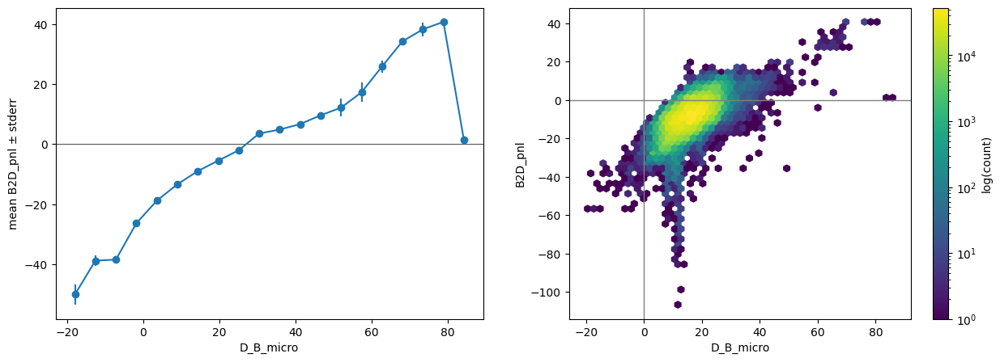

D_B_spread_P_EWM_Z


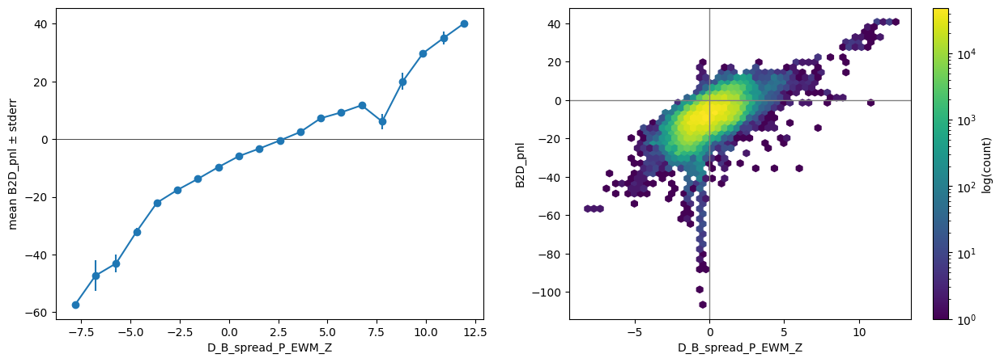

D_B_spread_P_KF_delta


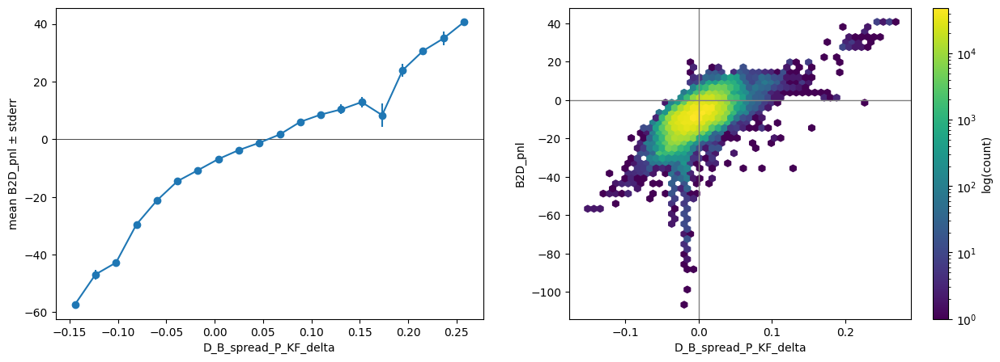

D_B_spread_P_EWM_delta


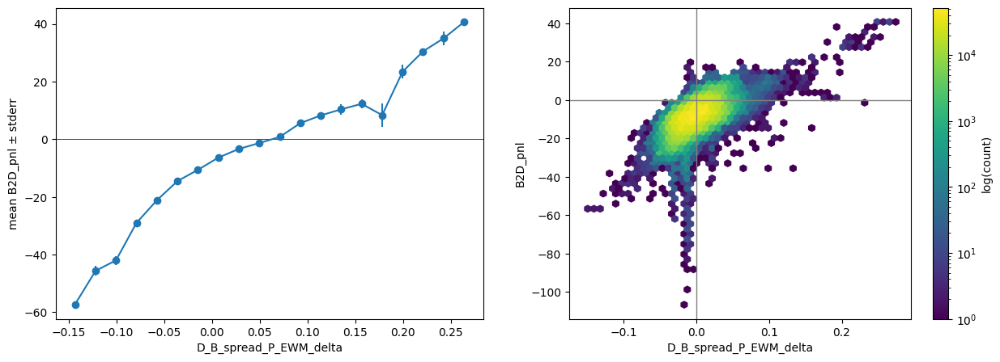

D_S_spread


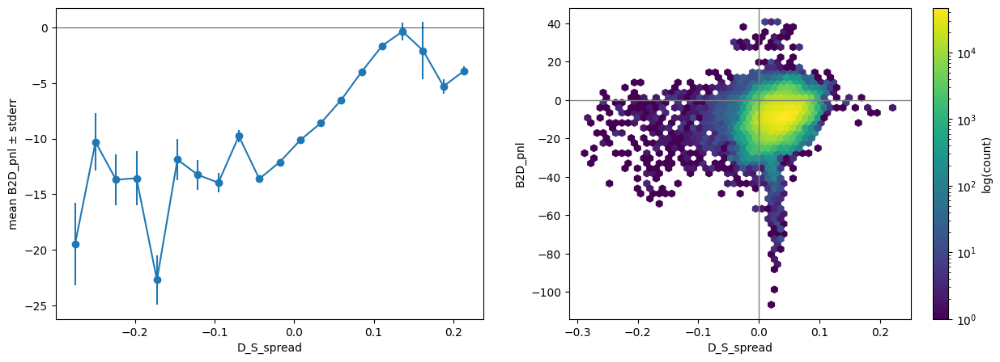

D_ob_imb_density_10


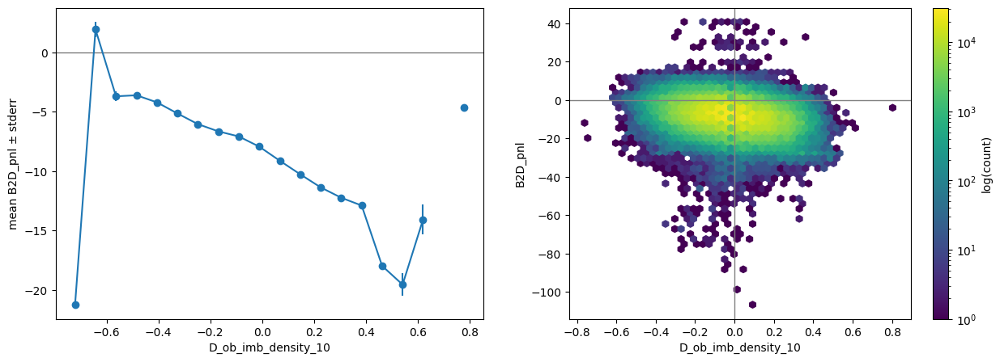

B_S_spread


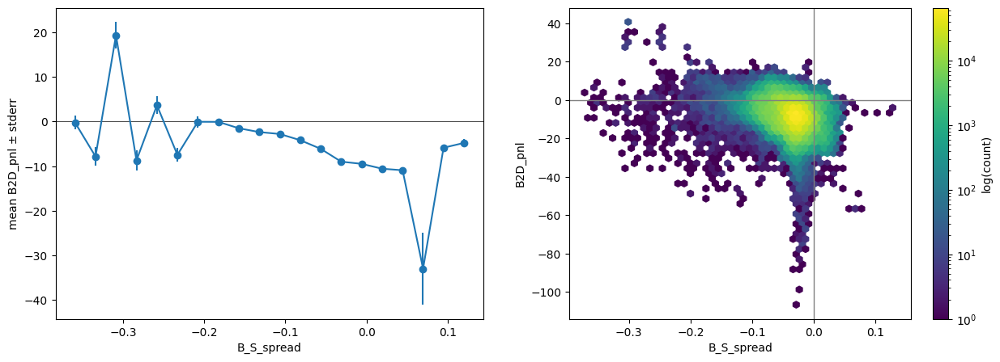

D_ob_imb_density_5


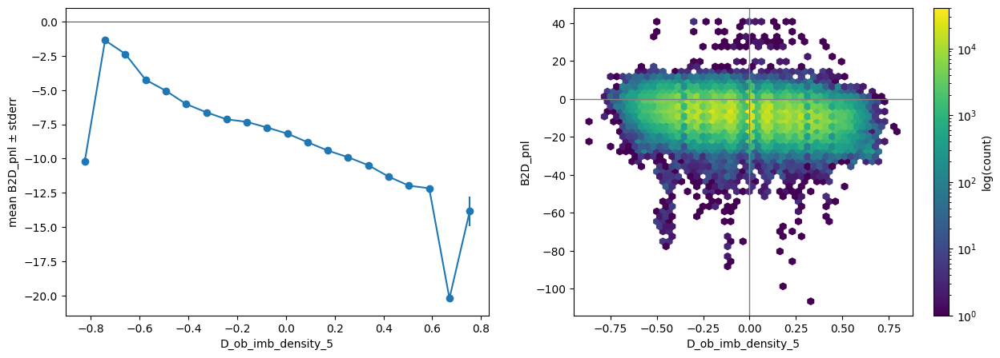

D_ob_imb_density_3


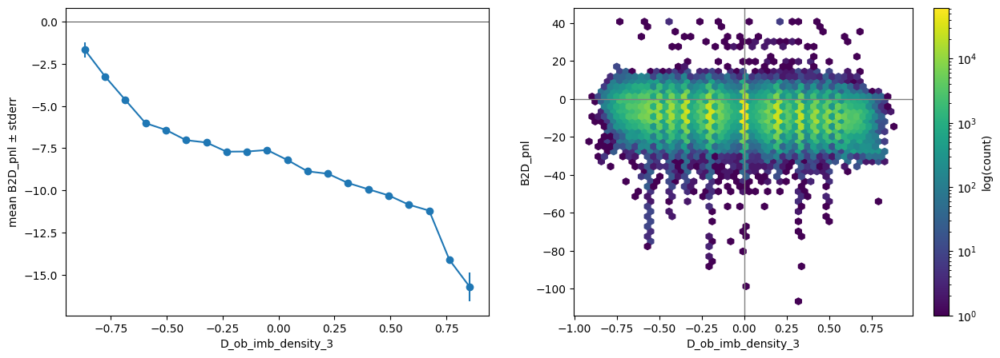

D_ob_imb_volume_1


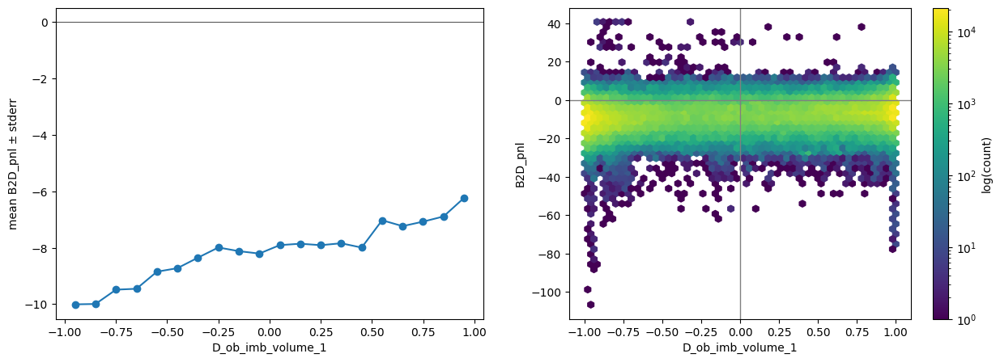

In [ ]:
for feat in list(df[features_cols].corrwith(df['B2D_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(df, feat, 'B2D_pnl')

D_B_micro


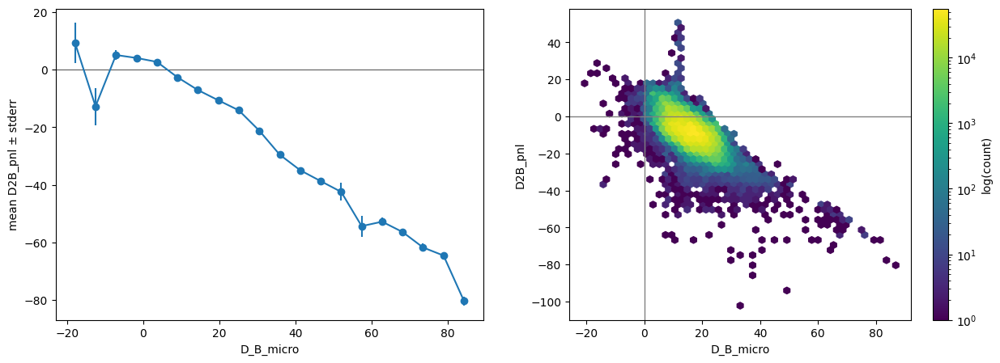

D_B_spread_P_EWM_Z


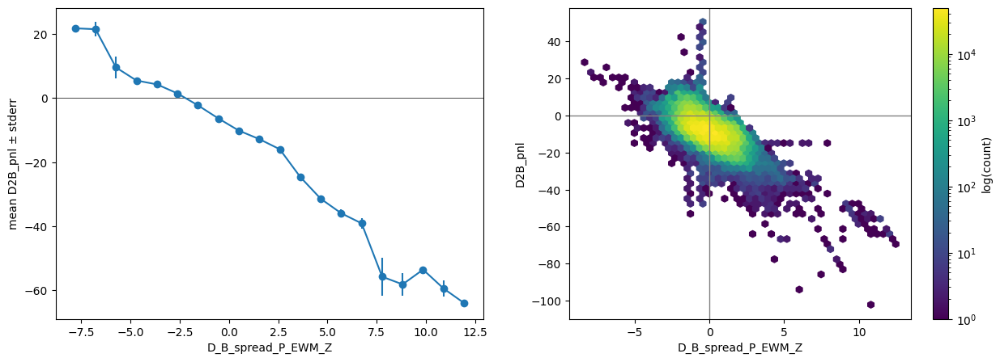

D_B_spread_P_KF_delta


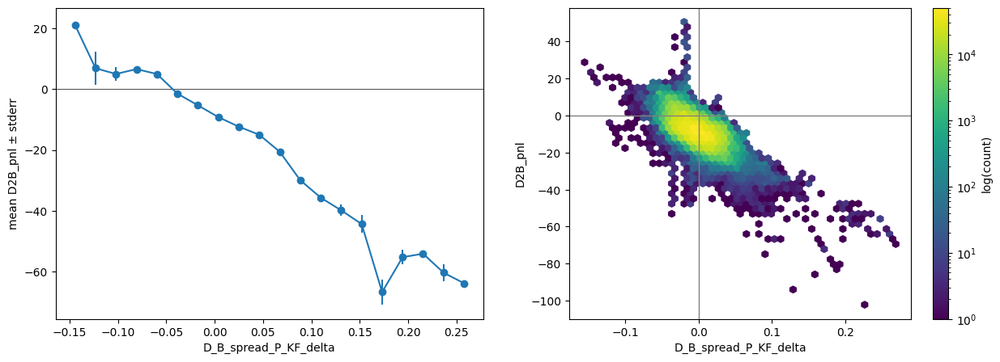

D_B_spread_P_EWM_delta


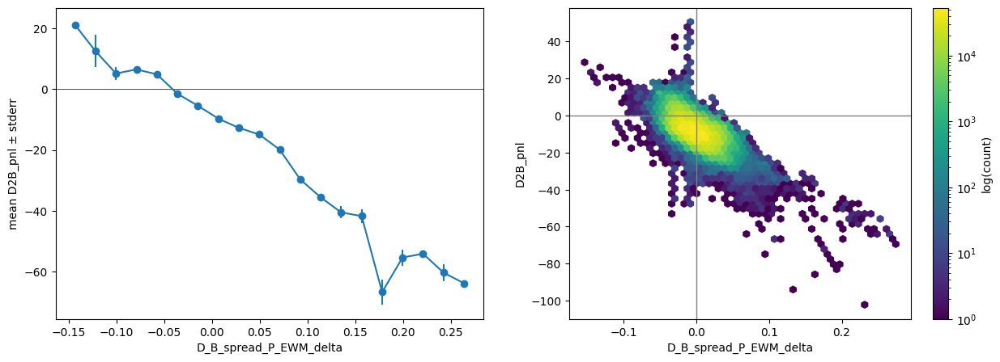

D_S_spread


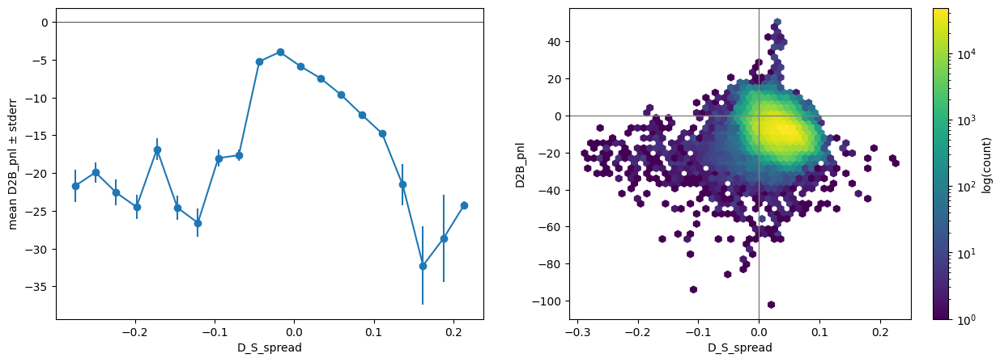

D_ob_imb_density_10


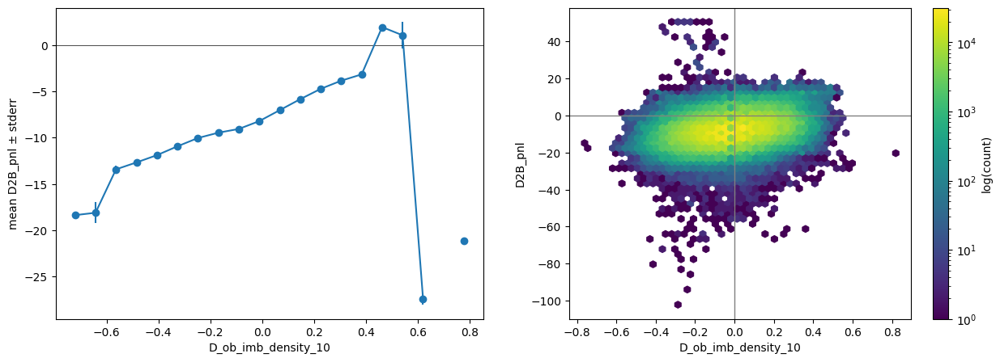

B_S_spread


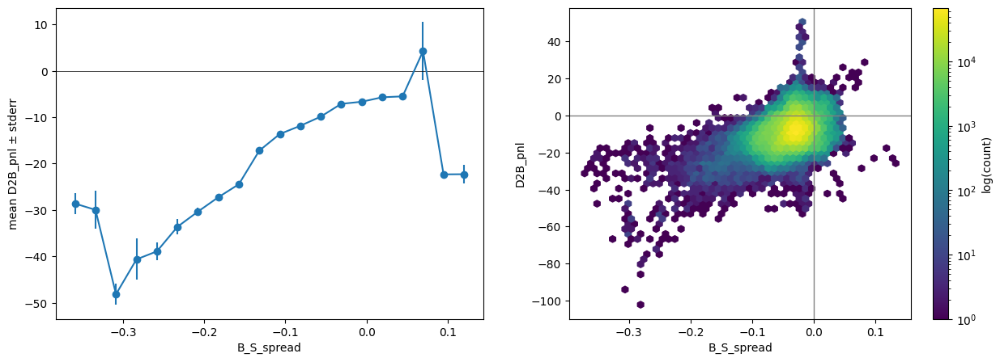

D_ob_imb_density_5


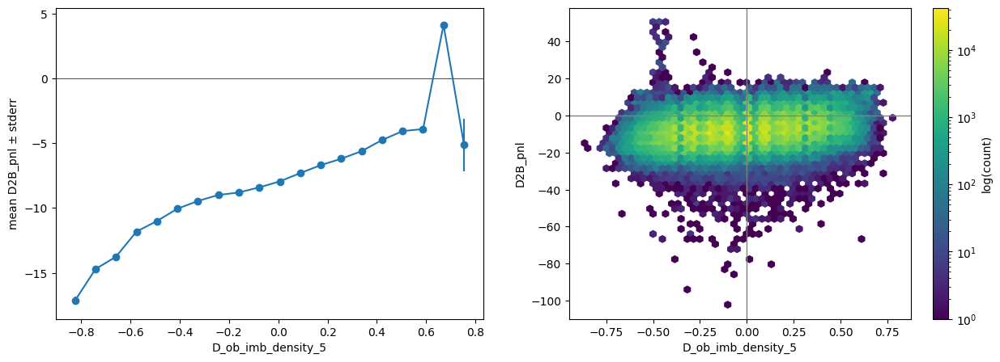

D_ob_imb_density_3


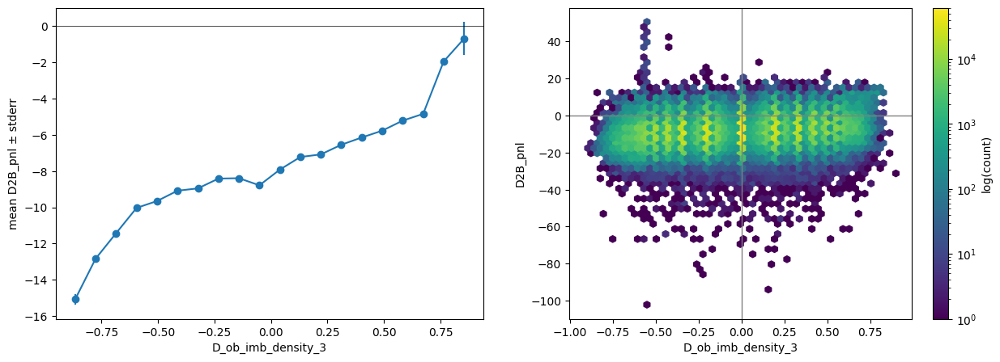

D_ob_imb_volume_1


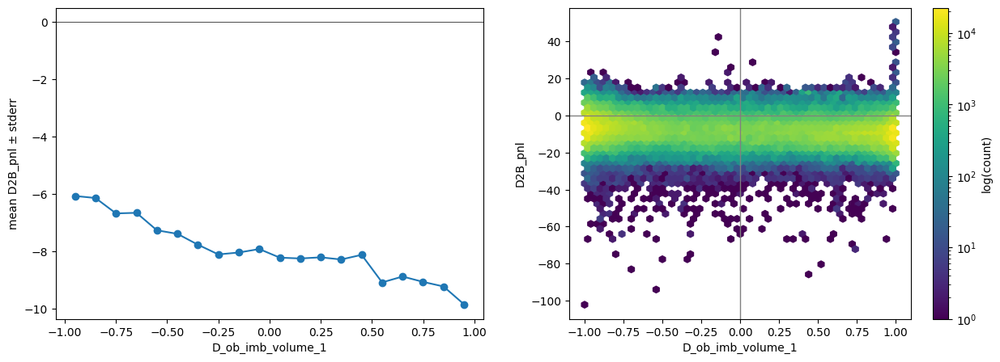

In [ ]:
for feat in list(df[features_cols].corrwith(df['D2B_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(df, feat, 'D2B_pnl')

## view where KF_delta > 0

D_B_micro


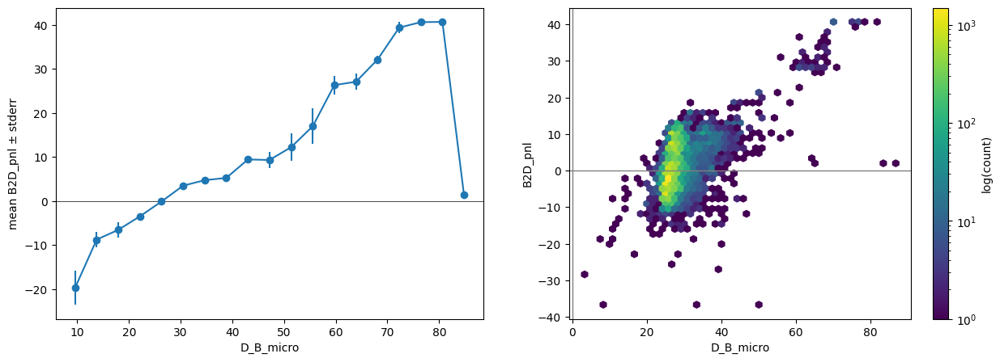

D_B_spread_P_EWM_Z


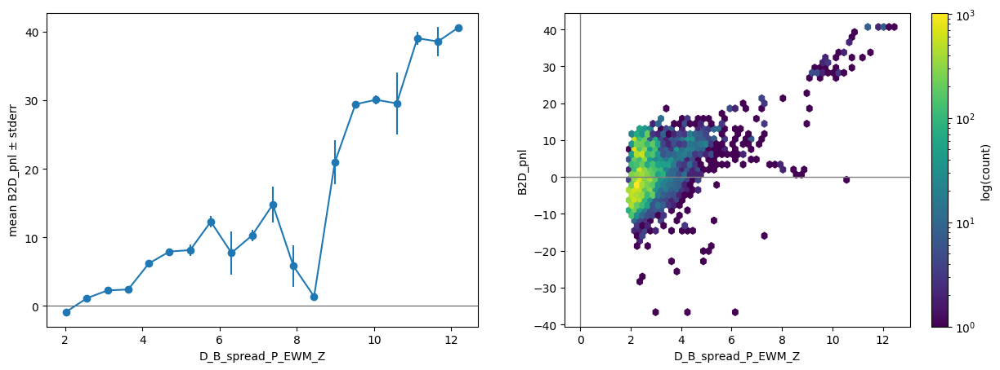

D_B_spread_P_KF_delta


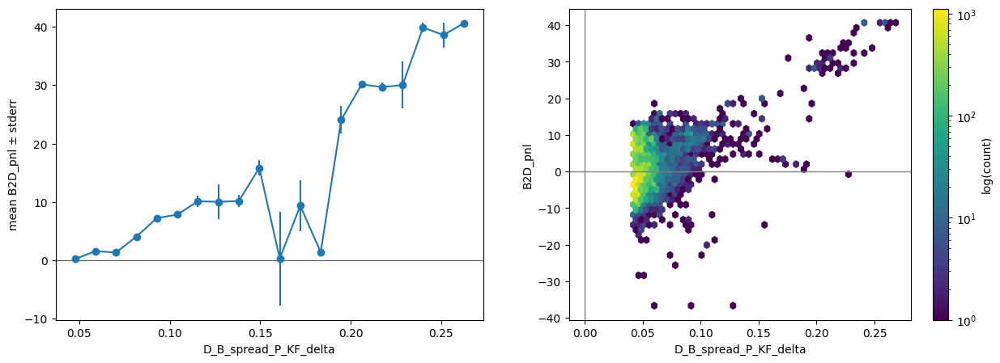

D_B_spread_P_EWM_delta


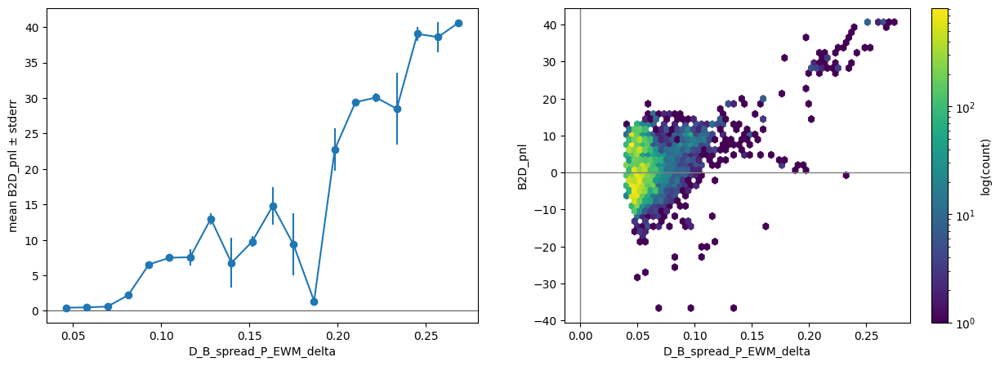

B_ob_imb_volume_3


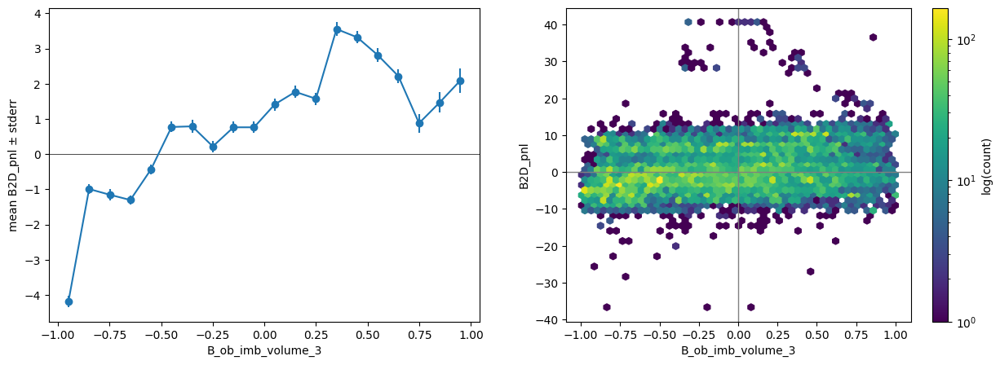

B_ob_imb_volume_5


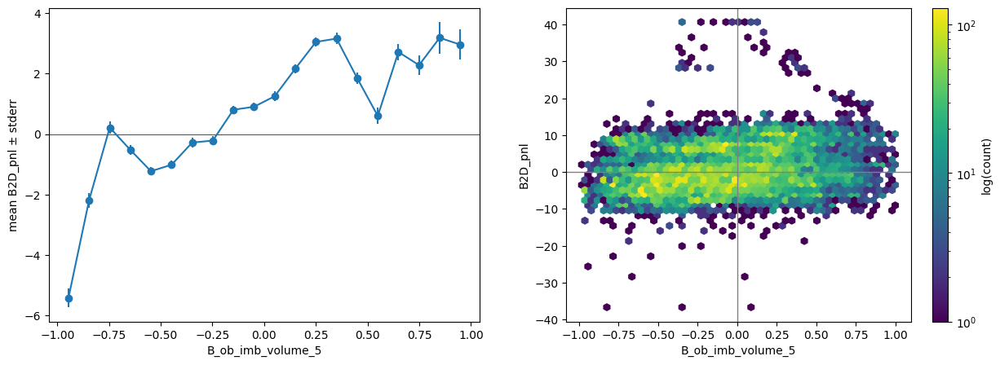

B_ob_imb_volume_2


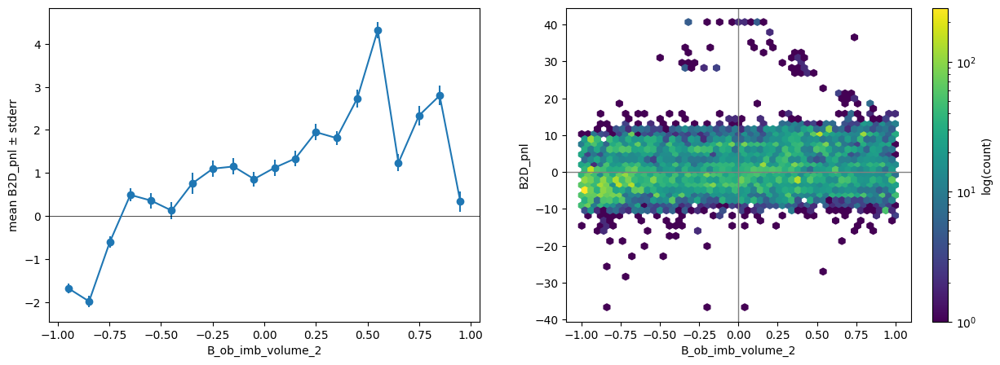

D_S_spread


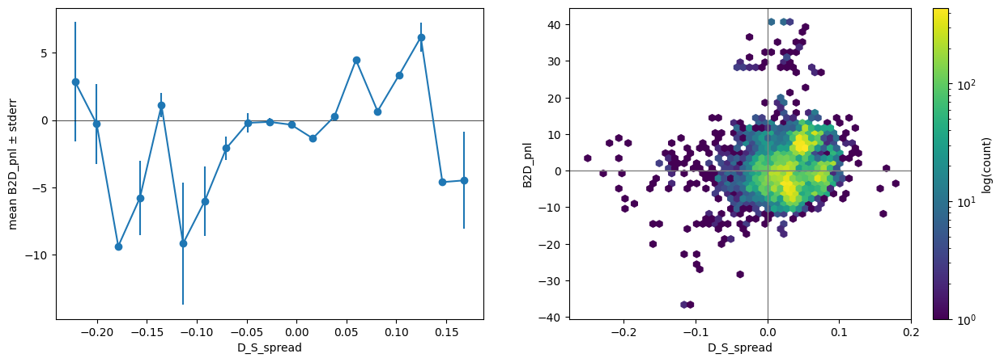

B_ob_imb_volume_1


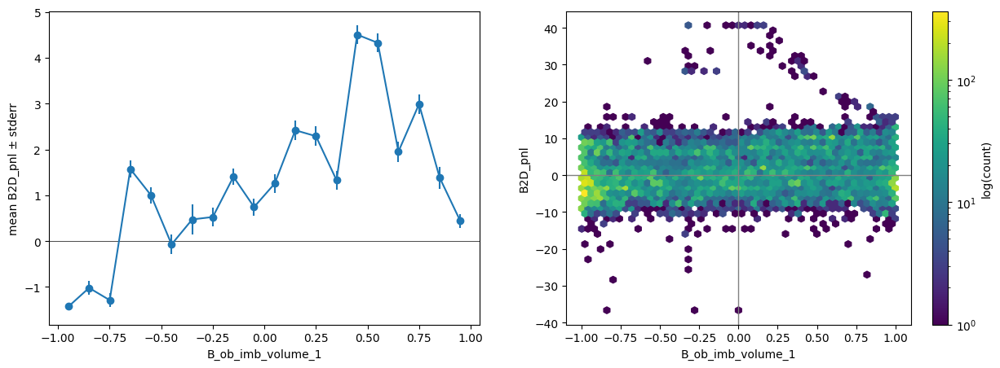

B_ob_imb_volume_10


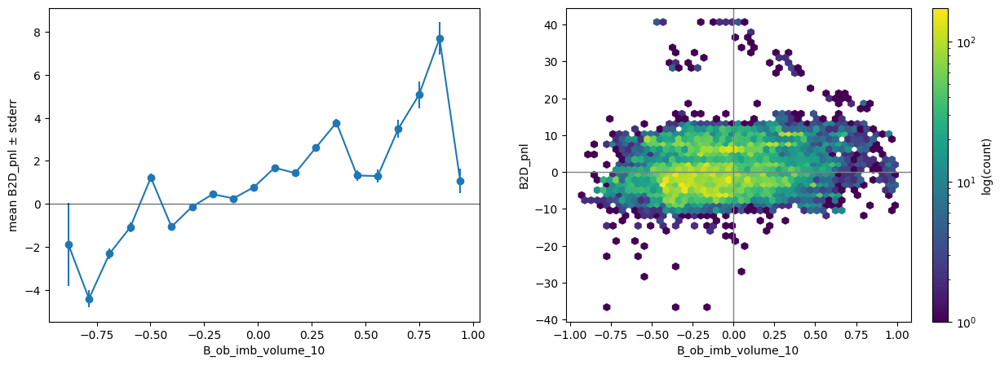

In [ ]:
dft = df[df['D_B_spread_P_KF_delta'] > (fee_D + fee_B)*2.8*100].copy()
for feat in list(dft[features_cols].corrwith(dft['B2D_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(dft, feat, 'B2D_pnl')

In [ ]:
dft = df[df['D_B_spread_P_KF_delta'] > (fee_D + fee_B)*2.8*100].copy()
dft['B2D_pnl'].sum()

np.float64(16725.477013349533)

In [ ]:
dft = df[(df['D_B_spread_P_KF_delta'] > (fee_D + fee_B)*2.8*100) & (df['B_ob_imb_volume_3'] > -0.53)].copy()
dft['B2D_pnl'].sum()

np.float64(24621.091636419296)

# TARGET: buy every point, sell where MAX pnl

In [ ]:
D_bid = df['D_ob_bid_price_0'].values
D_ask = df['D_ob_ask_price_0'].values
B_bid = df['B_ob_bid_price_0'].values
B_ask = df['B_ob_ask_price_0'].values

fee_Dx = fee_D
fee_Bx = fee_B

L = 20*60*30
entry_idxs = np.arange(0, len(df))

results = []

for i in entry_idxs:
    D_entry, B_entry = D_ask[i], B_bid[i]
    j_slice = slice(i, i + L)

    pnl_D2B = (D_bid[j_slice] - D_entry) \
            - (B_ask[j_slice] - B_entry) \
            - (D_entry + D_bid[j_slice]) * fee_Dx \
            - (B_entry + B_ask[j_slice]) * fee_Bx

    idx_rel = np.argmax(pnl_D2B)
    D2B_i_exit = i + idx_rel
    D2B_max_pnl = pnl_D2B[idx_rel]

    D_entry2, B_entry2 = D_bid[i], B_ask[i]
    pnl_B2D = -(D_ask[j_slice] - D_entry2) \
             + (B_bid[j_slice] - B_entry2) \
             - (D_entry2 + D_ask[j_slice]) * fee_Dx \
             - (B_entry2 + B_bid[j_slice]) * fee_Bx

    idx_rel2 = np.argmax(pnl_B2D)
    B2D_i_exit = i + idx_rel2
    B2D_max_pnl = pnl_B2D[idx_rel2]

    results.append({
        'i_start':i,
        'D2B_i_exit':D2B_i_exit,
        'D2B_max_pnl':D2B_max_pnl,
        'B2D_i_exit':B2D_i_exit,
        'B2D_max_pnl':B2D_max_pnl
    })

In [ ]:
rs = pd.DataFrame(results)
df['i_start'] = rs['i_start'].values
df['D2B_i_exit'] = rs['D2B_i_exit'].values
df['D2B_max_pnl'] = rs['D2B_max_pnl'].values
df['B2D_i_exit'] = rs['B2D_i_exit'].values
df['B2D_max_pnl'] = rs['B2D_max_pnl'].values

In [ ]:
print((df['B2D_i_exit'] - df['i_start']).mean()/20/60)
print((df['D2B_i_exit'] - df['i_start']).mean()/20/60)
print(df['D2B_max_pnl'].mean(), df['B2D_max_pnl'].mean())

14.689765969810958
14.396237197627316
3.9803972 2.2121642


The numbers suggest that, in theory, you could open a position at any moment and eventually close it with a profit on average.

But that's only in theory, because there are moments when dozens, or even hundreds or thousands of such virtual positions would close at once and real liquidity wouldn't be enough to support that.

In [ ]:
df[['B2D_pnl','B2D_max_pnl','D2B_pnl','D2B_max_pnl']].corr()

,B2D_pnl,B2D_max_pnl,D2B_pnl,D2B_max_pnl
B2D_pnl,1.000000,0.494932,-0.984327,-0.507729
B2D_max_pnl,0.494932,1.000000,-0.496959,-0.117225
D2B_pnl,-0.984327,-0.496959,1.000000,0.501745
D2B_max_pnl,-0.507729,-0.117225,0.501745,1.000000


The correlation between B2D_pnl and B2D_max_pnl is 0.49, and for D2B it's 0.50

In [ ]:
df[features_cols].corrwith(df['B2D_max_pnl']).abs().sort_values(ascending=False).head(10)

,0
D_B_spread_P_EWM_Z,0.443619
D_B_micro,0.442609
D_B_spread_P_EWM_delta,0.433947
D_B_spread_P_KF_delta,0.419567
B_S_spread,0.329334
D_ob_imb_density_10,0.289648
D_ob_imb_density_5,0.271192
D_ob_imb_density_3,0.243402
D_ob_imb_volume_3,0.236937
D_ob_imb_volume_2,0.236424


In [ ]:
df[features_cols].corrwith(df['D2B_max_pnl']).abs().sort_values(ascending=False).head(10)

,0
D_B_micro,0.467624
D_B_spread_P_KF_delta,0.441993
D_B_spread_P_EWM_delta,0.415571
D_B_spread_P_EWM_Z,0.410709
D_S_spread,0.300012
D_ob_imb_density_10,0.148607
D_ob_imb_density_5,0.132500
B_S_spread,0.124418
D_ob_imb_volume_5,0.100282
D_ob_imb_density_3,0.099474


D_B_spread_P_EWM_Z


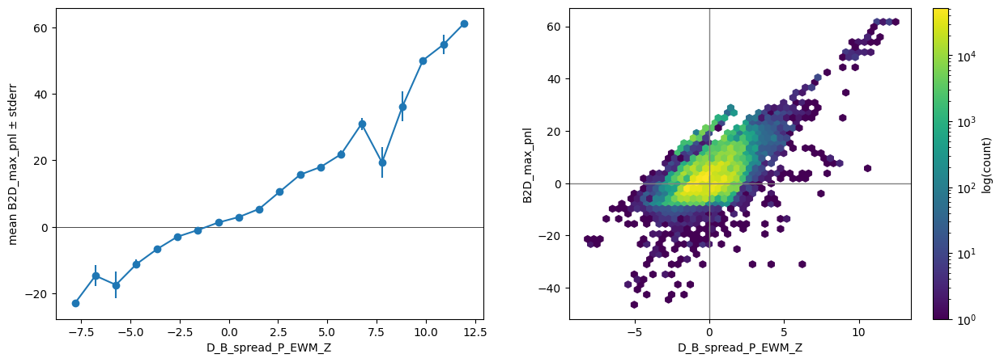

D_B_micro


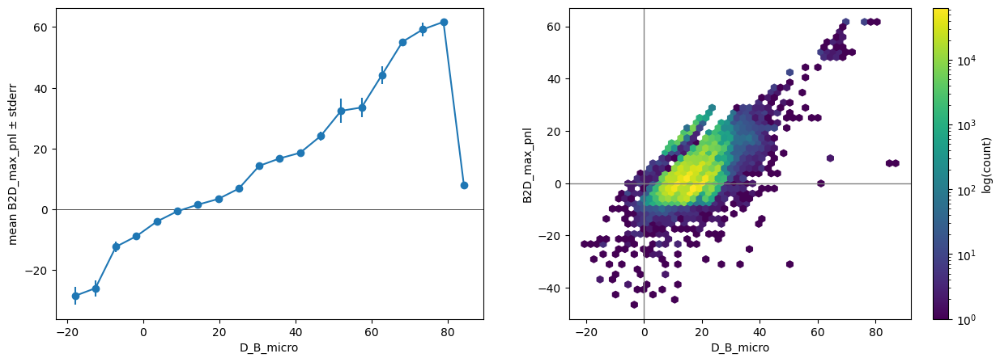

D_B_spread_P_EWM_delta


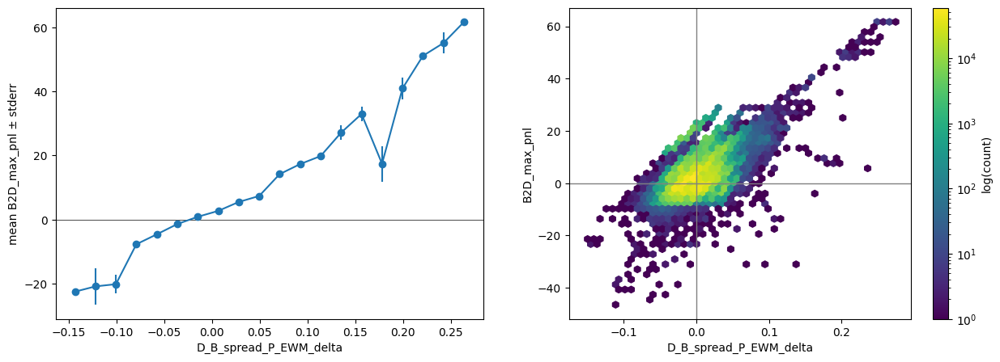

D_B_spread_P_KF_delta


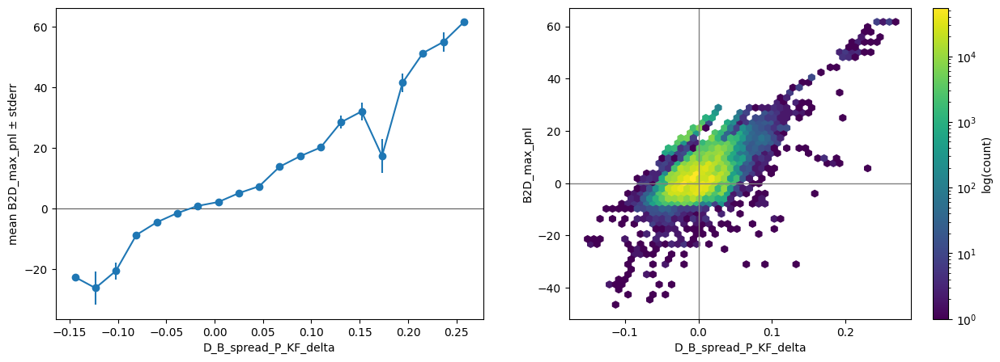

B_S_spread


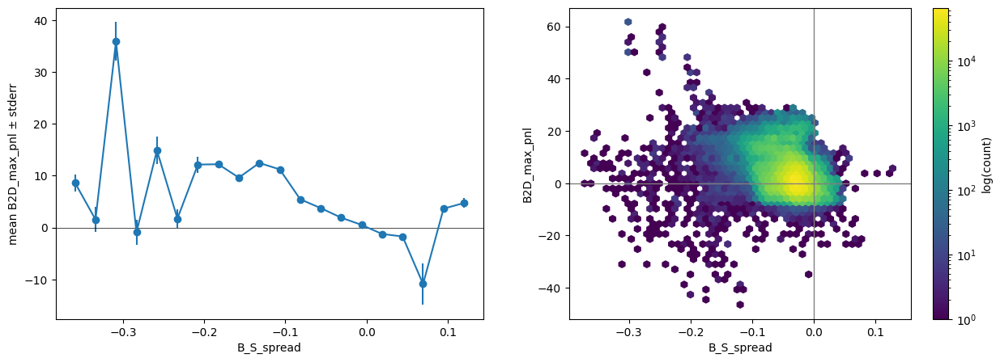

D_ob_imb_density_10


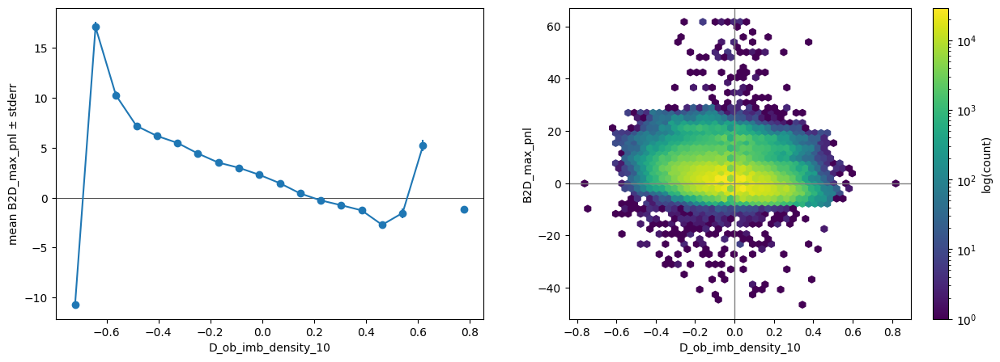

D_ob_imb_density_5


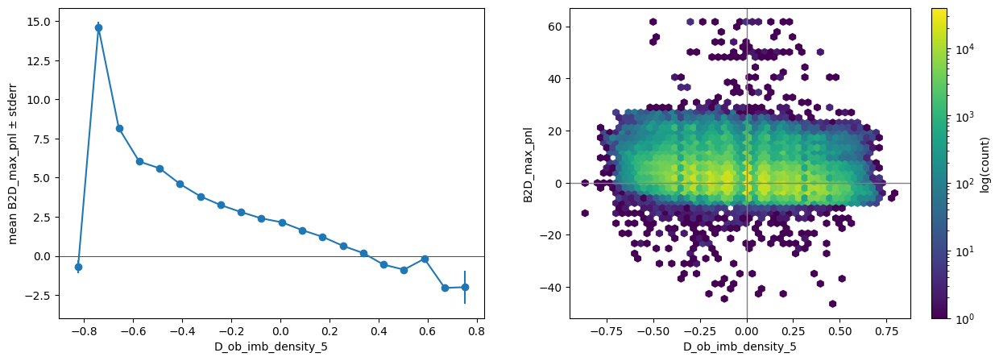

D_ob_imb_density_3


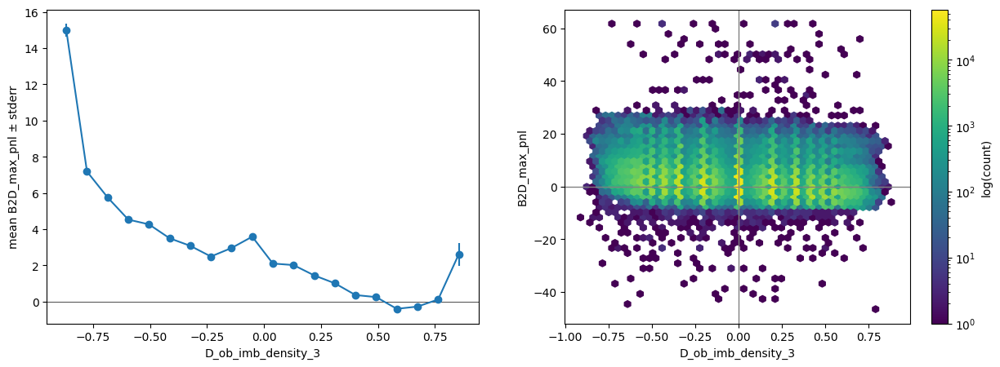

D_ob_imb_volume_3


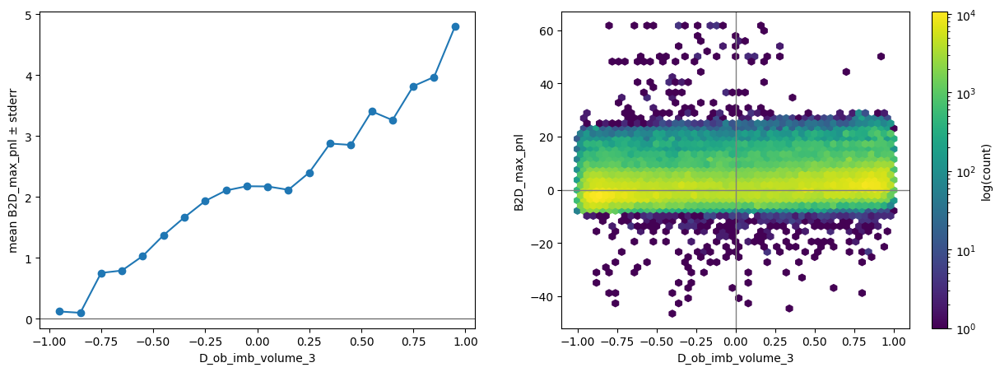

D_ob_imb_volume_2


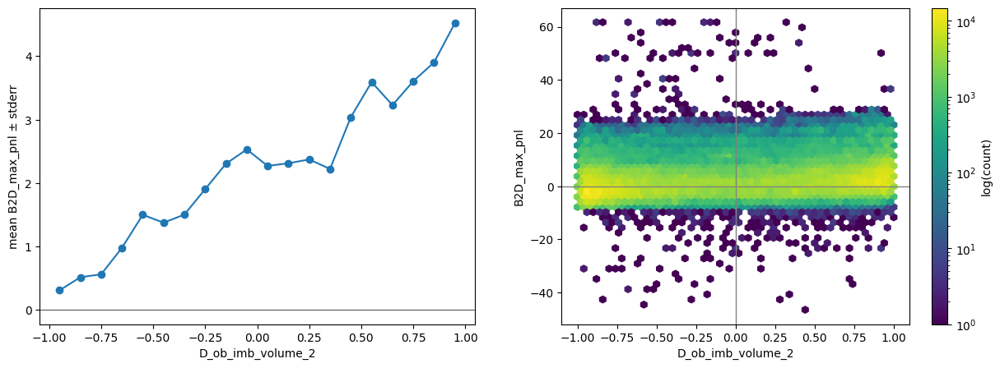

In [ ]:
for feat in list(df[features_cols].corrwith(df['B2D_max_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(df, feat, 'B2D_max_pnl')

D_B_micro


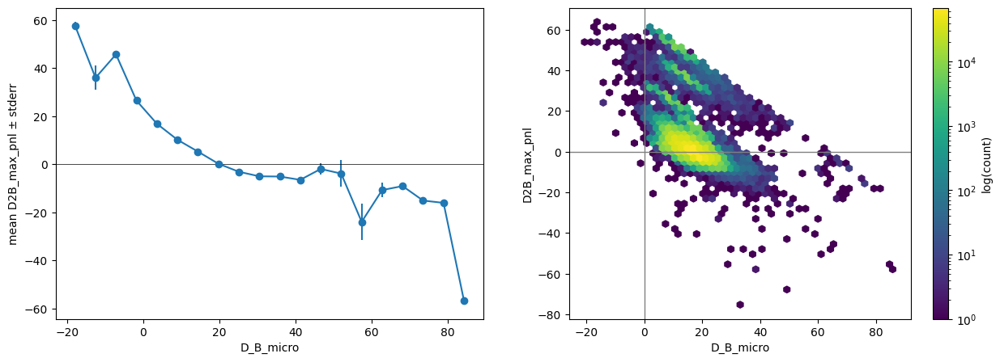

D_B_spread_P_KF_delta


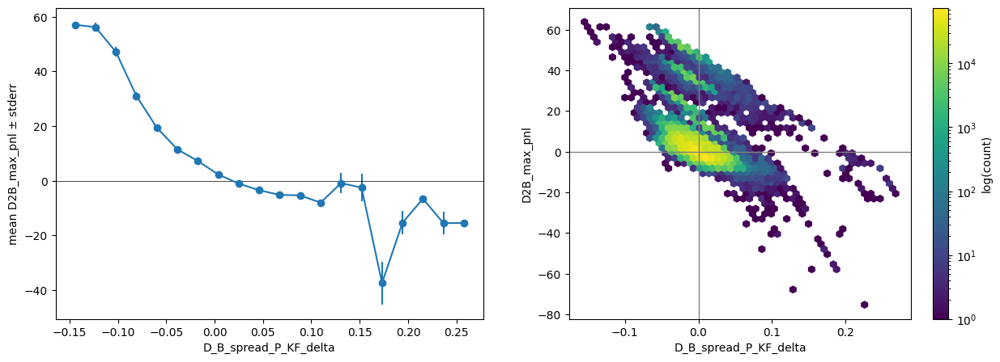

D_B_spread_P_EWM_delta


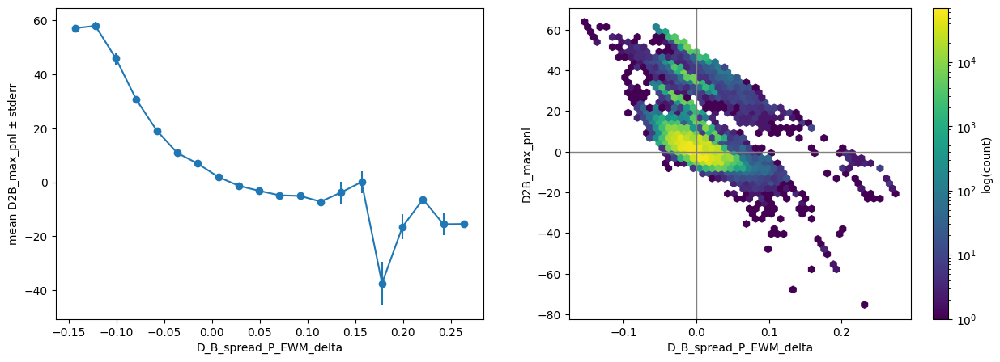

D_B_spread_P_EWM_Z


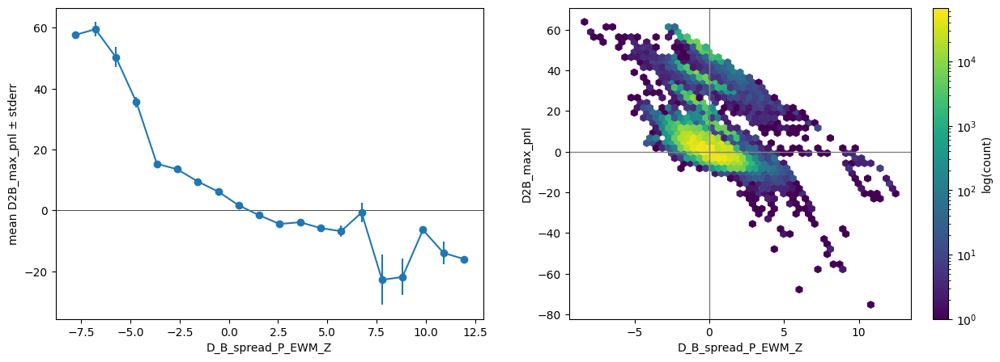

D_S_spread


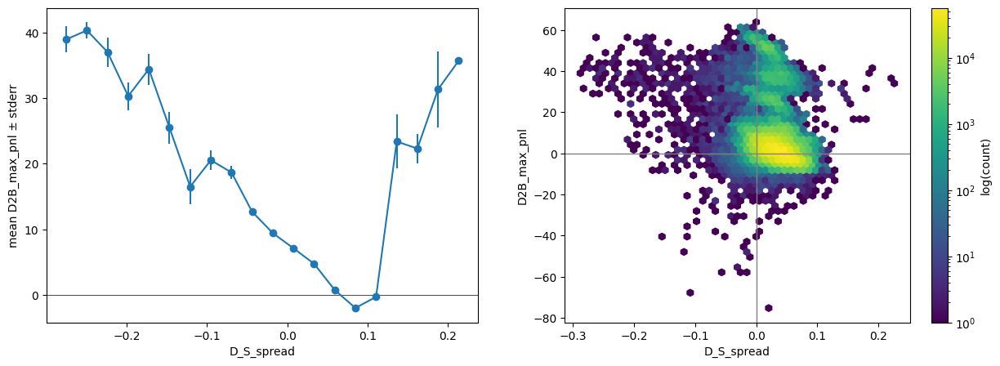

D_ob_imb_density_10


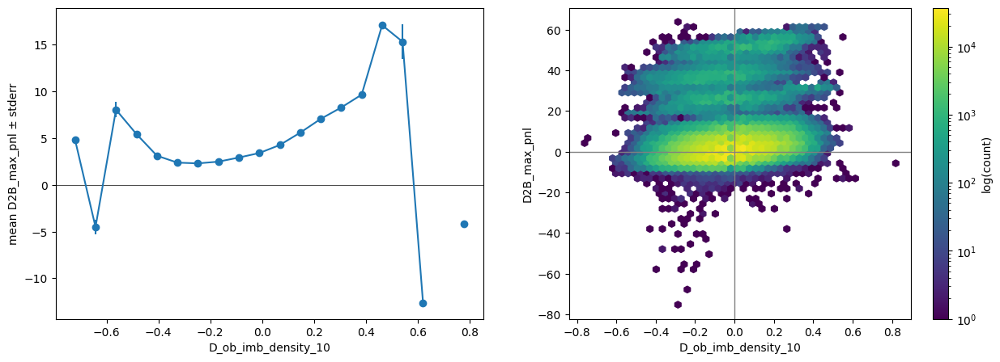

D_ob_imb_density_5


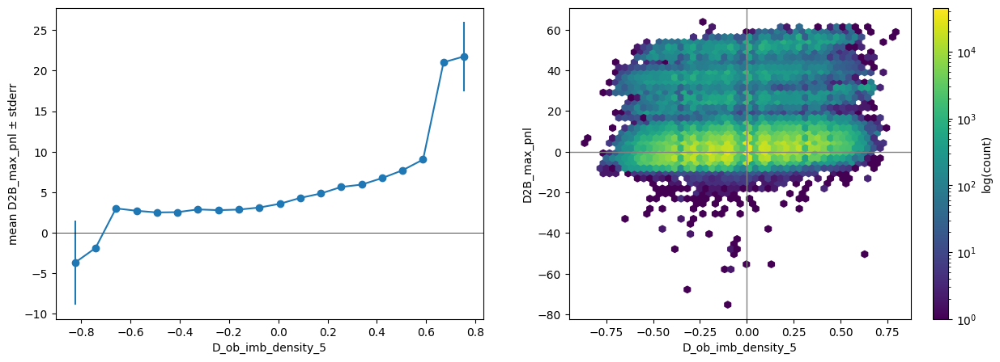

B_S_spread


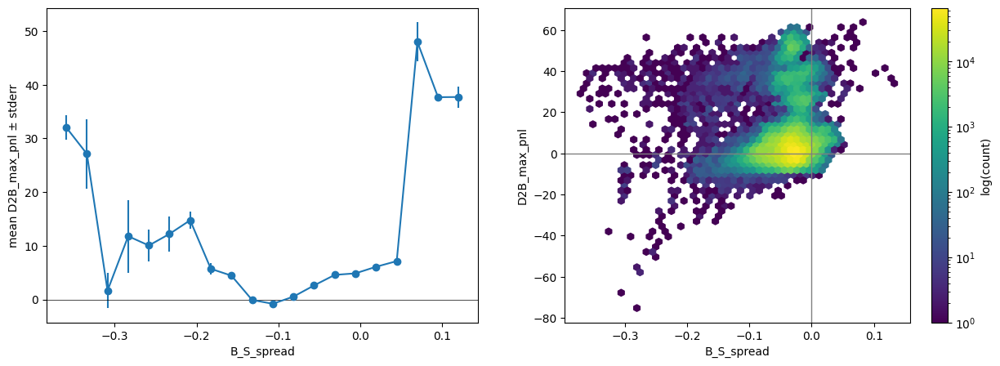

D_ob_imb_volume_5


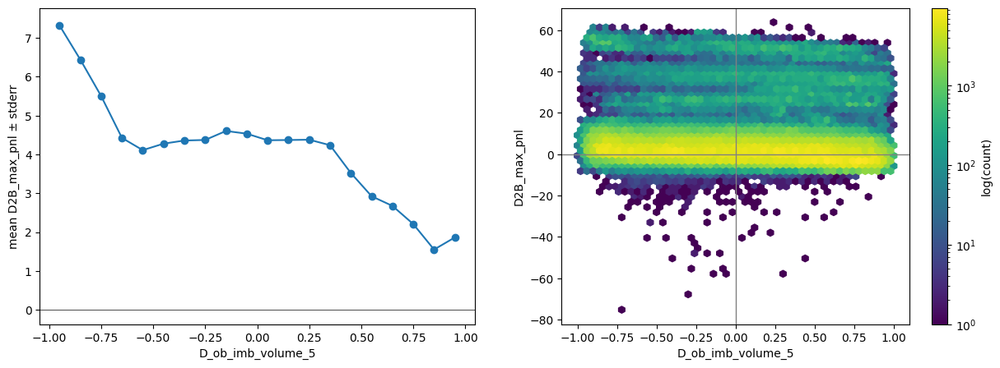

D_ob_imb_density_3


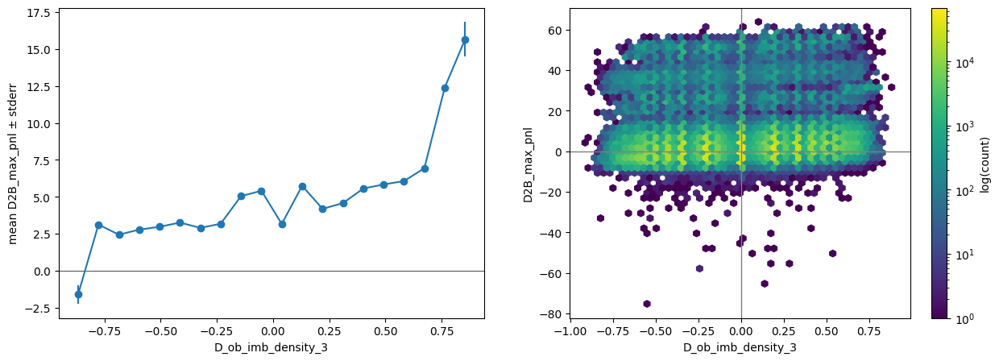

In [ ]:
for feat in list(df[features_cols].corrwith(df['D2B_max_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(df, feat, 'D2B_max_pnl')

# VEL and ACC of KF

In [ ]:
df['D_B_spread_P_KF_vel'].describe()

,D_B_spread_P_KF_vel
count,1.727980e+06
mean,7.769529e-07
std,1.710534e-04
min,-2.427217e-04
25%,-4.247455e-07
50%,-4.639366e-08
75%,4.370487e-07
max,5.422727e-02


In [ ]:
dft = df[(df['D_B_spread_P_KF_vel'].between(-1e-4,1e-4)) & (df['D_B_spread_P_KF_acc'].between(-0.01,0.01))].copy()

D_B_spread_P_KF_vel


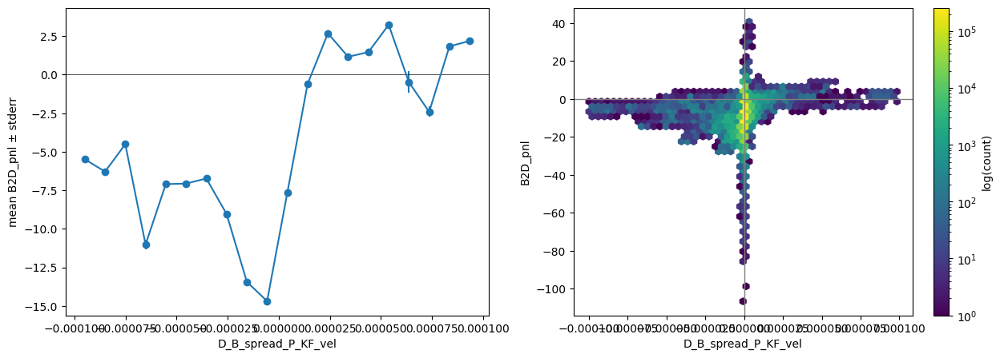

In [ ]:
plot_graph(dft, 'D_B_spread_P_KF_vel', 'B2D_pnl')

D_B_spread_P_KF_vel


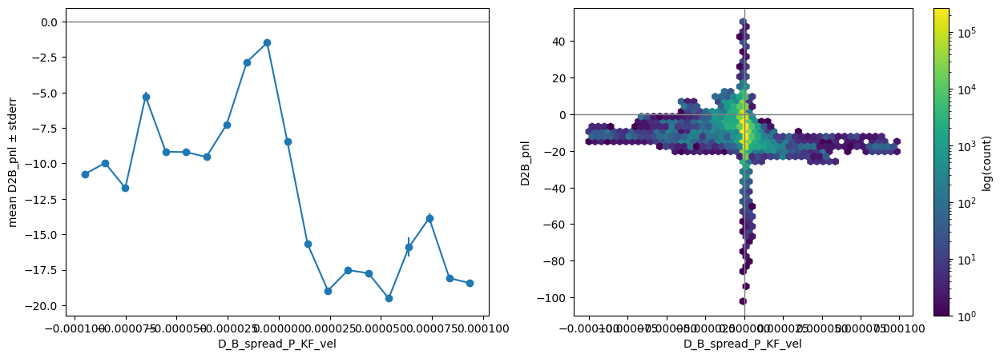

In [ ]:
plot_graph(dft, 'D_B_spread_P_KF_vel', 'D2B_pnl')

D_B_spread_P_KF_acc


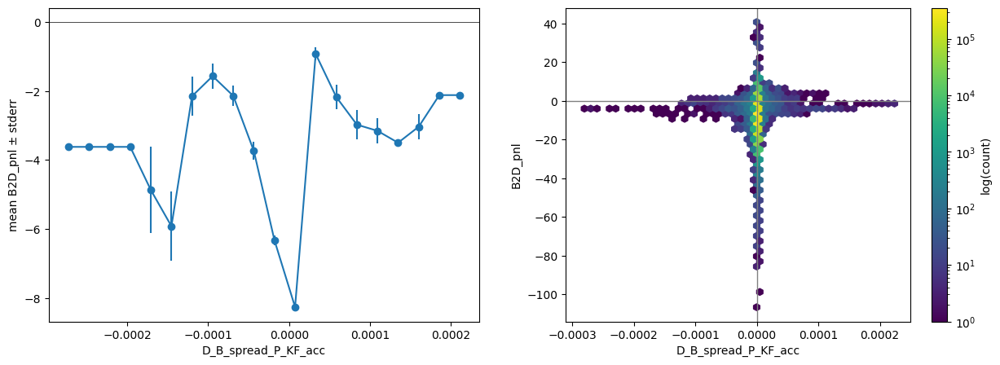

In [ ]:
plot_graph(dft, 'D_B_spread_P_KF_acc', 'B2D_pnl')

D_B_spread_P_KF_acc


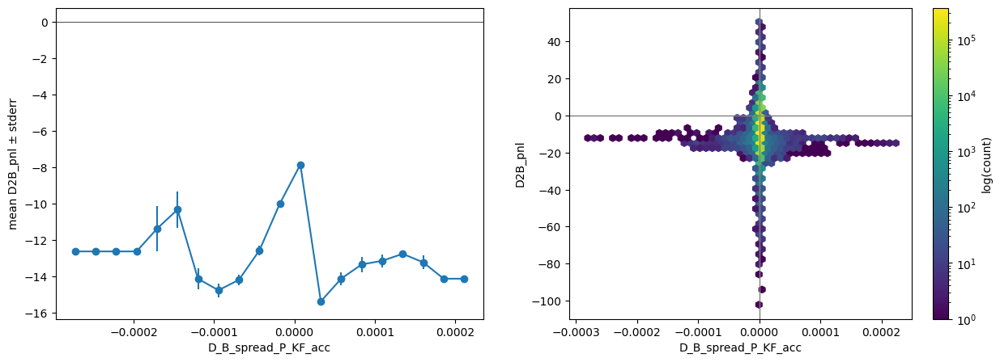

In [ ]:
plot_graph(dft, 'D_B_spread_P_KF_acc', 'D2B_pnl')

# Autocorrelation

In [17]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf

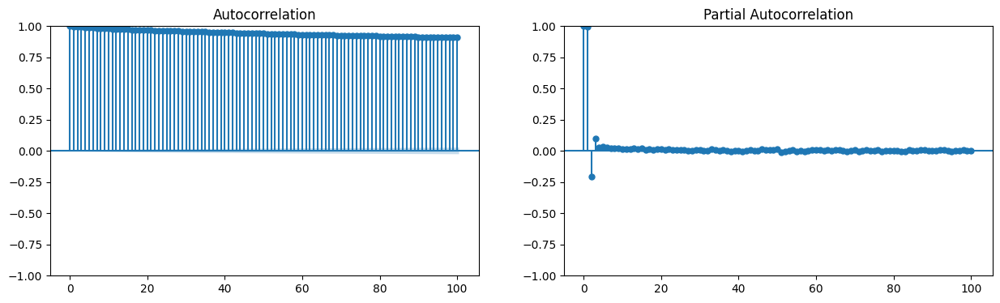

In [18]:
ts = df['D_B_spread_P'].iloc[100:1000000]

_nlags = 100

acf_vals = acf(ts, nlags=_nlags)
pacf_vals = pacf(ts, nlags=_nlags)

fig, axes = plt.subplots(1, 2, figsize=(15,4))
plot_acf(ts, lags=_nlags, ax=axes[0])
plot_pacf(ts, lags=_nlags, ax=axes[1])
plt.show()

The ACF drops very slowly, which indicates that the series is highly inertial - strong autocorrelation remains even after 100 steps (5 seconds).

However, the PACF shows only a few significant lags.

We need to check whether the series is stationary.

To do that, we'll make a copy of the DataFrame, resample it to 1-second intervals, run the ADF test, and then plot ACF and PACF again.

In [19]:
from statsmodels.tsa.stattools import adfuller

In [20]:
dft = df[['D_B_spread_P']].copy()
dft = dft.resample('1s').last()

In [21]:
ts = dft['D_B_spread_P']

In [22]:
ts.isna().sum()

np.int64(0)

In [23]:
result = adfuller(ts,
                  maxlag=None,
                  regression='c',
                  autolag='AIC')

In [24]:
adf_stat, p_value, used_lag, n_obs, crit_vals, ic_best = result

print(f'ADF Statistic: {adf_stat:.4f}')
print(f'p-value: {p_value:.20f}')
print('Critical Values:')
for key, val in crit_vals.items():
    print(f'   {key}: {val:.4f}')

ADF Statistic: -9.9062
p-value: 0.00000000000000003258
Critical Values:
   1%: -3.4304
   5%: -2.8616
   10%: -2.5668


The series is stationary

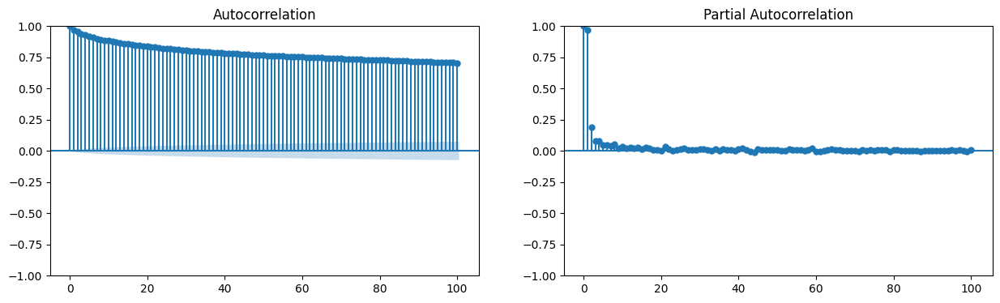

In [25]:
_nlags = 100

acf_vals = acf(ts, nlags=_nlags)
pacf_vals = pacf(ts, nlags=_nlags)

fig, axes = plt.subplots(1, 2, figsize=(15,4))
plot_acf(ts, lags=_nlags, ax=axes[0])
plot_pacf(ts, lags=_nlags, ax=axes[1])
plt.show()

All signs point to an AR(1) model

In [26]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox

In [27]:
model = ARIMA(ts, order=(1,0,0))
res   = model.fit()
resid = res.resid.dropna()

#Ljung-Box test for white noise on lags 1-2
lb = acorr_ljungbox(resid, lags=range(1,3), return_df=True)

print(lb)

       lb_stat  lb_pvalue
1  2864.276258        0.0
2  2936.038555        0.0


Noise isn't white

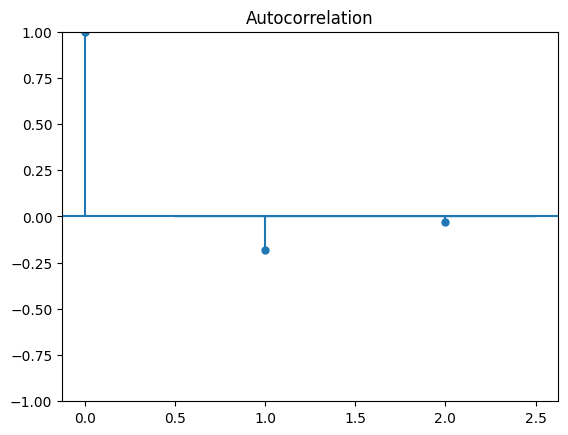

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(resid, lags=2)
plt.show()

adding MA(1)

      lb_stat     lb_pvalue
1    1.604241  2.053032e-01
2  236.471418  4.475937e-52


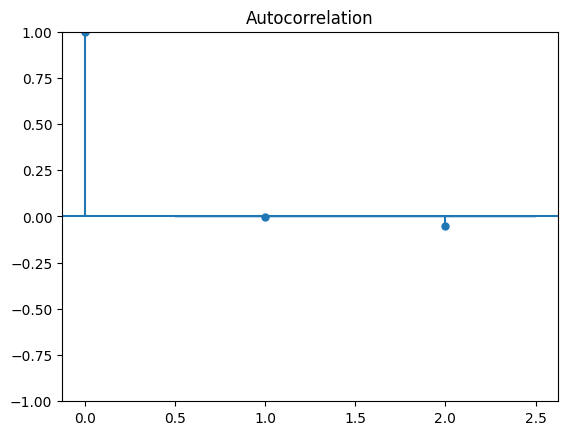

In [ ]:
model11 = ARIMA(ts, order=(1,0,1))
res11   = model11.fit()
resid11 = res11.resid.dropna()

lb11 = acorr_ljungbox(resid11, lags=range(1,3), return_df=True)
print(lb11)

plot_acf(resid11, lags=2)
plt.show()

Noise isn't white again. Adding component

    lb_stat  lb_pvalue
1  0.000002   0.999005
2  0.124631   0.939586


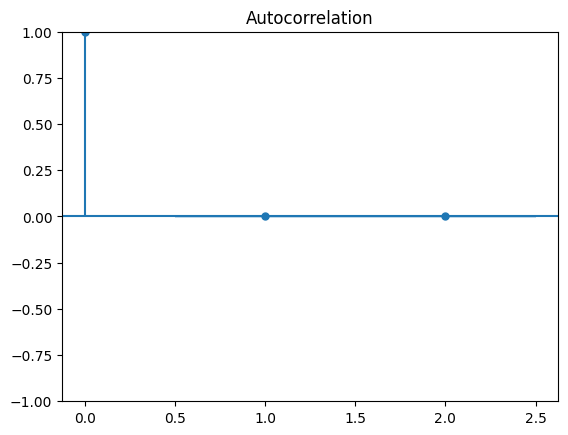

In [ ]:
model = ARIMA(ts, order=(1,0,2))
res   = model.fit()
resid = res.resid.dropna()

lb = acorr_ljungbox(resid, lags=range(1,3), return_df=True)
print(lb)
plot_acf(resid, lags=2)
plt.show()

In [ ]:
print(res.summary())

                               SARIMAX Results                                
Dep. Variable:           D_B_spread_P   No. Observations:                86400
Model:                 ARIMA(1, 0, 2)   Log Likelihood              334438.624
Date:                Thu, 26 Jun 2025   AIC                        -668867.247
Time:                        15:47:42   BIC                        -668820.413
Sample:                    01-30-2023   HQIC                       -668852.940
                         - 01-30-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0687      0.001     78.027      0.000       0.067       0.070
ar.L1          0.9858      0.000   2177.438      0.000       0.985       0.987
ma.L1         -0.2207      0.001   -177.937      0.0

In [ ]:
from statsmodels.graphics.gofplots import qqplot

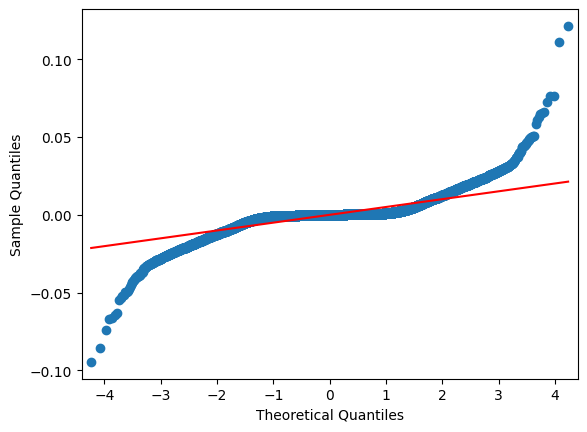

In [ ]:
qqplot(resid, line='s')
plt.show()

In [ ]:
from statsmodels.stats.diagnostic import het_arch

In [ ]:
arch_test = het_arch(resid)
print('ARCH test p-value:', arch_test[1])

ARCH test p-value: 0.0


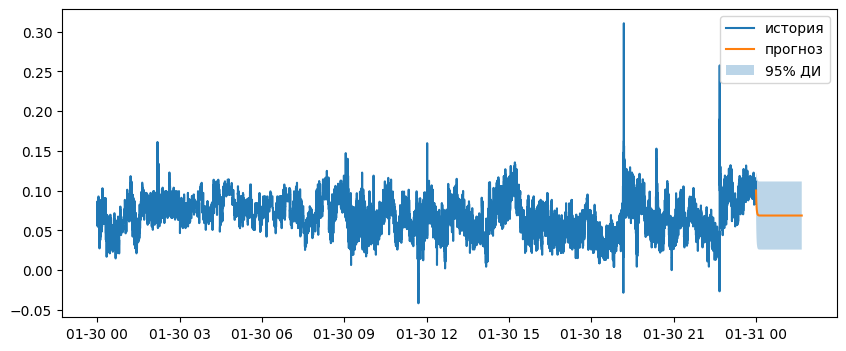

In [ ]:
fc = res.get_forecast(steps=6000)
mean = fc.predicted_mean
ci   = fc.conf_int()

plt.figure(figsize=(10,4))
plt.plot(ts, label='история')
plt.plot(mean.index, mean, label='прогноз')
plt.fill_between(ci.index, ci.iloc[:,0], ci.iloc[:,1],
                 alpha=0.3, label='95% ДИ')
plt.legend()
plt.show()

# RF spread is getting up or getting down

Try predict spread (getting).

Use 10 secs for get more data with classes 1 and -1

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [ ]:
df['y'] = df['D_B_spread'].shift(-200) - df['D_B_spread']

In [ ]:
df['y'] = df['y'].map(lambda x: -1 if x < -1e-5 else 1 if x > 1e-5 else 0)

In [ ]:
len(df[df['y'] > 0]), len(df[df['y'] < 0]), len(df[df['y'] == 0])

(555956, 539650, 632394)

In [ ]:
features_cols_RF = [
    'D_B_spread_P_EWM_delta',
    'D_spread',
    'B_spread',
    'B_S_spread',
    'D_S_spread',
    'B_ob_imb_volume_1',
    'D_ob_imb_volume_2',
    'D_ob_imb_volume_1',
    'D_ob_imb_density_2',
    'B_ob_imb_volume_2',
    'B_ob_imb_density_2',
    'D_ob_imb_volume_3',
    'D_ob_imb_density_3',
    'B_ob_imb_volume_3',
    'B_ob_imb_density_3',
    'D_ob_imb_volume_5',
    'D_ob_imb_density_5',
    'B_ob_imb_volume_5',
    'B_ob_imb_density_5',
    'D_ob_imb_volume_10',
    'D_ob_imb_density_10',
    'B_ob_imb_volume_10',
    'B_ob_imb_density_10',
    'spot_agression',
    'D_B_spread_P_EWM_vel',
    'D_B_spread_P_EWM_acc',
]

In [ ]:
temt_df = df[df['y'] != 0][features_cols + ['y']].copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF], temt_df['y'], test_size=0.5, shuffle=False
)

In [ ]:
temt_df.columns

Index(['D_B_spread_P_EWM_Z', 'D_B_spread_P_EWM_delta', 'D_spread', 'B_spread',
       'B_S_spread', 'D_S_spread', 'D_B_spread_P_KF_delta',
       'D_B_spread_P_EWM_vel', 'D_B_spread_P_EWM_acc', 'D_B_spread_P_KF_vel',
       'D_B_spread_P_KF_acc', 'D_ob_imb_volume_1', 'B_ob_imb_volume_1',
       'D_ob_imb_volume_2', 'D_ob_imb_density_2', 'B_ob_imb_volume_2',
       'B_ob_imb_density_2', 'D_ob_imb_volume_3', 'D_ob_imb_density_3',
       'B_ob_imb_volume_3', 'B_ob_imb_density_3', 'D_ob_imb_volume_5',
       'D_ob_imb_density_5', 'B_ob_imb_volume_5', 'B_ob_imb_density_5',
       'D_ob_imb_volume_10', 'D_ob_imb_density_10', 'B_ob_imb_volume_10',
       'B_ob_imb_density_10', 'D_B_micro', 'spot_agression', 'y'],
      dtype='object')

In [ ]:
rf = RandomForestClassifier(
    n_estimators=1000,
    max_samples=10000,
    max_depth=3,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)

y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.60      0.52      0.56    271815
           1       0.58      0.65      0.62    275988

    accuracy                           0.59    547803
   macro avg       0.59      0.59      0.59    547803
weighted avg       0.59      0.59      0.59    547803



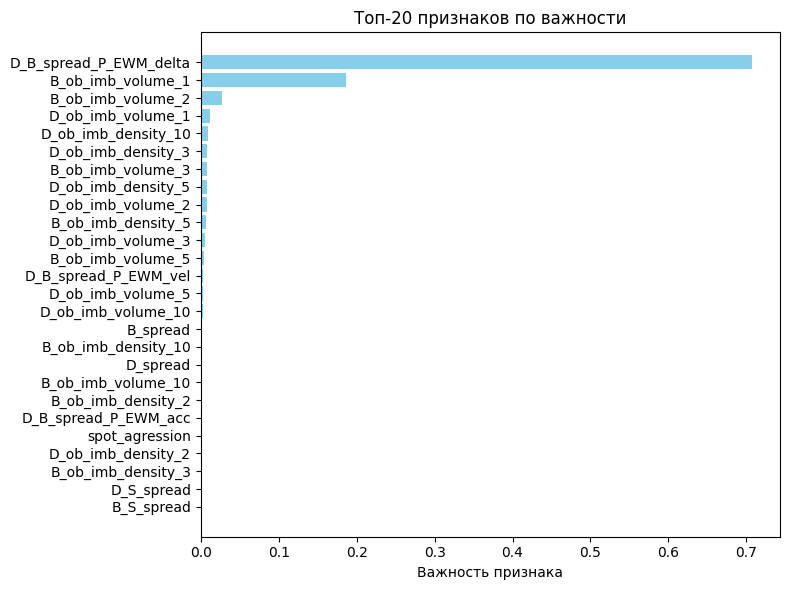

In [ ]:
feature_names = X_train.columns

importances = rf.feature_importances_

feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)

top20 = feat_imp_df.head(100).iloc[::-1]

plt.figure(figsize=(8, 6))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

In [ ]:
features_cols_RF_short = feat_imp_df.sort_values(by='importance', ascending=False).head(5)['feature'].to_list()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF_short], temt_df['y'], test_size=0.5, shuffle=False
)

In [ ]:
rf = RandomForestClassifier(
    n_estimators=5000,
    max_samples=1000,
    max_depth=4,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)

y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.65      0.62      0.63    271815
           1       0.64      0.67      0.65    275988

    accuracy                           0.64    547803
   macro avg       0.64      0.64      0.64    547803
weighted avg       0.64      0.64      0.64    547803



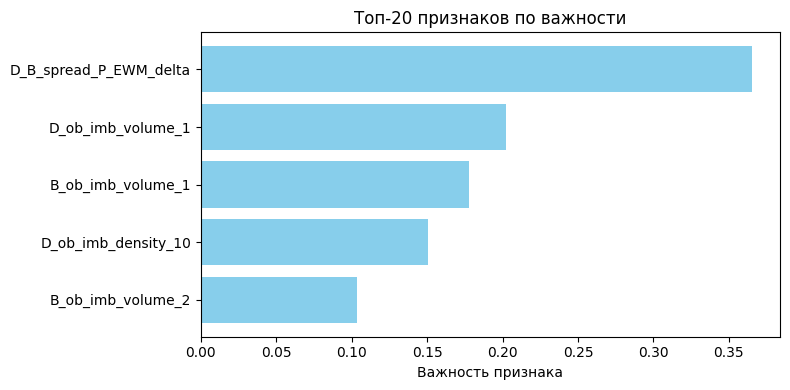

In [ ]:
feature_names = X_train.columns

importances = rf.feature_importances_

feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)

top20 = feat_imp_df.head(5).iloc[::-1]

plt.figure(figsize=(8, 4))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

# RF pnl > median or < median

In [ ]:
df['y'] = df['B2D_pnl'].map(lambda x: 1 if x > -8.3 else 0)
df['y'].mean()

np.float64(0.5038732638888889)

              precision    recall  f1-score   support

           0       0.82      0.46      0.59    444794
           1       0.61      0.89      0.72    419206

    accuracy                           0.67    864000
   macro avg       0.71      0.68      0.66    864000
weighted avg       0.72      0.67      0.65    864000



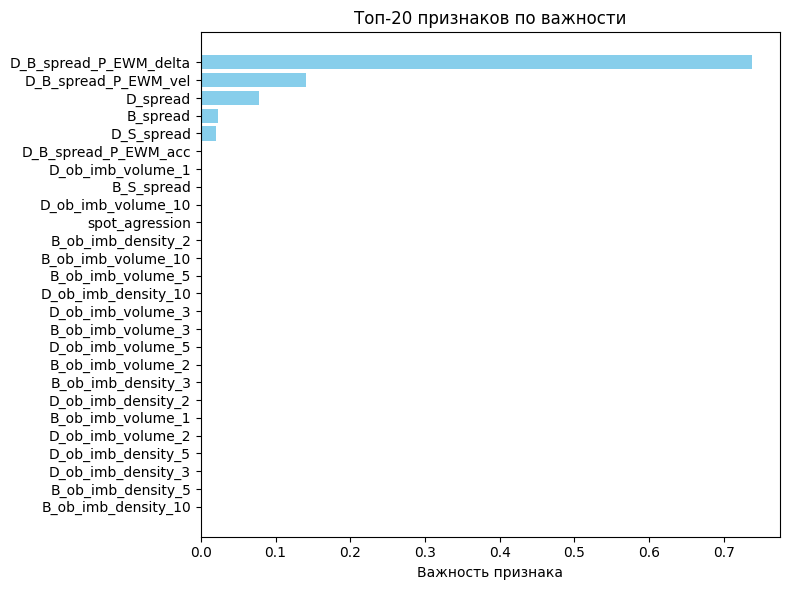

In [ ]:
temt_df = df[features_cols + ['y']].copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF], temt_df['y'], test_size=0.5, shuffle=False
)

rf = RandomForestClassifier(
    n_estimators=1000,
    max_samples=10000,
    max_depth=3,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)
y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))


feature_names = X_train.columns
importances = rf.feature_importances_
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)
top20 = feat_imp_df.head(100).iloc[::-1]
plt.figure(figsize=(8, 6))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

              precision    recall  f1-score   support

           0       0.70      0.65      0.68    444794
           1       0.66      0.71      0.68    419206

    accuracy                           0.68    864000
   macro avg       0.68      0.68      0.68    864000
weighted avg       0.68      0.68      0.68    864000



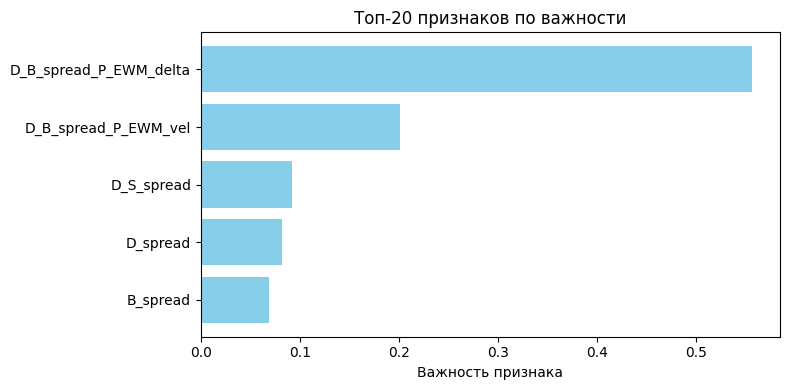

In [ ]:
features_cols_RF_short = feat_imp_df.sort_values(by='importance', ascending=False).head(5)['feature'].to_list()

X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF_short], temt_df['y'], test_size=0.5, shuffle=False
)

rf = RandomForestClassifier(
    n_estimators=5000,
    max_samples=1000,
    max_depth=4,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)
y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))

feature_names = X_train.columns
importances = rf.feature_importances_
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)
top20 = feat_imp_df.head(5).iloc[::-1]
plt.figure(figsize=(8, 4))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

# RF pnl_max > median or < median

In [ ]:
df['B2D_max_pnl'].mean(), df['B2D_max_pnl'].median()

(np.float32(2.2121642), 1.3781251907348633)

In [ ]:
df['y'] = df['B2D_max_pnl'].map(lambda x: 1 if x > 1.38 else 0)
df['y'].mean()

np.float64(0.49995081018518517)

              precision    recall  f1-score   support

           0       0.56      0.77      0.65    393093
           1       0.72      0.50      0.59    470907

    accuracy                           0.62    864000
   macro avg       0.64      0.63      0.62    864000
weighted avg       0.65      0.62      0.62    864000



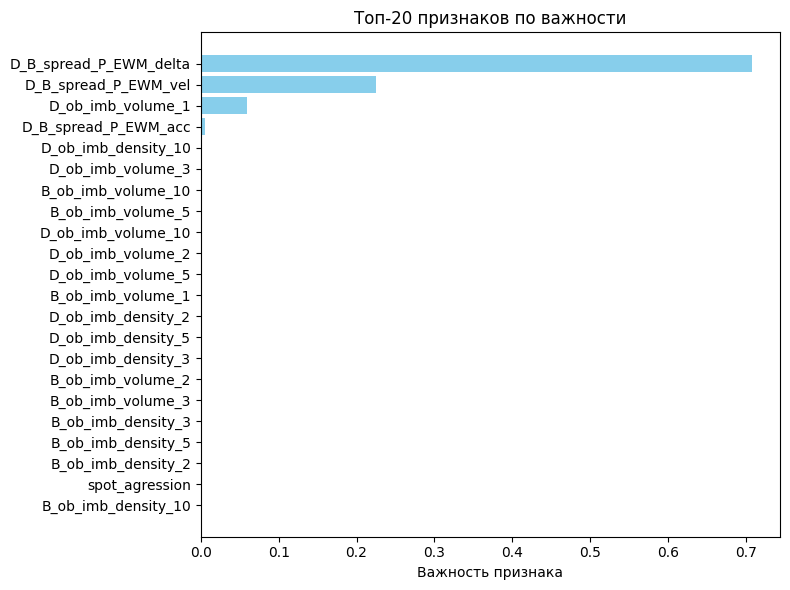

In [ ]:
temt_df = df[features_cols + ['y']].copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

features_cols_RF = [
    'D_B_spread_P_EWM_delta',
    'B_ob_imb_volume_1',
    'D_ob_imb_volume_2',
    'D_ob_imb_volume_1',
    'D_ob_imb_density_2',
    'B_ob_imb_volume_2',
    'B_ob_imb_density_2',
    'D_ob_imb_volume_3',
    'D_ob_imb_density_3',
    'B_ob_imb_volume_3',
    'B_ob_imb_density_3',
    'D_ob_imb_volume_5',
    'D_ob_imb_density_5',
    'B_ob_imb_volume_5',
    'B_ob_imb_density_5',
    'D_ob_imb_volume_10',
    'D_ob_imb_density_10',
    'B_ob_imb_volume_10',
    'B_ob_imb_density_10',
    'spot_agression',
    'D_B_spread_P_EWM_vel',
    'D_B_spread_P_EWM_acc',
]

X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF], temt_df['y'], test_size=0.5, shuffle=False
)

rf = RandomForestClassifier(
    n_estimators=1000,
    max_samples=10000,
    max_depth=3,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)
y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))


feature_names = X_train.columns
importances = rf.feature_importances_
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)
top20 = feat_imp_df.head(100).iloc[::-1]
plt.figure(figsize=(8, 6))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

              precision    recall  f1-score   support

           0       0.57      0.76      0.65    393093
           1       0.72      0.51      0.60    470907

    accuracy                           0.63    864000
   macro avg       0.64      0.64      0.62    864000
weighted avg       0.65      0.63      0.62    864000



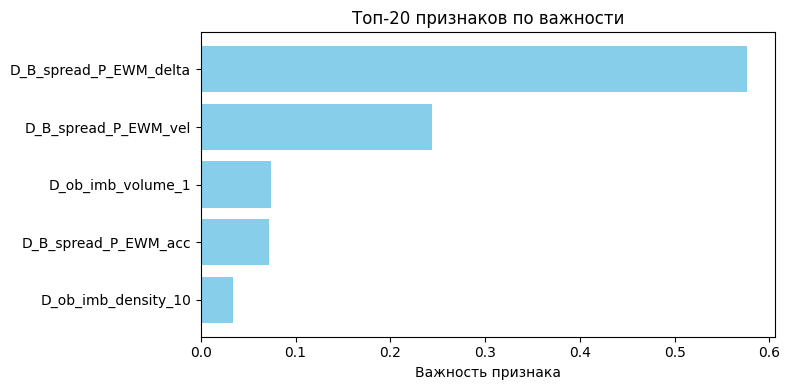

In [ ]:
features_cols_RF_short = feat_imp_df.sort_values(by='importance', ascending=False).head(5)['feature'].to_list()

X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF_short], temt_df['y'], test_size=0.5, shuffle=False
)

rf = RandomForestClassifier(
    n_estimators=5000,
    max_samples=1000,
    max_depth=4,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)
y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))

feature_names = X_train.columns
importances = rf.feature_importances_
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)
top20 = feat_imp_df.head(5).iloc[::-1]
plt.figure(figsize=(8, 4))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

# TARGET: buy every points, sell when DELTA ~ 0

In [ ]:
fee_Dx = fee_D
fee_Bx = fee_B
ticks_per_sec = 20
L = ticks_per_sec * 60 * 60
tol = 1e-8

D_bid = df['D_ob_bid_price_0'].values
D_ask = df['D_ob_ask_price_0'].values
B_bid = df['B_ob_bid_price_0'].values
B_ask = df['B_ob_ask_price_0'].values

delta = (df['D_B_spread_P'] - df['D_B_spread_P_EWM']).values

entry_idxs = np.arange(len(df))
B2D_D2B_delta_0_pnl = []

for i in entry_idxs:
    j_end = min(i + L, len(df))
    delta_slice = delta[i:j_end]

    rel = np.where(np.abs(delta_slice) <= tol)[0]
    rel_idx = rel[0] if rel.size else (j_end - i - 1)
    exit_idx = i + rel_idx

    # --- D buy / B sell (D2B) ---
    D_entry = D_ask[i]
    B_entry = B_bid[i]
    D_exit  = D_bid[exit_idx]
    B_exit  = B_ask[exit_idx]
    pnl_D2B = (
        (D_exit - D_entry)
      - (B_exit - B_entry)
      - (D_entry + D_exit) * fee_Dx
      - (B_entry + B_exit) * fee_Bx
    )

    # --- B buy / D sell (B2D) ---
    D_entry2 = D_bid[i]
    B_entry2 = B_ask[i]
    D_exit2  = D_ask[exit_idx]
    B_exit2  = B_bid[exit_idx]
    pnl_B2D = (
        -(D_exit2 - D_entry2)
      + (B_exit2 - B_entry2)
      - (D_entry2 + D_exit2) * fee_Dx
      - (B_entry2 + B_exit2) * fee_Bx
    )

    B2D_D2B_delta_0_pnl.append({
        'i_start': i,
        'i_exit':  exit_idx,
        'D2B_pnl': pnl_D2B,
        'B2D_pnl': pnl_B2D
    })

In [ ]:
rs = pd.DataFrame(B2D_D2B_delta_0_pnl)
df['D2B_delta0_pnl'] = rs['D2B_pnl'].values
df['B2D_delta0_pnl'] = rs['B2D_pnl'].values

In [ ]:
print(df['D2B_delta0_pnl'].mean(), df['B2D_delta0_pnl'].mean())

-7.626694 -8.464513


D_B_micro


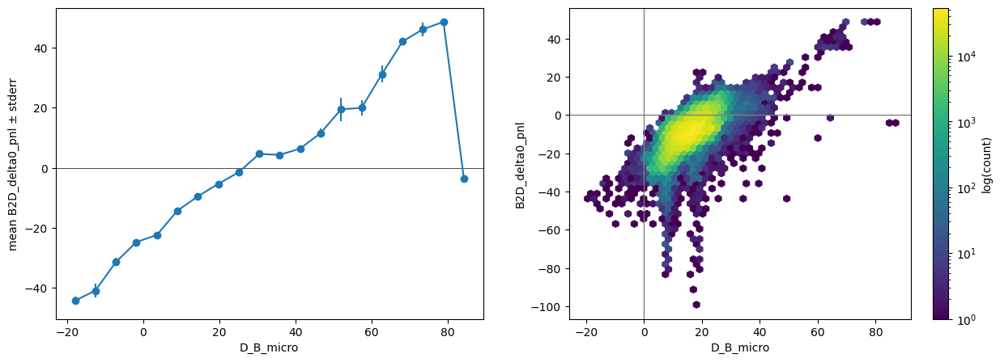

D_B_spread_P_KF_delta


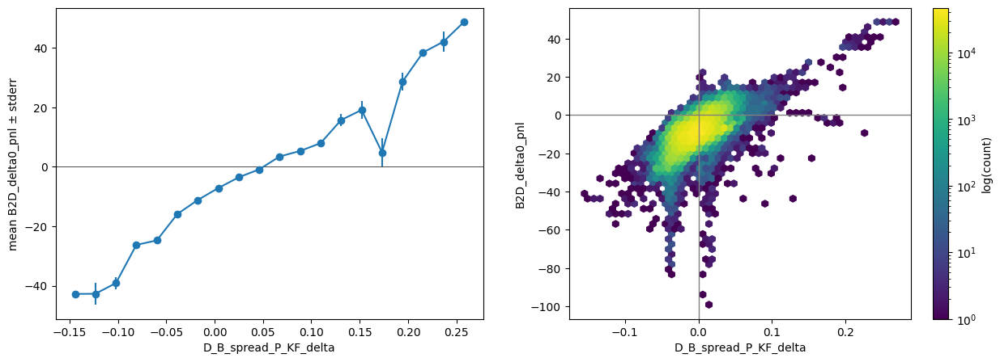

D_B_spread_P_EWM_Z


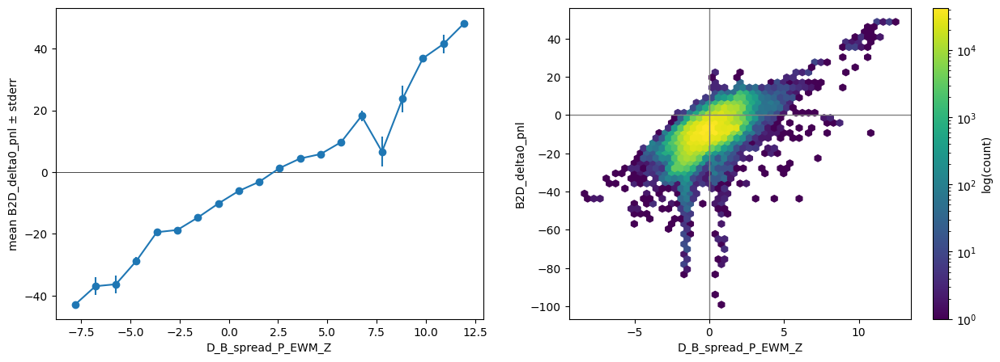

D_B_spread_P_EWM_delta


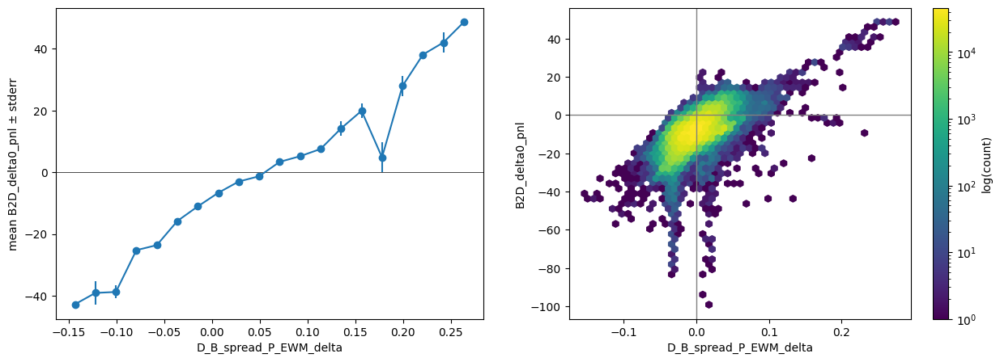

B_S_spread


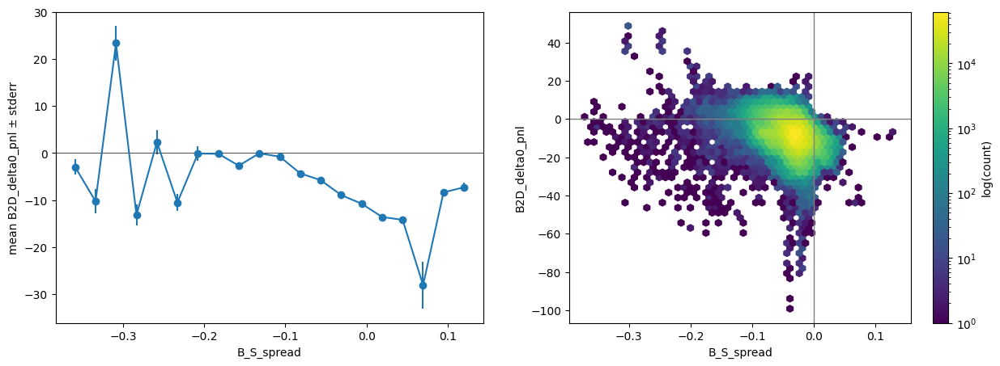

D_ob_imb_density_10


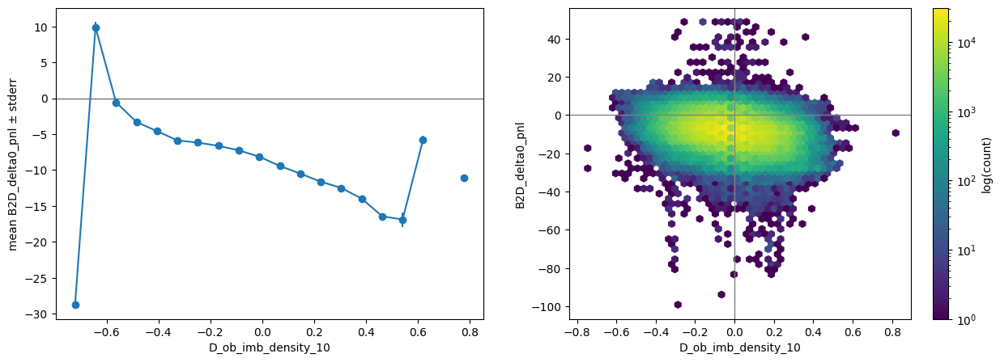

D_S_spread


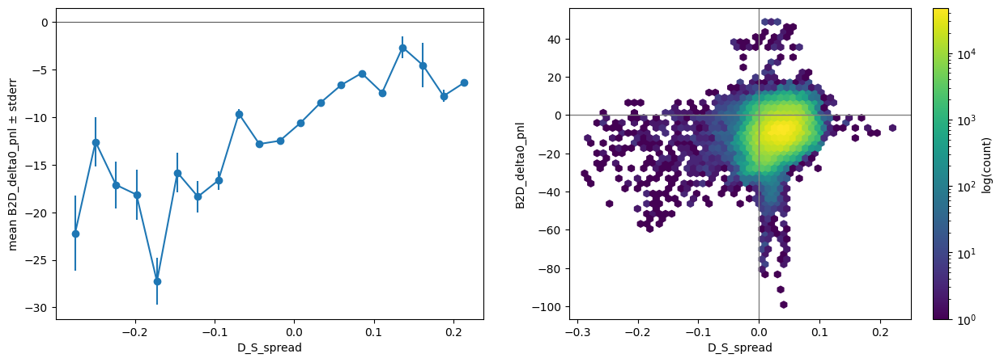

D_ob_imb_density_5


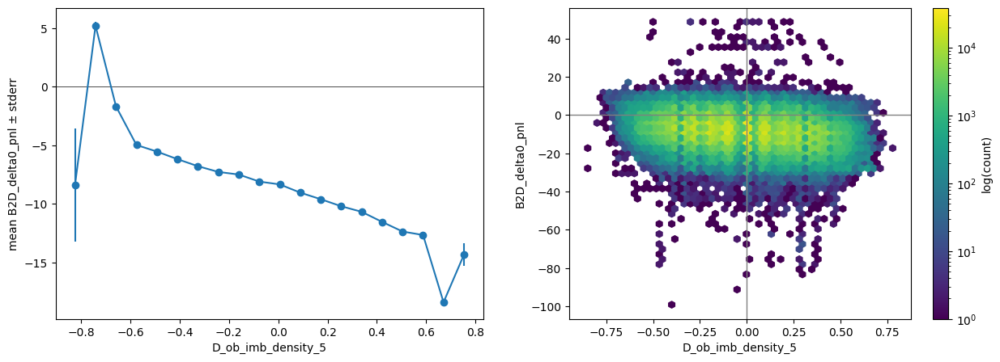

D_ob_imb_density_3


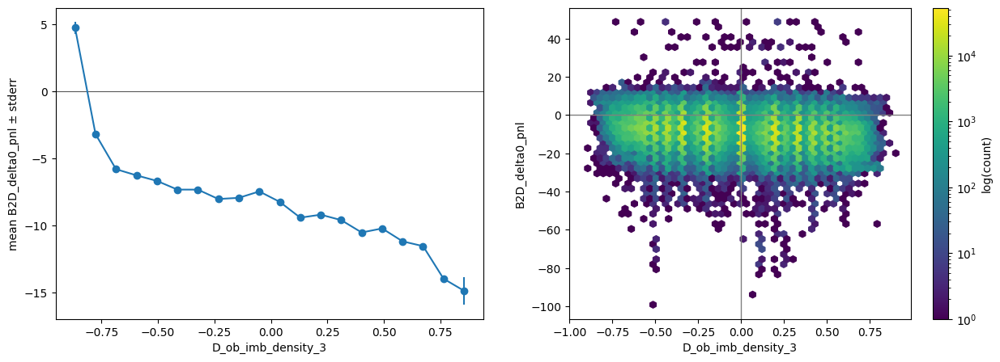

D_ob_imb_volume_3


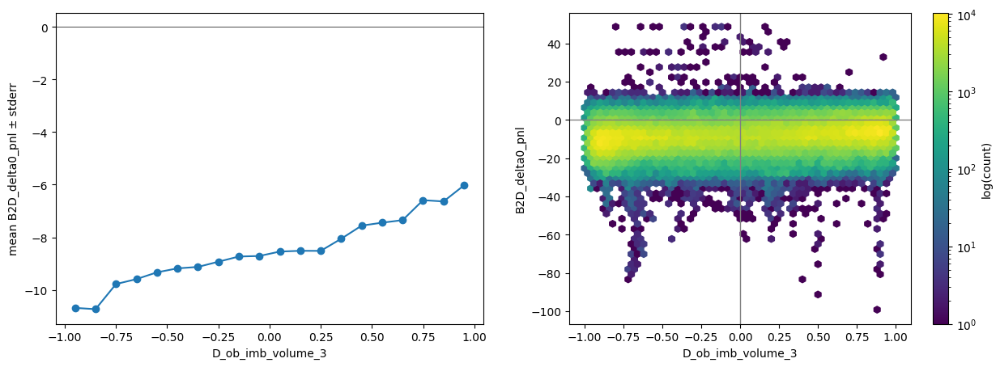

In [ ]:
for feat in list(df[features_cols].corrwith(df['B2D_delta0_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(df, feat, 'B2D_delta0_pnl')

D_B_micro


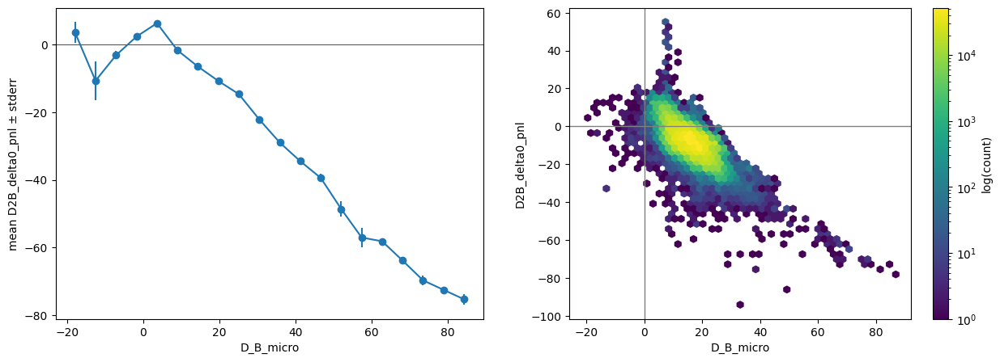

D_B_spread_P_KF_delta


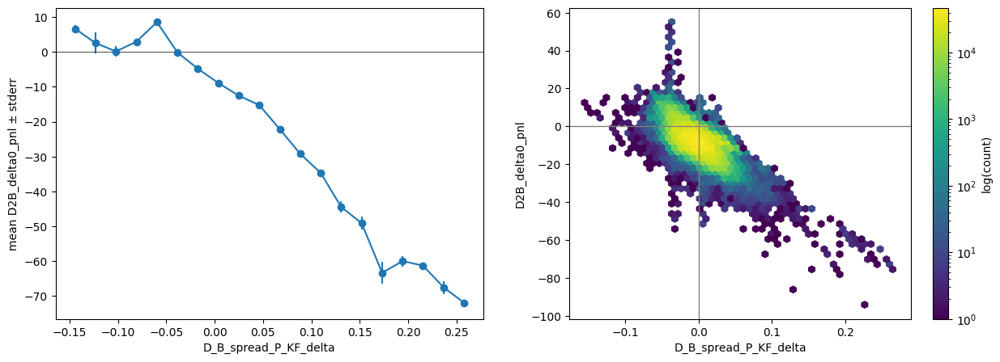

D_B_spread_P_EWM_Z


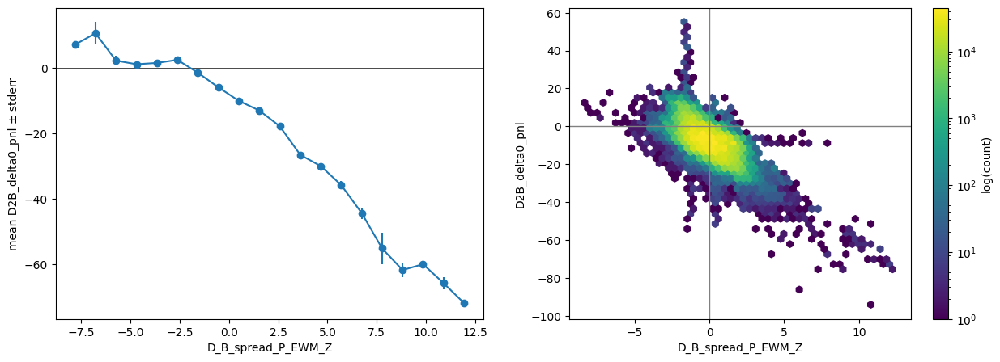

D_B_spread_P_EWM_delta


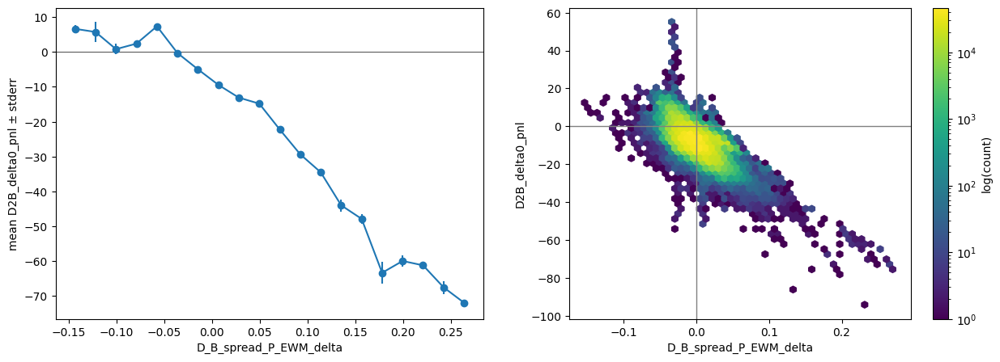

B_S_spread


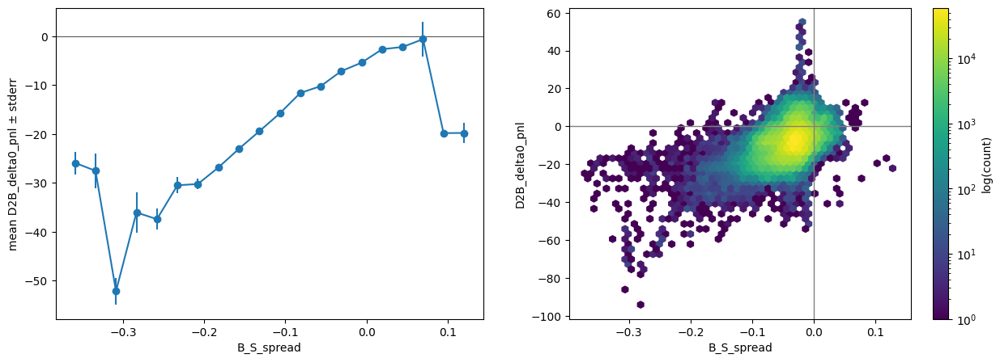

D_ob_imb_density_10


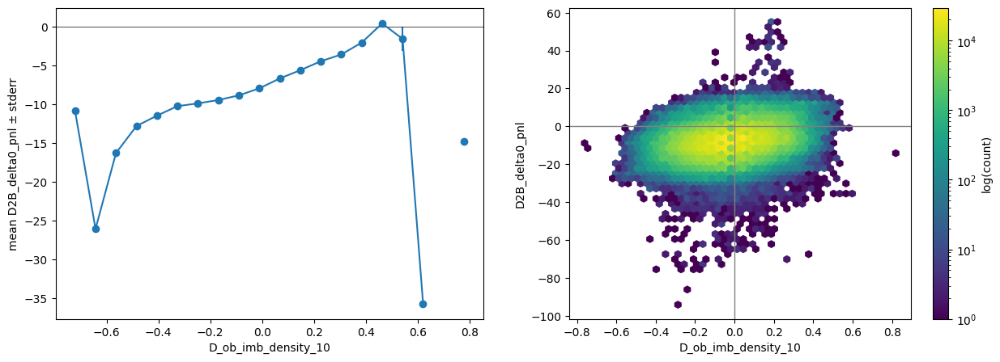

D_S_spread


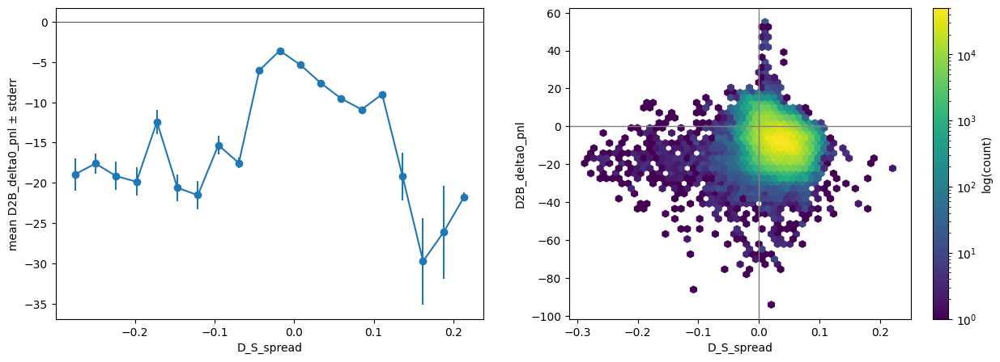

D_ob_imb_density_5


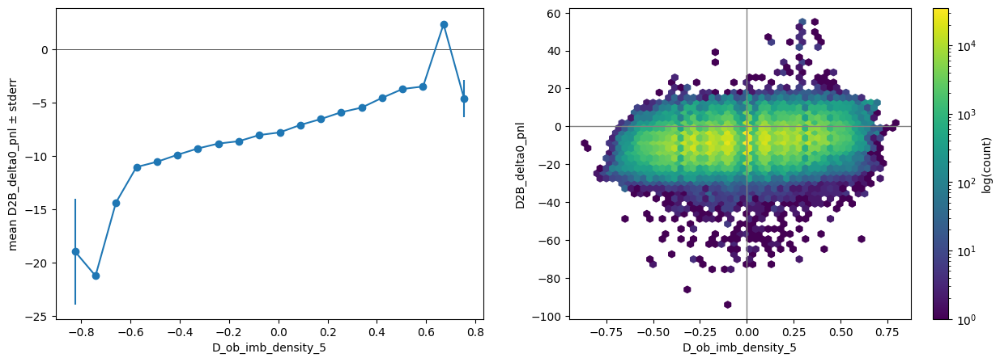

D_ob_imb_density_3


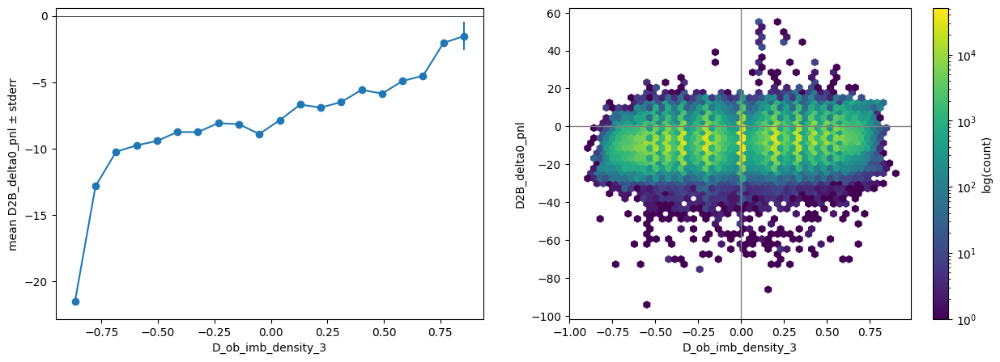

D_ob_imb_volume_2


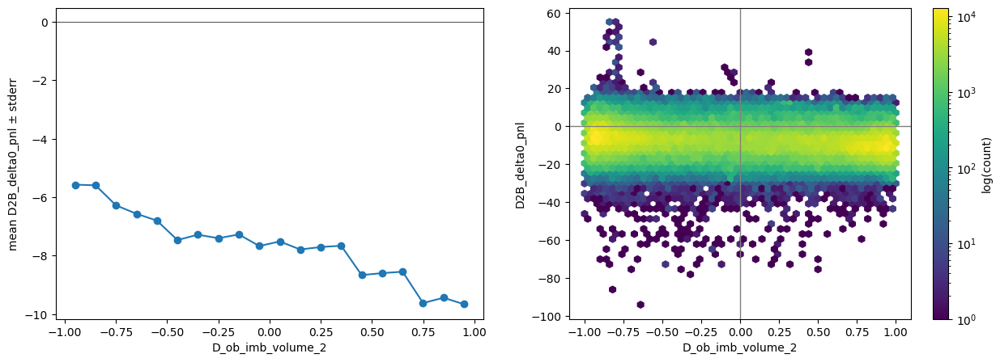

In [ ]:
for feat in list(df[features_cols].corrwith(df['D2B_delta0_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(df, feat, 'D2B_delta0_pnl')

D_B_micro_rs


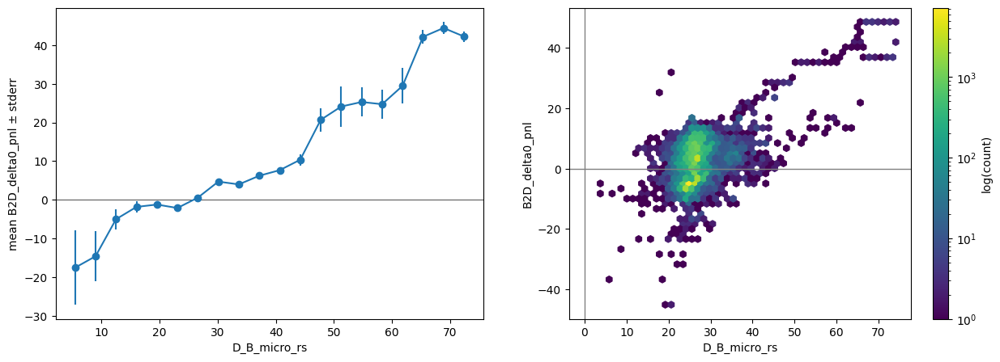

D_B_spread_P_EWM_Z_rs


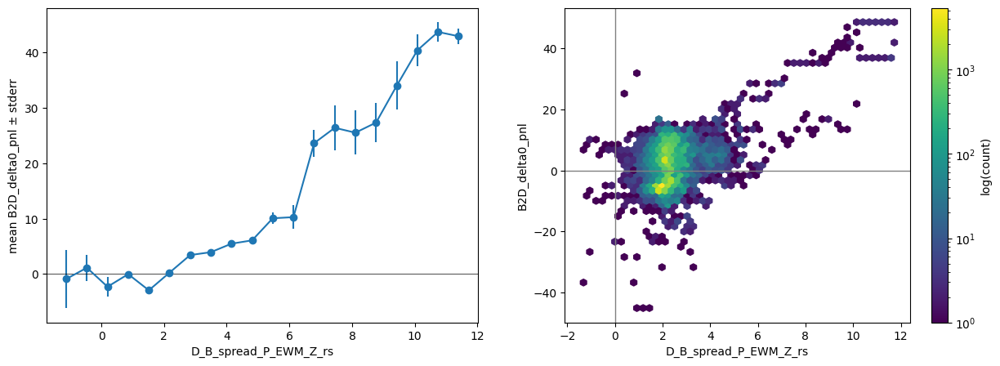

D_B_spread_P_KF_delta_rs


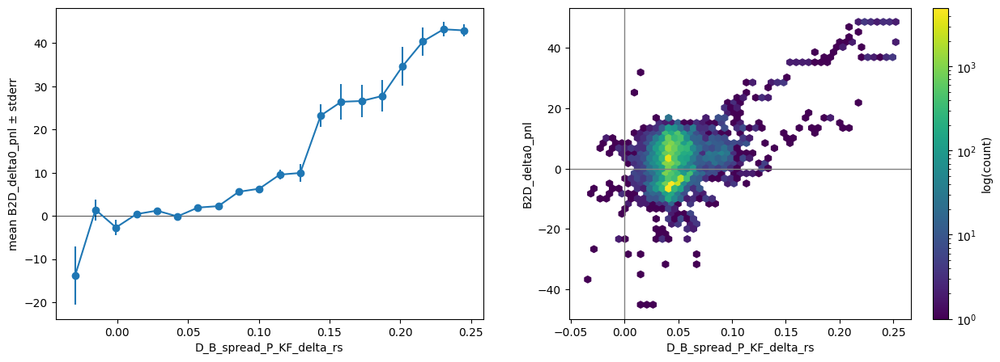

D_B_spread_P_EWM_delta_rs


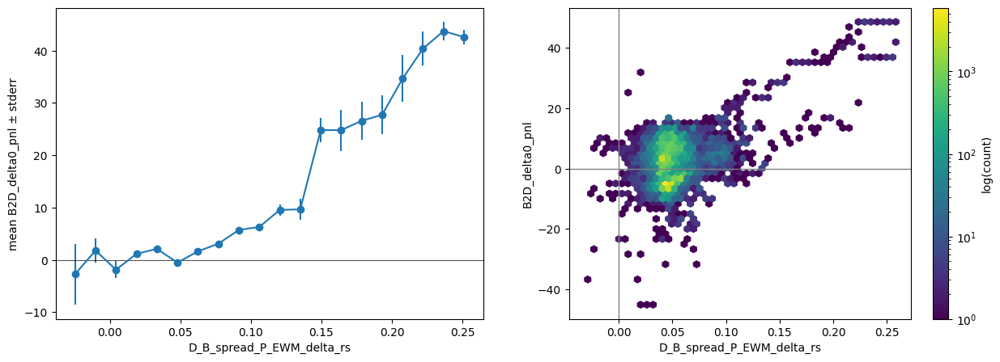

B_ob_imb_volume_2_rs


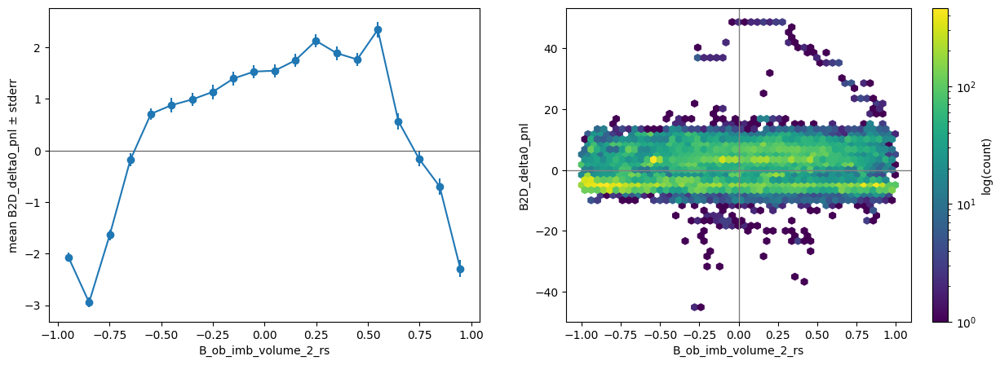

B_ob_imb_volume_3_rs


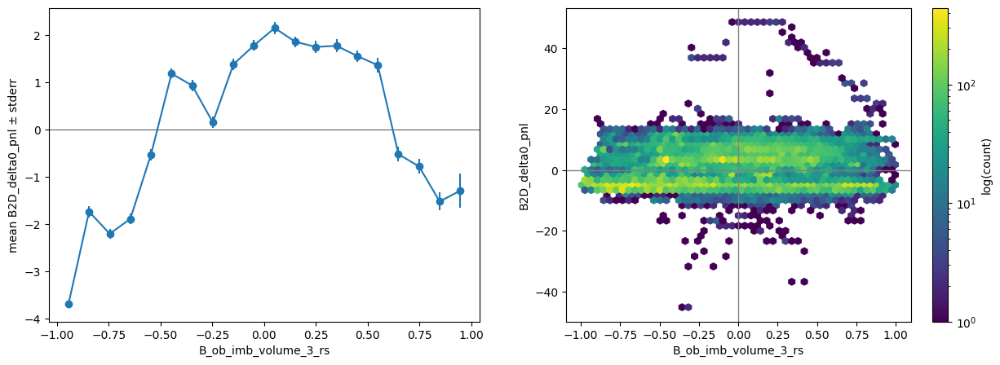

D_spread_rs


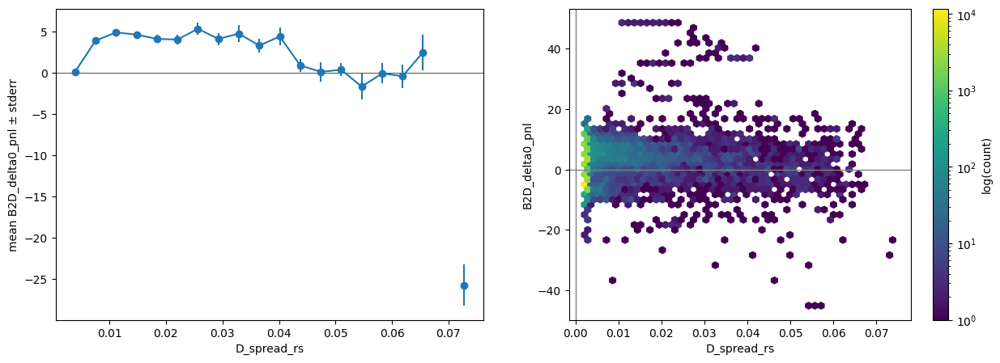

B_S_spread_rs


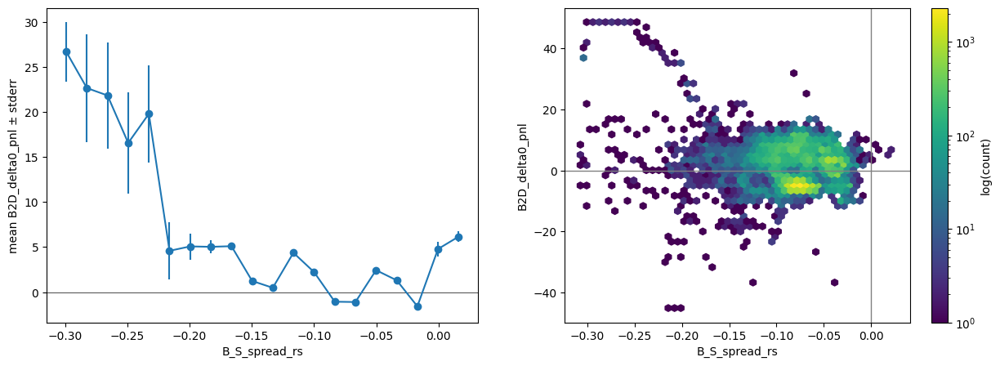

B_ob_imb_density_10_rs


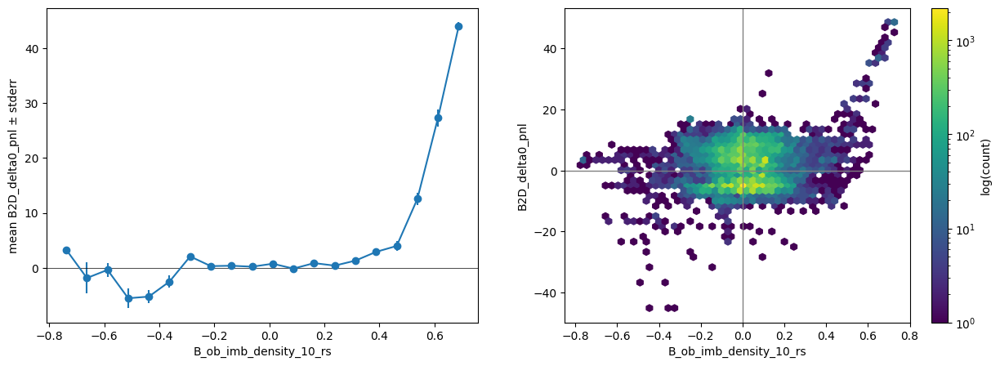

B_ob_imb_volume_1_rs


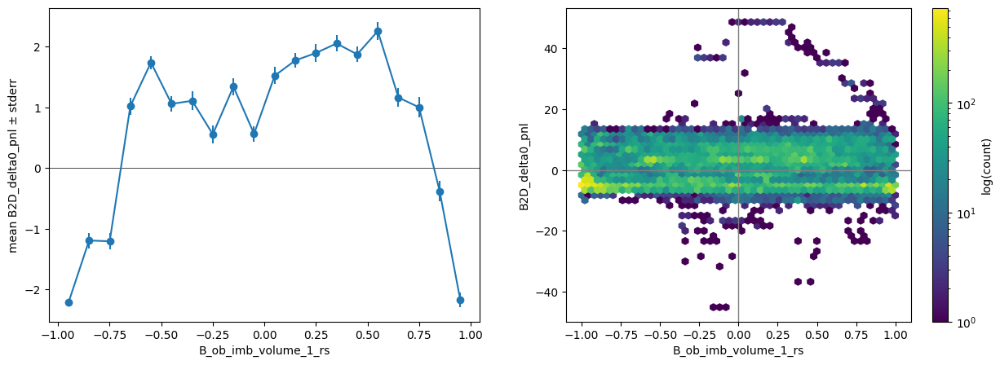

In [ ]:
dft = df[df['D_B_spread_P_KF_delta'] > (fee_D + fee_B)*2.64*100].copy()
for feat in list(dft[rolling_features_cols].corrwith(dft['B2D_delta0_pnl']).abs().sort_values(ascending=False).head(10).index):
    plot_graph(dft, feat, 'B2D_delta0_pnl')

In [ ]:
(fee_D + fee_B)*100*3

0.045000000000000005

In [ ]:
df[df['D_B_spread_P_KF_delta'] > (fee_D + fee_B)*2.64*100]['B2D_delta0_pnl'].sum()

np.float32(19199.672)

# RF

In [ ]:
df['y'] = df[df['D_B_spread_P_KF_delta'] > 0.0]['B2D_delta0_pnl'].map(lambda x: 1 if x > 0 else 0)
df['y'].mean()

np.float64(0.22274493155688949)

              precision    recall  f1-score   support

         0.0       0.69      0.82      0.75    269417
         1.0       0.42      0.26      0.32    135737

    accuracy                           0.63    405154
   macro avg       0.55      0.54      0.54    405154
weighted avg       0.60      0.63      0.61    405154



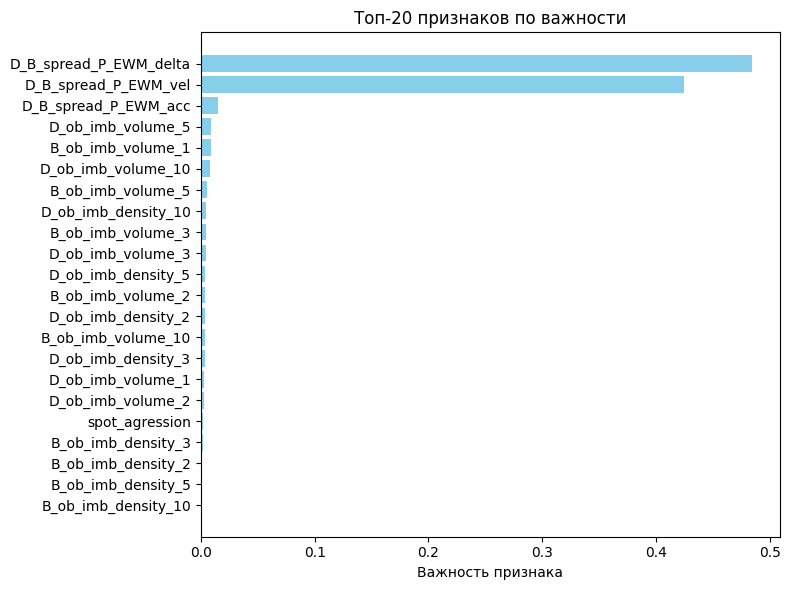

In [ ]:
temt_df = df[df['D_B_spread_P_KF_delta'] > 0.0][features_cols + ['y']].copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

features_cols_RF = [
    'D_B_spread_P_EWM_delta',
    'B_ob_imb_volume_1',
    'D_ob_imb_volume_2',
    'D_ob_imb_volume_1',
    'D_ob_imb_density_2',
    'B_ob_imb_volume_2',
    'B_ob_imb_density_2',
    'D_ob_imb_volume_3',
    'D_ob_imb_density_3',
    'B_ob_imb_volume_3',
    'B_ob_imb_density_3',
    'D_ob_imb_volume_5',
    'D_ob_imb_density_5',
    'B_ob_imb_volume_5',
    'B_ob_imb_density_5',
    'D_ob_imb_volume_10',
    'D_ob_imb_density_10',
    'B_ob_imb_volume_10',
    'B_ob_imb_density_10',
    'spot_agression',
    'D_B_spread_P_EWM_vel',
    'D_B_spread_P_EWM_acc',
]

X_train, X_test, y_train, y_test = train_test_split(
    temt_df[features_cols_RF], temt_df['y'], test_size=0.5, shuffle=False
)

rf = RandomForestClassifier(
    n_estimators=1000,
    max_samples=1000,
    max_depth=3,
    max_features=1.0,
    bootstrap=True,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train.values, y_train)
y_pred = rf.predict(X_test.values)
print(classification_report(y_test, y_pred))


feature_names = X_train.columns
importances = rf.feature_importances_
feat_imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=False)
top20 = feat_imp_df.head(100).iloc[::-1]
plt.figure(figsize=(8, 6))
plt.barh(top20['feature'], top20['importance'], color='skyblue')
plt.xlabel('Важность признака')
plt.title('Топ-20 признаков по важности')
plt.tight_layout()
plt.show()

# TARGET Q

In [ ]:
ticks_per_sec   = 20
offset_ticks    = ticks_per_sec * 60 * 15
window_ticks    = ticks_per_sec * 60 * 15
q_level         = 0.66
fee_Dx          = fee_D
fee_Bx          = fee_B

D_bid = df['D_ob_bid_price_0'].values
D_ask = df['D_ob_ask_price_0'].values
B_bid = df['B_ob_bid_price_0'].values
B_ask = df['B_ob_ask_price_0'].values

entry_idxs = np.arange(len(df))
results = []

for i in entry_idxs:
    start = i + offset_ticks
    end   = min(start + window_ticks, len(df))

    if start >= len(df):
        results.append({
            'i_start':    i,
            'D2B_exit':   np.nan,
            'D2B_q66':    np.nan,
            'B2D_exit':   np.nan,
            'B2D_q66':    np.nan
        })
        continue

    j_slice = slice(start, end)

    pnl_D2B = (
        (D_bid[j_slice] - D_ask[i])
      - (B_ask[j_slice] - B_bid[i])
      - (D_ask[i] + D_bid[j_slice]) * fee_Dx
      - (B_bid[i] + B_ask[j_slice]) * fee_Bx
    )

    pnl_B2D = (
        -(D_ask[j_slice] - D_bid[i])
      + (B_bid[j_slice] - B_ask[i])
      - (D_bid[i] + D_ask[j_slice]) * fee_Dx
      - (B_ask[i] + B_bid[j_slice]) * fee_Bx
    )

    D2B_q66 = np.quantile(pnl_D2B, q_level)
    B2D_q66 = np.quantile(pnl_B2D, q_level)

    rel_D = np.where(pnl_D2B >= D2B_q66)[0]
    D2B_exit = start + (rel_D[0] if rel_D.size else (end - start - 1))

    rel_B = np.where(pnl_B2D >= B2D_q66)[0]
    B2D_exit = start + (rel_B[0] if rel_B.size else (end - start - 1))

    results.append({
        'i_start':  i,
        'D2B_exit': D2B_exit,
        'D2B_q66':  D2B_q66,
        'B2D_exit': B2D_exit,
        'B2D_q66':  B2D_q66
    })

In [ ]:
rs = pd.DataFrame(results)
df['D2B_q66'] = rs['D2B_q66'].values
df['B2D_q66'] = rs['B2D_q66'].values

In [ ]:
print(df['D2B_q66'].mean(), df['B2D_q66'].mean())

-6.628992627654017 -6.789463921175534


# LR

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler

In [ ]:
df['y'] = df['B2D_q66']
df['y'].mean()

np.float64(-6.789463921175534)

In [ ]:
temt_df = df[df['D_B_spread_P_KF_delta'] > -10][features_cols + rolling_features_cols + ['y']].dropna().copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

In [ ]:
temt_df = temt_df.iloc[20*60*60:]

In [ ]:
len(temt_df), len(temt_df.dropna())

(1635601, 1635601)

In [ ]:
temt_df['D_ob_ask_add'] = temt_df['D_ob_ask_add_volume_0'] / (temt_df['D_ob_ask_add_volume_0'] + temt_df['D_ob_ask_rem_volume_0'] + 1e-9)
temt_df['D_ob_bid_add'] = temt_df['D_ob_bid_add_volume_0'] / (temt_df['D_ob_bid_add_volume_0'] + temt_df['D_ob_bid_rem_volume_0'] + 1e-9)
temt_df['B_ob_ask_add'] = temt_df['B_ob_ask_add_volume_0'] / (temt_df['B_ob_ask_add_volume_0'] + temt_df['B_ob_ask_rem_volume_0'] + 1e-9)
temt_df['B_ob_bid_add'] = temt_df['B_ob_bid_add_volume_0'] / (temt_df['B_ob_bid_add_volume_0'] + temt_df['B_ob_bid_rem_volume_0'] + 1e-9)

temt_df['D_ob_imb_01'] = (temt_df['D_ob_ask_add'] - temt_df['D_ob_bid_add']) / (temt_df['D_ob_ask_add'] + temt_df['D_ob_bid_add'] + 1e-9)
temt_df['B_ob_imb_01'] = (temt_df['B_ob_ask_add'] - temt_df['B_ob_bid_add']) / (temt_df['B_ob_ask_add'] + temt_df['B_ob_bid_add'] + 1e-9)

MSE: 23.914356
MAE: 4.316271
R²:  0.253391


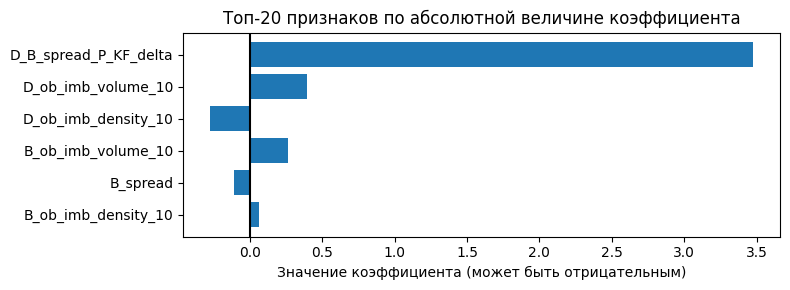

In [ ]:
features_cols_RF = [
    'D_B_spread_P_EWM_delta',
    'B_ob_imb_volume_1',
    'D_ob_imb_volume_2',
    'D_ob_imb_volume_1',
    'D_ob_imb_density_2',
    'B_ob_imb_volume_2',
    'B_ob_imb_density_2',
    'D_ob_imb_volume_3',
    'D_ob_imb_density_3',
    'B_ob_imb_volume_3',
    'B_ob_imb_density_3',
    'D_ob_imb_volume_5',
    'D_ob_imb_density_5',
    'B_ob_imb_volume_5',
    'B_ob_imb_density_5',
    'D_ob_imb_volume_10',
    'D_ob_imb_density_10',
    'B_ob_imb_volume_10',
    'B_ob_imb_density_10',
    'spot_agression',
    'D_B_spread_P_EWM_vel',
    'D_B_spread_P_EWM_acc',
]

features_cols_RF = [
    #'D_ob_imb_01',
    #'B_ob_imb_01',
    #'D_ob_ask_add',
    #'D_ob_bid_add',
    #'B_ob_ask_add',
    #'B_ob_bid_add',
    #'D_B_spread_P_EWM_delta',
    'D_B_spread_P_KF_delta',
    'D_ob_imb_volume_10',
    'B_ob_imb_volume_10',
    'B_ob_imb_density_10',
    'D_ob_imb_density_10',
    #'D_ob_imb_volume_1_rs',
    #'B_ob_imb_density_10_rs',
    #'B_ob_imb_volume_1_rs',
    #'D_spread',
    'B_spread',
    #'spot_agression'
    #'D_B_spread_P_KF_vel',
    #'D_B_spread_P_KF_acc',
    #'B_S_spread',

]

X = temt_df[features_cols_RF]
y = temt_df['y']

# === train/test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.5,
    shuffle=False
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

y_pred = lr.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2  = r2_score(y_test, y_pred)

print(f"MSE: {mse:.6f}")
print(f"MAE: {mae:.6f}")
print(f"R²:  {r2:.6f}")

coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': lr.coef_
})
coef_df['abs_coef'] = coef_df['coefficient'].abs()

top20 = (coef_df
         .sort_values('abs_coef', ascending=False)
         .head(10)
         .sort_values('abs_coef')
)

plt.figure(figsize=(8, 3))
plt.barh(top20['feature'], top20['coefficient'])
plt.xlabel('Значение коэффициента (может быть отрицательным)')
plt.title('Топ-20 признаков по абсолютной величине коэффициента')
plt.axvline(0, color='k')
plt.tight_layout()
plt.show()

In [ ]:
dfm = pd.DataFrame(y_test.values, columns=['real'])
dfm['pred'] = y_pred

In [ ]:
dfm['real'].sum(), dfm['real'].mean()

(np.float64(-5654073.81939713), np.float64(-6.913752635906694))

In [ ]:
grp = (
    dfm
    .groupby('pred', as_index=False)['real']
    .sum()
)
grp = grp.sort_values('pred', ascending=False).reset_index(drop=True)
grp['cum_real'] = grp['real'].cumsum()
grp['sum_real_if_th'] = grp['cum_real'].shift(1, fill_value=0)
best_idx = grp['sum_real_if_th'].idxmax()
th_         = grp.loc[best_idx, 'pred']
best_sum    = grp.loc[best_idx, 'sum_real_if_th']
print(f"Лучший порог th_ = {th_}")
print(f"Максимальная сумма real = {best_sum}")

Лучший порог th_ = 2.449935412325101
Максимальная сумма real = 23536.71423628088


In [ ]:
dfm[dfm['pred'] > 0.6]['real'].mean()

np.float64(0.0060147509278024635)

In [ ]:
lr.coef_

array([ 1.95110123e+02, -1.10458359e+00,  4.89145174e-01,  6.55318034e+01,
       -3.07500205e+01, -2.60896683e+03,  1.52145973e+03])

# TARGET without FEES with + 1

In [ ]:
n = len(df)
ticks_per_sec   = 20
offset_ticks    = ticks_per_sec * 60 * 15
window_ticks    = ticks_per_sec * 60 * 60
fee_Dx = fee_D
fee_Bx = fee_B

D2B_mean   = np.full(n, np.nan)
D2B_median = np.full(n, np.nan)
B2D_mean   = np.full(n, np.nan)
B2D_median = np.full(n, np.nan)

D_bid = df['D_ob_bid_price_0'].values
D_ask = df['D_ob_ask_price_0'].values
B_bid = df['B_ob_bid_price_0'].values
B_ask = df['B_ob_ask_price_0'].values

for i in range(n):
    entry_idx = i + 1
    if entry_idx >= n:
        continue

    start = entry_idx + offset_ticks
    if start >= n:
        continue
    end = min(start + window_ticks, n - 1)

    exit_slice = slice(start + 1, end + 1)

    slip_D = (D_ask[entry_idx] - D_bid[entry_idx]) / 2
    slip_B = (B_ask[entry_idx] - B_bid[entry_idx]) / 2

    pnl_D2B = (
        (D_bid[exit_slice] - D_ask[entry_idx])
      - (B_ask[exit_slice] - B_bid[entry_idx])

      - (D_ask[entry_idx] + D_bid[exit_slice]) * fee_Dx
      - (B_bid[entry_idx] + B_ask[exit_slice]) * fee_Bx

      - slip_D
      - slip_B
    )

    pnl_B2D = (
        -(D_ask[exit_slice] - D_bid[entry_idx])
      + (B_bid[exit_slice] - B_ask[entry_idx])
      - (D_bid[entry_idx] + D_ask[exit_slice]) * fee_Dx
      - (B_ask[entry_idx] + B_bid[exit_slice]) * fee_Bx
      - slip_D
      - slip_B
    )

    D2B_mean[i]   = np.mean(pnl_D2B)
    D2B_median[i] = np.median(pnl_D2B)
    B2D_mean[i]   = np.mean(pnl_B2D)
    B2D_median[i] = np.median(pnl_B2D)

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


In [ ]:
slip_D = np.nanmean((D_ask - D_bid)/2)
slip_B = np.nanmean((B_ask - B_bid)/2)
cost_D2B = fee_Dx + slip_D + fee_Bx + slip_B
cost_B2D = fee_Bx + slip_B + fee_Dx + slip_D
print(cost_D2B, cost_B2D)

0.53431916 0.53431916


In [ ]:
df['D2B_mean']   = D2B_mean
df['D2B_median'] = D2B_median
df['B2D_mean']   = B2D_mean
df['B2D_median'] = B2D_median

In [ ]:
df['D2B_mean'].mean(), df['D2B_median'].mean(), df['B2D_mean'].mean(), df['B2D_median'].mean()

(np.float64(-8.27005625879635),
 np.float64(-8.320103009988342),
 np.float64(-8.89744341695948),
 np.float64(-8.820442676572284))

In [ ]:
df[df['D_B_spread_P_EWM_delta'] < -0.032]['D2B_mean'].mean(), df[df['D_B_spread_P_EWM_delta'] < -0.032]['D2B_median'].mean()

(np.float64(0.025701458958299308), np.float64(0.01708528581675094))

In [ ]:
df[df['D_B_spread_P_EWM_delta'] > 0.075]['B2D_mean'].mean(), df[df['D_B_spread_P_EWM_delta'] > 0.075]['B2D_median'].mean()

(np.float64(0.5012064036306235), np.float64(0.04295198075213836))

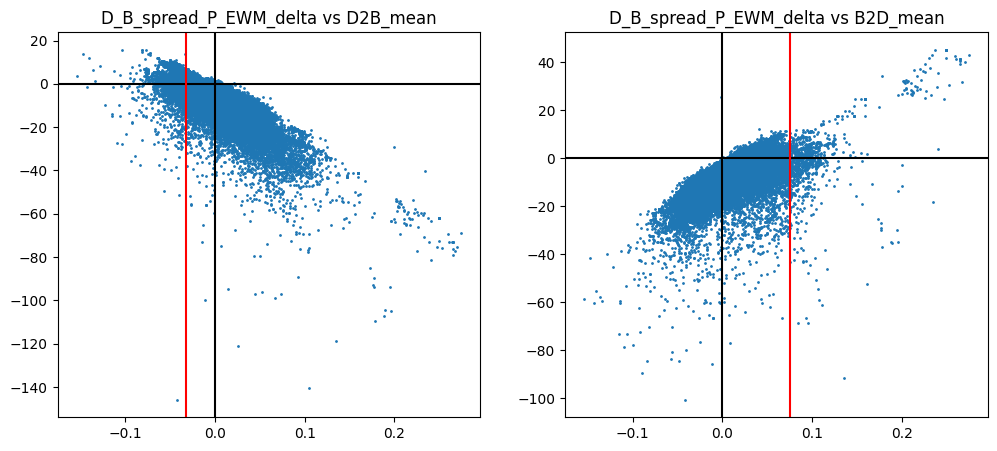

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.scatter(df['D_B_spread_P_EWM_delta'], df['D2B_mean'], s=1)
plt.axhline(0, color='k')
plt.axvline(0, color='k')
plt.axvline(-0.032, color='r')
plt.title('D_B_spread_P_EWM_delta vs D2B_mean')
plt.subplot(1, 2, 2)
plt.scatter(df['D_B_spread_P_EWM_delta'], df['B2D_mean'], s=1)
plt.axhline(0, color='k')
plt.axvline(0, color='k')
plt.axvline(0.075, color='r')
plt.title('D_B_spread_P_EWM_delta vs B2D_mean')
plt.show()

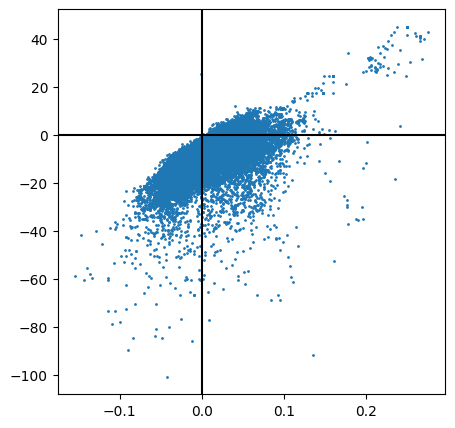

In [ ]:
plt.figure(figsize=(5,5))

plt.show()

# TARGET: hyp mean

In [ ]:
n = len(df)

ticks_per_sec = 20
offset_secs = 1
window_secs = 60*120
offset_ticks = ticks_per_sec * offset_secs
window_ticks = ticks_per_sec * window_secs

pnl_D2B = np.full(n, np.nan)
pnl_B2D = np.full(n, np.nan)

D_bid  = df['D_ob_bid_price_0'].values
D_ask  = df['D_ob_ask_price_0'].values
B_bid  = df['B_ob_bid_price_0'].values
B_ask  = df['B_ob_ask_price_0'].values
delta  = (df['D_B_spread_P'] - df['D_B_spread_P_EWM']).values

for i in range(n):

    if i % 10_000 == 0:
        print(i, ' of ', n)

    entry = i + 1
    if entry >= n:
        continue

    start = entry + offset_ticks
    if start >= n:
        continue
    end = min(start + window_ticks, n - 1)

    slip_D = (D_ask[entry] - D_bid[entry]) / 2
    slip_B = (B_ask[entry] - B_bid[entry]) / 2

    exit_idx = None
    for j in range(start, end + 1):
        if delta[j] >= 0:
            exit_idx = j
            break

    if exit_idx is not None:
        pnl = (
            (D_bid[exit_idx] - D_ask[entry])
            - (B_ask[exit_idx] - B_bid[entry])
            - (D_ask[entry] + D_bid[exit_idx]) * fee_D
            - (B_bid[entry] + B_ask[exit_idx]) * fee_B
            - slip_D - slip_B
        )
        pnl_D2B[i] = pnl

    exit_idx = None
    for j in range(start, end + 1):
        if delta[j] <= 0:
            exit_idx = j
            break

    if exit_idx is not None:
        pnl = (
            -(D_ask[exit_idx] - D_bid[entry])
            + (B_bid[exit_idx] - B_ask[entry])
            - (D_bid[entry] + D_ask[exit_idx]) * fee_D
            - (B_ask[entry] + B_bid[exit_idx]) * fee_B
            - slip_D - slip_B
        )
        pnl_B2D[i] = pnl

0  of  1728000
10000  of  1728000
20000  of  1728000
30000  of  1728000
40000  of  1728000
50000  of  1728000
60000  of  1728000
70000  of  1728000
80000  of  1728000
90000  of  1728000
100000  of  1728000
110000  of  1728000
120000  of  1728000
130000  of  1728000
140000  of  1728000
150000  of  1728000
160000  of  1728000
170000  of  1728000
180000  of  1728000
190000  of  1728000
200000  of  1728000
210000  of  1728000
220000  of  1728000
230000  of  1728000
240000  of  1728000
250000  of  1728000
260000  of  1728000
270000  of  1728000
280000  of  1728000
290000  of  1728000
300000  of  1728000
310000  of  1728000
320000  of  1728000
330000  of  1728000
340000  of  1728000
350000  of  1728000
360000  of  1728000
370000  of  1728000
380000  of  1728000
390000  of  1728000
400000  of  1728000
410000  of  1728000
420000  of  1728000
430000  of  1728000
440000  of  1728000
450000  of  1728000
460000  of  1728000
470000  of  1728000
480000  of  1728000
490000  of  1728000
500000  of  17

In [ ]:
df['D2B_cross_pnl'] = pnl_D2B
df['B2D_cross_pnl'] = pnl_B2D

In [ ]:
df['D2B_cross_pnl'].mean(), df['B2D_cross_pnl'].mean()

(np.float64(-6.387814898227339), np.float64(-6.67932895802329))

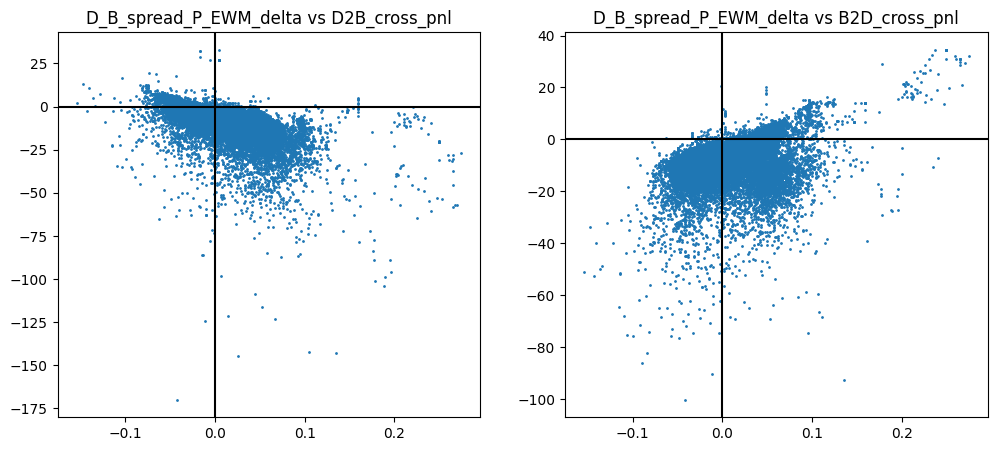

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.scatter(df['D_B_spread_P_EWM_delta'], df['D2B_cross_pnl'], s=1)
plt.axhline(0, color='k')
plt.axvline(0, color='k')
plt.title('D_B_spread_P_EWM_delta vs D2B_cross_pnl')
plt.subplot(1, 2, 2)
plt.scatter(df['D_B_spread_P_EWM_delta'], df['B2D_cross_pnl'], s=1)
plt.axhline(0, color='k')
plt.axvline(0, color='k')
plt.title('D_B_spread_P_EWM_delta vs B2D_cross_pnl')
plt.show()

# LR D2B

MSE: 0.934227
MAE: 0.561075
R²:  0.881294


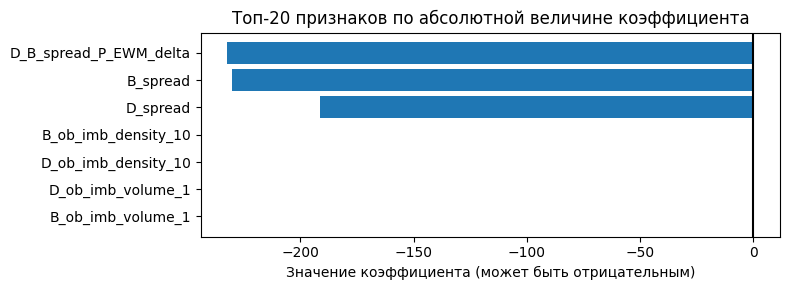

In [ ]:
df['y'] = df['D2B_cross_pnl']

temt_df = df[df['D_B_spread_P_EWM_delta'] < 0][features_cols + rolling_features_cols + ['y']].dropna().copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

temt_df = temt_df.iloc[20*60*30:]
temt_df = temt_df[:len(temt_df)-20*60*30]

temt_df['D_ob_ask_add'] = temt_df['D_ob_ask_add_volume_0'] / (temt_df['D_ob_ask_add_volume_0'] + temt_df['D_ob_ask_rem_volume_0'] + 1e-9)
temt_df['D_ob_bid_add'] = temt_df['D_ob_bid_add_volume_0'] / (temt_df['D_ob_bid_add_volume_0'] + temt_df['D_ob_bid_rem_volume_0'] + 1e-9)
temt_df['B_ob_ask_add'] = temt_df['B_ob_ask_add_volume_0'] / (temt_df['B_ob_ask_add_volume_0'] + temt_df['B_ob_ask_rem_volume_0'] + 1e-9)
temt_df['B_ob_bid_add'] = temt_df['B_ob_bid_add_volume_0'] / (temt_df['B_ob_bid_add_volume_0'] + temt_df['B_ob_bid_rem_volume_0'] + 1e-9)

temt_df['D_ob_imb_01'] = (temt_df['D_ob_ask_add'] - temt_df['D_ob_bid_add']) / (temt_df['D_ob_ask_add'] + temt_df['D_ob_bid_add'] + 1e-9)
temt_df['B_ob_imb_01'] = (temt_df['B_ob_ask_add'] - temt_df['B_ob_bid_add']) / (temt_df['B_ob_ask_add'] + temt_df['B_ob_bid_add'] + 1e-9)

features_cols_RF = [
    #'D_ob_imb_01',
    #'B_ob_imb_01',
    #'D_ob_ask_add',
    #'D_ob_bid_add',
    #'B_ob_ask_add',
    #'B_ob_bid_add',
    'D_B_spread_P_EWM_delta',
    #'D_B_spread_P_KF_delta',
    'D_ob_imb_volume_1',
    'B_ob_imb_volume_1',
    'B_ob_imb_density_10',
    'D_ob_imb_density_10',
    #'D_ob_imb_volume_1_rs',
    #'B_ob_imb_density_10_rs',
    #'B_ob_imb_volume_1_rs',
    'D_spread',
    'B_spread',
    #'spot_agression',
    #'D_B_spread_P_EWM_vel',
    #'D_B_spread_P_EWM_acc',
    #'B_S_spread',

]

X = temt_df[features_cols_RF]
y = temt_df['y']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.5,
    shuffle=False
)

# --- used for search common components

#scaler = StandardScaler()
#X_train_scaled = scaler.fit_transform(X_train)
#X_test_scaled  = scaler.transform(X_test)


# --- for real use, get coefs without scaling

X_train_scaled = X_train
X_test_scaled = X_test


lr = LinearRegression()
lr.fit(X_train_scaled, y_train)


y_pred = lr.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2  = r2_score(y_test, y_pred)

print(f"MSE: {mse:.6f}")
print(f"MAE: {mae:.6f}")
print(f"R²:  {r2:.6f}")

coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': lr.coef_
})

coef_df['abs_coef'] = coef_df['coefficient'].abs()
coef_df_d2b = coef_df.copy()


top20 = (coef_df
         .sort_values('abs_coef', ascending=False)
         .head(10)
         .sort_values('abs_coef')
)

plt.figure(figsize=(8, 3))
plt.barh(top20['feature'], top20['coefficient'])
plt.xlabel('Значение коэффициента (может быть отрицательным)')
plt.title('Топ-20 признаков по абсолютной величине коэффициента')
plt.axvline(0, color='k')
plt.tight_layout()
plt.show()

In [ ]:
y_pred_train = lr.predict(X_train_scaled)
dfm = pd.DataFrame(y_train.values, columns=['real'])
dfm['pred'] = y_pred_train

target_search = 'real'
grp = (
    dfm
    .groupby('pred', as_index=False)[target_search]
    .sum()
)
grp = grp.sort_values('pred', ascending=False).reset_index(drop=True)
grp['cum_real'] = grp[target_search].cumsum()
grp['sum_real_if_th'] = grp['cum_real'].shift(1, fill_value=0)
best_idx = grp['sum_real_if_th'].idxmax()
th_         = grp.loc[best_idx, 'pred']
best_sum    = grp.loc[best_idx, 'sum_real_if_th']
print(f"Лучший порог th_ = {th_}")
print(f"Максимальная сумма real = {best_sum}")
print(dfm[dfm['pred'] > 0]['real'].sum())

Лучший порог th_ = -0.01182518516814568
Максимальная сумма real = 30162.03754377365
30151.578370332718


In [ ]:
dfm = pd.DataFrame(y_test.values, columns=['real'])
dfm['pred'] = y_pred

target_search = 'real'
grp = (
    dfm
    .groupby('pred', as_index=False)[target_search]
    .sum()
)
grp = grp.sort_values('pred', ascending=False).reset_index(drop=True)
grp['cum_real'] = grp[target_search].cumsum()
grp['sum_real_if_th'] = grp['cum_real'].shift(1, fill_value=0)
best_idx = grp['sum_real_if_th'].idxmax()
th_         = grp.loc[best_idx, 'pred']
best_sum    = grp.loc[best_idx, 'sum_real_if_th']
print(f"Лучший порог th_ = {th_}")
print(f"Максимальная сумма real = {best_sum}")
print(dfm[dfm['pred'] > 0]['real'].sum())

Лучший порог th_ = 0.4278222492010757
Максимальная сумма real = 40191.86771631241
37328.24507713318


# LR B2D

MSE: 3.782713
MAE: 0.894350
R²:  0.679565


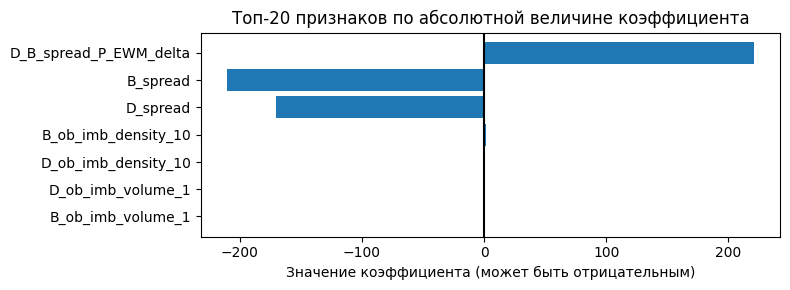

In [ ]:
df['y'] = df['B2D_cross_pnl']

temt_df = df[df['D_B_spread_P_EWM_delta'] > 0][features_cols + rolling_features_cols + ['y']].dropna().copy()
temt_df = temt_df.loc[:, ~temt_df.columns.duplicated()]

temt_df = temt_df.iloc[20*60*30:]
temt_df = temt_df[:len(temt_df)-20*60*30]

temt_df['D_ob_ask_add'] = temt_df['D_ob_ask_add_volume_0'] / (temt_df['D_ob_ask_add_volume_0'] + temt_df['D_ob_ask_rem_volume_0'] + 1e-9)
temt_df['D_ob_bid_add'] = temt_df['D_ob_bid_add_volume_0'] / (temt_df['D_ob_bid_add_volume_0'] + temt_df['D_ob_bid_rem_volume_0'] + 1e-9)
temt_df['B_ob_ask_add'] = temt_df['B_ob_ask_add_volume_0'] / (temt_df['B_ob_ask_add_volume_0'] + temt_df['B_ob_ask_rem_volume_0'] + 1e-9)
temt_df['B_ob_bid_add'] = temt_df['B_ob_bid_add_volume_0'] / (temt_df['B_ob_bid_add_volume_0'] + temt_df['B_ob_bid_rem_volume_0'] + 1e-9)

temt_df['D_ob_imb_01'] = (temt_df['D_ob_ask_add'] - temt_df['D_ob_bid_add']) / (temt_df['D_ob_ask_add'] + temt_df['D_ob_bid_add'] + 1e-9)
temt_df['B_ob_imb_01'] = (temt_df['B_ob_ask_add'] - temt_df['B_ob_bid_add']) / (temt_df['B_ob_ask_add'] + temt_df['B_ob_bid_add'] + 1e-9)

features_cols_RF = [
    #'D_ob_imb_01',
    #'B_ob_imb_01',
    #'D_ob_ask_add',
    #'D_ob_bid_add',
    #'B_ob_ask_add',
    #'B_ob_bid_add',
    'D_B_spread_P_EWM_delta',
    #'D_B_spread_P_KF_delta',
    'D_ob_imb_volume_1',
    'B_ob_imb_volume_1',
    'B_ob_imb_density_10',
    'D_ob_imb_density_10',
    #'D_ob_imb_volume_1_rs',
    #'B_ob_imb_density_10_rs',
    #'B_ob_imb_volume_1_rs',
    'D_spread',
    'B_spread',
    #'spot_agression',
    #'D_B_spread_P_EWM_vel',
    #'D_B_spread_P_EWM_acc',
    #'B_S_spread',

]

X = temt_df[features_cols_RF]
y = temt_df['y']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.5,
    shuffle=False
)

#scaler = StandardScaler()
#X_train_scaled = scaler.fit_transform(X_train)
#X_test_scaled  = scaler.transform(X_test)

X_train_scaled = X_train
X_test_scaled = X_test


lr = LinearRegression()
lr.fit(X_train_scaled, y_train)


y_pred = lr.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2  = r2_score(y_test, y_pred)

print(f"MSE: {mse:.6f}")
print(f"MAE: {mae:.6f}")
print(f"R²:  {r2:.6f}")


coef_df = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': lr.coef_
})

coef_df['abs_coef'] = coef_df['coefficient'].abs()
coef_df_b2d = coef_df.copy()


top20 = (coef_df
         .sort_values('abs_coef', ascending=False)
         .head(10)
         .sort_values('abs_coef')
)

plt.figure(figsize=(8, 3))
plt.barh(top20['feature'], top20['coefficient'])
plt.xlabel('Значение коэффициента (может быть отрицательным)')
plt.title('Топ-20 признаков по абсолютной величине коэффициента')
plt.axvline(0, color='k')
plt.tight_layout()
plt.show()

In [ ]:
y_pred_train = lr.predict(X_train_scaled)
dfm = pd.DataFrame(y_train.values, columns=['real'])
dfm['pred'] = y_pred_train

target_search = 'real'
grp = (
    dfm
    .groupby('pred', as_index=False)[target_search]
    .sum()
)
grp = grp.sort_values('pred', ascending=False).reset_index(drop=True)
grp['cum_real'] = grp[target_search].cumsum()
grp['sum_real_if_th'] = grp['cum_real'].shift(1, fill_value=0)
best_idx = grp['sum_real_if_th'].idxmax()
th_         = grp.loc[best_idx, 'pred']
best_sum    = grp.loc[best_idx, 'sum_real_if_th']
print(f"Лучший порог th_ = {th_}")
print(f"Максимальная сумма real = {best_sum}")
print(dfm[dfm['pred'] > 0]['real'].sum())

Лучший порог th_ = -0.22277590866318597
Максимальная сумма real = 9803.949455738068
8302.004578828812


In [ ]:
dfm = pd.DataFrame(y_test.values, columns=['real'])
dfm['pred'] = y_pred

target_search = 'real'
grp = (
    dfm
    .groupby('pred', as_index=False)[target_search]
    .sum()
)
grp = grp.sort_values('pred', ascending=False).reset_index(drop=True)
grp['cum_real'] = grp[target_search].cumsum()
grp['sum_real_if_th'] = grp['cum_real'].shift(1, fill_value=0)
best_idx = grp['sum_real_if_th'].idxmax()
th_         = grp.loc[best_idx, 'pred']
best_sum    = grp.loc[best_idx, 'sum_real_if_th']
print(f"Лучший порог th_ = {th_}")
print(f"Максимальная сумма real = {best_sum}")
print(dfm[dfm['pred'] > 0]['real'].sum())

Лучший порог th_ = 0.4310468413743651
Максимальная сумма real = 37839.58712005615
36358.589082717896


# COEFS

In [ ]:
coef_df_b2d

,feature,coefficient,abs_coef
0,D_B_spread_P_EWM_delta,220.620697,220.620697
1,D_ob_imb_volume_1,0.140114,0.140114
2,B_ob_imb_volume_1,-0.001411,0.001411
3,B_ob_imb_density_10,1.263858,1.263858
4,D_ob_imb_density_10,-0.314249,0.314249
5,D_spread,-170.401439,170.401439
6,B_spread,-210.285162,210.285162


In [ ]:
coef_df_d2b

,feature,coefficient,abs_coef
0,D_B_spread_P_EWM_delta,-232.343499,232.343499
1,D_ob_imb_volume_1,0.010519,0.010519
2,B_ob_imb_volume_1,0.009755,0.009755
3,B_ob_imb_density_10,0.097369,0.097369
4,D_ob_imb_density_10,0.021232,0.021232
5,D_spread,-191.517700,191.517700
6,B_spread,-230.113656,230.113656


In [ ]:
def y_b2d(delta, D_imb_volume_1, B_imb_volume_1, D_imb_density_10, B_imb_density_10, D_spread, B_spread):
    return 220.620697*delta + 0.140114*D_imb_volume_1 - 0.001411*B_imb_volume_1 - 0.314249*D_imb_density_10 + 1.263858*B_imb_density_10 - 170.401439*D_spread - 210.285162*B_spread

def y_d2b(delta, D_imb_volume_1, B_imb_volume_1, D_imb_density_10, B_imb_density_10, D_spread, B_spread):
    return -232.343499*delta + 0.010519*D_imb_volume_1 - 0.009755*B_imb_volume_1 - 0.021232*D_imb_density_10 + 0.097369*B_imb_density_10 - 191.517700*D_spread - 230.113656*B_spread

In [ ]:
y_b2d(0.0, -0.9, 0.0, 0.25, -0.25, 0.001, 0.001)

-0.9013159510000001

# Conclusion

As a result, for both D2B and B2D, we obtained almost mirror-image coefficients.

The market interpretation of all the variables used looks reasonable:

1) The difference between the moving average and the current spread.

2) Volume imbalance at the first level. In theory, we could filter and only open positions when the imbalance is within a desired range.

3) Price density imbalance.

4) Spread on both exchanges (since midprices are used for evaluation) - the wider the spread, the more uncertainty.

In real trading, these coefficients should be updated every few hours or daily, using a multi-day rolling window with decaying weights.

We currently don't have the ability to apply that kind of updating to this dataset.

As part of the backtest, it makes sense to try both a simple deviation from the average spread and a version that uses the regression coefficients.

The difference between the current theoretical PnL, calculated using this formula, can serve as an inverse risk metric - meaning the further we are from the average spread, the higher the probability of a return toward it, and the higher the potential profit.

During the backtest, we can test several sizing formulas, such as:

1) AMOUNT_MIN + ROUND(K * Y_D2B, T) - or Y_B2D

2) ROUND(AMOUNT_MIN * Y_D2B, T)

3) ROUND(AMOUNT_MIN * K * LOG(Y_D2B), T)

Additionally, new sets of coefficients will be computed for scenarios with higher fees.